## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## 1. Compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

## 2. Apply a distortion correction to raw images

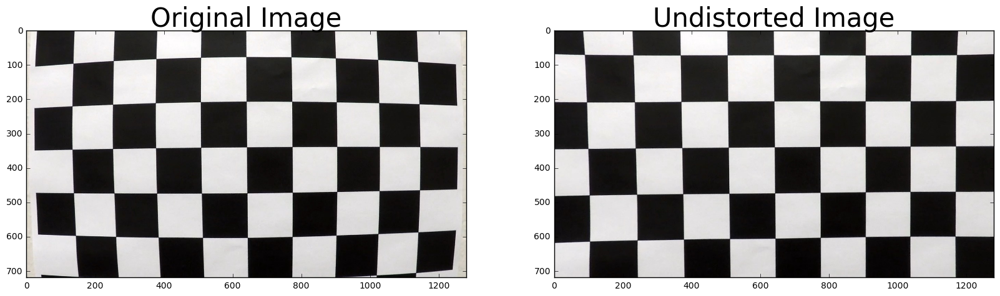

In [2]:
import pickle
%matplotlib inline

# Test undistortion on an image
#img = cv2.imread('test_images/test1.jpg')
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
#cv2.imwrite('output_images/test1_undist.jpg',dst)
cv2.imwrite('output_images/calibration1_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

## 3. Use color transforms, gradients, etc., to create a thresholded binary image

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


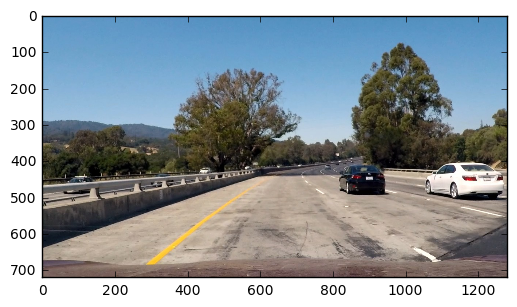

In [3]:
import matplotlib.image as mpimg

#reading in an image
im = mpimg.imread('test_images/test1.jpg')

#printing out some stats and plotting
print('This image is:', type(im), 'with dimesions:', im.shape)
plt.imshow(im)  # if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')

In [29]:
print(im.shape)

(720, 1280, 3)


In [162]:

def select_white_yellow(img):
    """Applies color selection for white and yellow"""
    hls_img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # white color mask
    lower = np.array([  0, 200,   0], dtype="uint8")
    upper = np.array([255, 255, 255], dtype="uint8")
    
    #lower = np.array([  0, 170,   0], dtype="uint8")
    white_mask = cv2.inRange(hls_img, lower, upper)
    # yellow color mask
    lower = np.array([ 10,   0, 100], dtype="uint8")
    upper = np.array([ 40, 255, 255], dtype="uint8")
    
    #lower = np.array([ 10,   0, 30], dtype="uint8")
    #lower = np.array([ 10,   0, 15], dtype="uint8")
    #upper = np.array([ 40, 255, 255], dtype="uint8")
    yellow_mask = cv2.inRange(hls_img, lower, upper)
    # combine the mask
    white_yellow_mask = cv2.bitwise_or(white_mask, yellow_mask)
    return cv2.bitwise_and(img, img, mask = white_yellow_mask)

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

## Helper Functions

In [5]:
def undistort(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

In [6]:
class Transformer():
    def __init__(self, img):
        (h, w) = (img.shape[0], img.shape[1]) # 720, 1280
        src = np.float32([[w // 2 - 76, h * .625], [w // 2 + 76, h * .625], [-100, h], [w + 100, h]])
        dst = np.float32([[100, 0], [w - 100, 0], [100, h], [w - 100, h]])    
        
        #src = np.array([[585, 460], [203, 720], [1127, 720], [695, 460]]).astype(np.float32)
        #dst = np.array([[320, 0], [320, 720], [960, 720], [960, 0]]).astype(np.float32)
        
        self.M = cv2.getPerspectiveTransform(src, dst)
        self.Minv = cv2.getPerspectiveTransform(dst, src)
        
    def warp(self, img):
        return cv2.warpPerspective(img, self.M, (img.shape[1], img.shape[0]))
    
    def unwarp(self, img):
        return cv2.warpPerspective(img, self.Minv, (img.shape[1], img.shape[0]))

In [7]:
# Create transformer object, this means that the transformer matrix only needs to be computed once
transform = Transformer(im)

In [8]:
def grad_abs_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_output

def grad_mag_thresh(img, sobel_kernel=3, thresh=(0, 255)):
    # Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1
    # Return the binary image
    return binary_output

def grad_dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    # Return the binary image
    return binary_output

def color_thresh(img, thresh=(0, 255)):
    binary_output = np.zeros_like(img)
    binary_output[(img > thresh[0]) & (img <= thresh[1])] = 1
    return binary_output

def get_mask(img, debug=False):
    hls = cv2.cvtColor(np.copy(img), cv2.COLOR_RGB2HLS).astype(np.float)
    s_channel = hls[:, :, 2]
    # Get a combination of all gradient thresholding masks
    gradient_x = grad_abs_thresh(s_channel, orient='x', sobel_kernel=5, thresh=(0, 255))
    gradient_y = grad_abs_thresh(s_channel, orient='y', sobel_kernel=5, thresh=(0, 255))
    magnitude = grad_mag_thresh(s_channel, sobel_kernel=3, thresh=(5, 255))
    direction = grad_dir_thresh(s_channel, sobel_kernel=3, thresh=(0.7, 1.3))
    gradient_mask = np.zeros_like(s_channel)
    #gradient_mask[((gradient_x == 1) & (gradient_y == 1)) | ((magnitude == 1) & (direction == 1))] = 1
    gradient_mask[((magnitude == 1) & (direction == 1))] = 1
    # Get a color thresholding mask
    #color_mask = color_thresh(s_channel, thresh=(170, 255))

    if debug:
        return np.dstack((np.zeros_like(s_channel), gradient_mask, color_mask))
    else:
        mask = np.zeros_like(gradient_mask)
        #mask[(gradient_mask == 1) | (color_mask == 1)] = 1
        mask[(gradient_mask == 1)] = 1
        
    return mask    


def get_maskC(img, debug=False):
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

    # Define color ranges and apply color mask
    #yellow_hsv_low  = np.array([ 0, 100, 100])
    yellow_hsv_low  = np.array([ 0, 100, 100])
    yellow_hsv_high = np.array([ 50, 255, 255])

    #white_hsv_low  = np.array([  20,   0,   180])
    white_hsv_low  = np.array([  20,   0,   160])
    white_hsv_high = np.array([ 255,  80, 255])
    # get yellow and white masks 
    mask_yellow = cv2.inRange(hsv, yellow_hsv_low, yellow_hsv_high)
    mask_white = cv2.inRange(hsv, white_hsv_low, white_hsv_high)
    # Combine white and yellow masks into 1
    mask_color = cv2.bitwise_or(mask_yellow, mask_white)
    print(mask_color)
    
    binary_output = np.zeros_like(hsv[:, :, 0])
    binary_output[(mask_color >= 1)] = 1
    return binary_output

In [279]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        self.last_l_poly = None
        self.last_r_poly = None
        self.last_curv = None
        self.h = 720
        self.w = 1280
        self.debug_img = None
        
    def find_lines(self, binary_warped, debug=False):
        self.h = binary_warped.shape[0]
        self.w = binary_warped.shape[1]
        
        # Assuming you have created a warped binary image called "binary_warped"
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds] 

        print('len leftx: %d' % (len(leftx)))
        print('len rightx: %d' % (len(rightx)))

        # Fit a second order polynomial to each
        if (len(leftx) >= 500):
            l_poly = np.polyfit(lefty, leftx, 2)
        else:
            l_poly = self.last_l_poly
            
        if (len(rightx) >= 500):
            r_poly = np.polyfit(righty, rightx, 2)
        else:
            r_poly = self.last_r_poly
            
        # Update polynomials using weighted average with last frame
        if self.last_l_poly is None:
            # If first frame, initialise poly
            self.last_l_poly = l_poly
            self.last_r_poly = r_poly
        else:
            # Otherwise, update poly with low pass filtering
            l_poly = 0.8 * self.last_l_poly + 0.2 * l_poly
            r_poly = 0.8 * self.last_r_poly + 0.2 * r_poly
            self.last_l_poly = l_poly
            self.last_r_poly = r_poly

        if debug == True:
            ploty = np.linspace(0, self.h - 1, self.h)
            
            poly = self.last_l_poly
            plotx = poly[0] * ploty ** 2 + poly[1] * ploty + poly[2]
            plotx = np.array(plotx, np.int32)
            ploty = np.array(ploty, np.int32)
            pts = np.dstack((plotx,ploty))
            cv2.polylines(out_img, [pts], False, (0,255,255), 3)
            
            poly = self.last_r_poly
            plotx = poly[0] * ploty ** 2 + poly[1] * ploty + poly[2]
            plotx = np.array(plotx, np.int32)
            ploty = np.array(ploty, np.int32)
            pts = np.dstack((plotx,ploty))
            cv2.polylines(out_img, [pts], False, (0,255,255), 3)
            self.debug_img = out_img
            
            
        # Fit new polynomial
        return out_img

    # Plot the polygons on the image
    def plot_poly_orig(self, orig):
        fitl = self.last_l_poly
        fitr = self.last_r_poly
        if fitl == None or fitr == None:
            return orig
        # Draw lines from polynomials
        ploty = np.linspace(0, orig.shape[0]-1, orig.shape[0])
        fitl = fitl[0]*ploty**2 + fitl[1]*ploty + fitl[2]
        fitr = fitr[0]*ploty**2 + fitr[1]*ploty + fitr[2]

        pts_left = np.array([np.transpose(np.vstack([fitl, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([fitr, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Create an overlay from the lane lines
        overlay = np.zeros_like(orig).astype(np.uint8)
        cv2.fillPoly(overlay, np.int_([pts]), (0,255, 0))

        # Apply inverse transform to the overlay to plot it on the original road
        overlay = transform.unwarp(overlay)

        # Add the overlay to the original unwarped image
        result = cv2.addWeighted(orig, 1, overlay, 0.3, 0)
        
        s_img = cv2.resize(self.debug_img, (300, 300))
        result[0:300, -1-300:-1] = s_img
        return result
    
    # Calculate the lane line curvature
    def find_curvature(self):
        yscale = 30 / 720 # meters per pixel in y dimension
        xscale = 3.7 / 700 # meters per pixel in x dimension

        # Convert polynomial to set of points for refitting
        ploty = np.linspace(0, self.h - 1, self.h)
        
        l_poly = self.last_l_poly
        plotx = l_poly[0] * ploty ** 2 + l_poly[1] * ploty + l_poly[2]
        # Fit new polynomial
        poly_cur = np.polyfit(ploty * yscale, plotx * xscale, 2)
        # Calculate curve radius
        l_curv = ((1 + (2 * poly_cur[0] * np.max(ploty) * yscale + poly_cur[1]) ** 2) ** 1.5) / np.absolute(2 * poly_cur[0])
        
        r_poly = self.last_r_poly.copy()
        plotx = r_poly[0] * ploty ** 2 + r_poly[1] * ploty + r_poly[2]
        # Fit new polynomial
        poly_cur = np.polyfit(ploty * yscale, plotx * xscale, 2)
        # Calculate curve radius
        r_curv = ((1 + (2 * poly_cur[0] * np.max(ploty) * yscale + poly_cur[1]) ** 2) ** 1.5) / np.absolute(2 * poly_cur[0])
          
        # Calculate the lane curvature radius
        curv = (l_curv + r_curv) / 2.0
        
        # Update polynomials using weighted average with last frame
        if self.last_curv is None:
            # If first frame, initialise poly
            self.last_curv = curv
        else:
            # Otherwise, update poly with low pass filtering
            curv = 0.8 * self.last_curv + 0.2 * curv
            self.last_curv = curv
        
        return curv

    # Find the offset of the car and the base of the lane lines
    def find_offset(self):
        l_poly = self.last_l_poly
        r_poly = self.last_r_poly
        
        lane_width = 3.7  # metres
        h = self.h  # height of image (index of image bottom)
        w = self.w  # width of image

        # Find the bottom pixel of the lane lines
        l_px = l_poly[0] * h ** 2 + l_poly[1] * h + l_poly[2]
        r_px = r_poly[0] * h ** 2 + r_poly[1] * h + r_poly[2]

        # Find the midpoint
        midpoint = (l_px + r_px) / 2.0

        # Find the offset from the centre of the frame, and then multiply by scale
        offset = (w/2 - midpoint) 
        
        # Find the number of pixels per real metre
        scale = lane_width / np.abs(l_px - r_px)
        offset *= scale
        
        return offset



## Pipeline

In [277]:


def process_image(img):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    
    img = undistort(img, mtx, dist)

    
    # Keep the untransformed image for later
    orig = img.copy()
    #img = get_mask(img)
    
    img = select_white_yellow(img)
    img = grayscale(img)
    #img = cv2.equalizeHist(img)
    
    img = transform.warp(img)
    
    #dbg = img.copy()
    #return dbg
    
    dbg = tracker.find_lines(img, debug = True)
    curvature = tracker.find_curvature()
    
    # Create image
    final = tracker.plot_poly_orig(orig)
        
    # Write radius on image
    cv2.putText(final, 'Curvature: {}m'.format(int(curvature)), (10, 50), cv2.FONT_HERSHEY_DUPLEX, 1.5, (255,255,255))
    
    # Write lane offset on image
    offset = tracker.find_offset()
    cv2.putText(final, 'Lane Offset: {}m'.format(round(offset, 4)), (10, 100), cv2.FONT_HERSHEY_DUPLEX, 1.5, (255,255,255))
    
    #return dbg
    return final
    

len leftx: 27753
len rightx: 7754
roots: 
[-282.37715043+3694.89402687j -282.37715043-3694.89402687j]


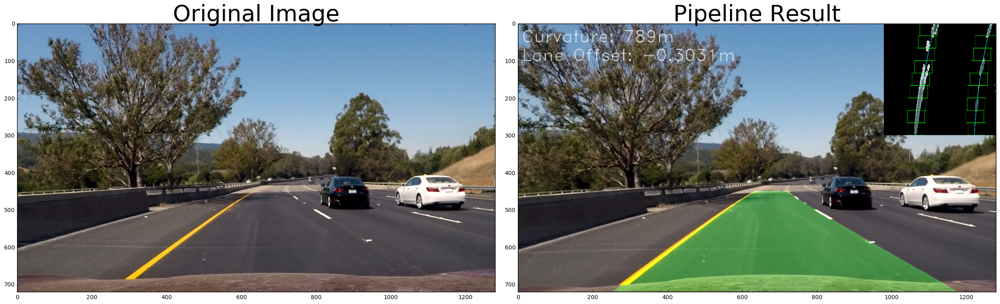

In [278]:

original = mpimg.imread('test_images/test6.jpg')
tracker = Line()
result = process_image(original)


# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(original)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
    
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

len leftx: 21194
len rightx: 6309
roots: 
[ 279.41853574+2177.10674923j  279.41853574-2177.10674923j]
len leftx: 63298
len rightx: 9514
roots: 
[ 555.73141721+1567.67364625j  555.73141721-1567.67364625j]
len leftx: 27753
len rightx: 7754
roots: 
[-282.37715043+3694.89402687j -282.37715043-3694.89402687j]
len leftx: 28580
len rightx: 5602
roots: 
[ 362.14528104+1858.4150826j  362.14528104-1858.4150826j]
len leftx: 69863
len rightx: 11857
roots: 
[ 788.88399934+2025.31519563j  788.88399934-2025.31519563j]
len leftx: 18012
len rightx: 6034
roots: 
[ 2259.88860663 -1272.15272197]


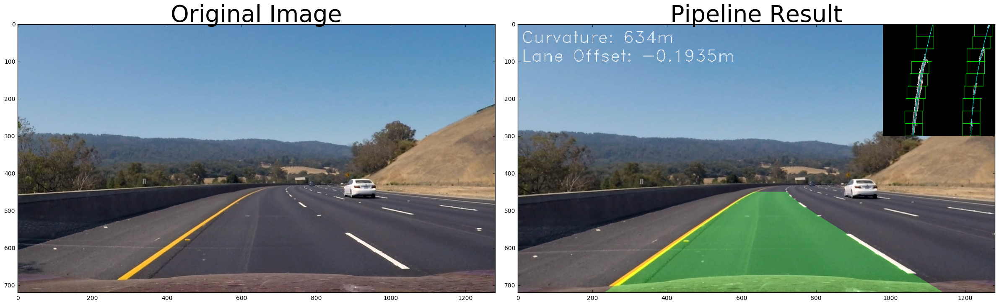

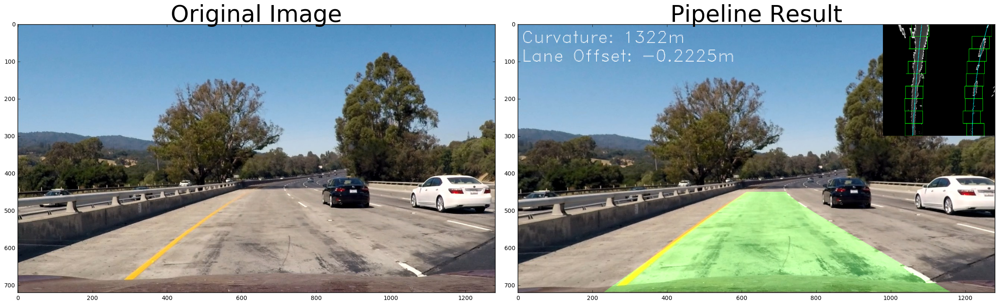

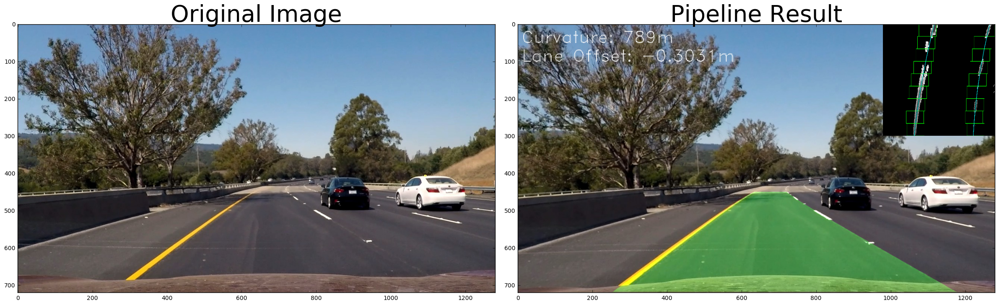

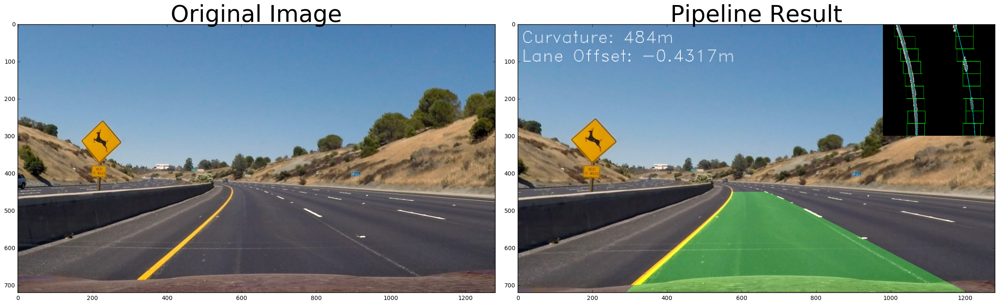

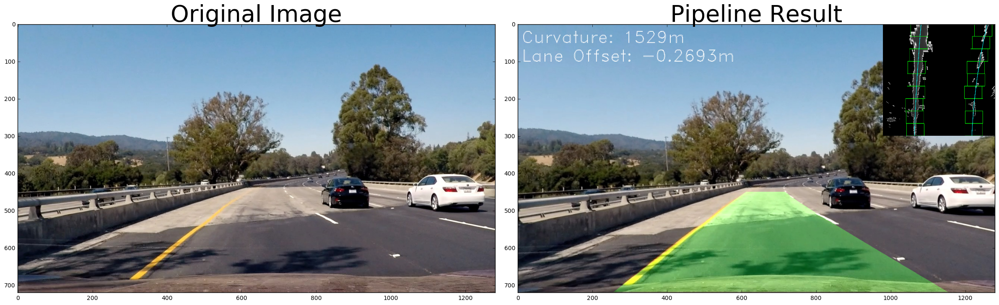

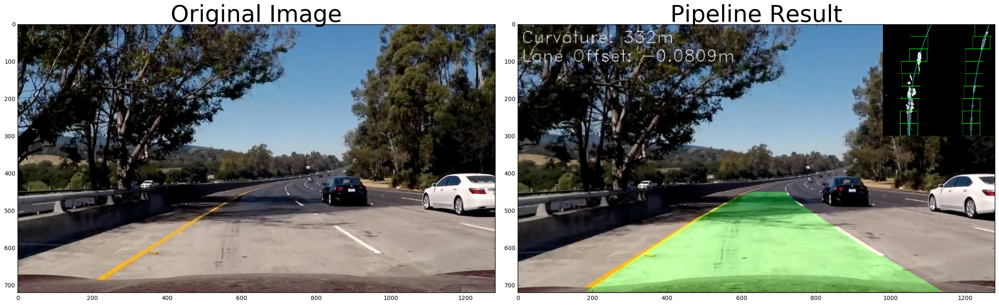

In [264]:
# test case
images = glob.glob('test_images/test*.jpg')
for idx, fname in enumerate(images):
    original = mpimg.imread(fname)
    tracker = Line()
    result = process_image(original)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(original)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)

len leftx: 1922
len rightx: 1075


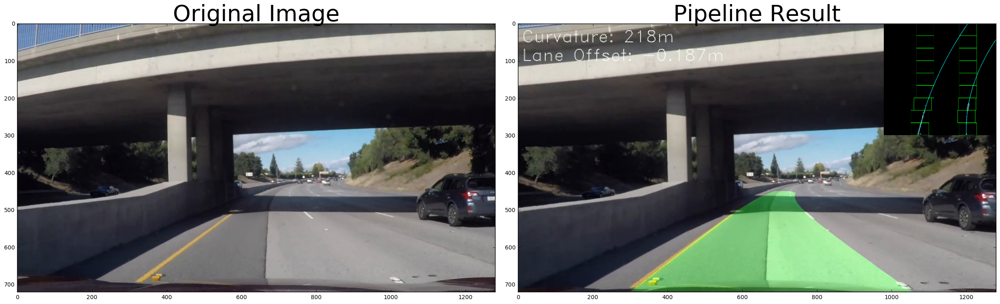

In [286]:
original = mpimg.imread('debug/image120.jpg')
tracker = Line()
result = process_image(original)


# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(original)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
    
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Test on Videos

In [20]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [266]:
tracker = Line()

white_output = 'project_video_out1.mp4'
#clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

len leftx: 30446
len rightx: 7910
roots: 
[ 332.87363127+1981.62579992j  332.87363127-1981.62579992j]
[MoviePy] >>>> Building video project_video_out1.mp4
[MoviePy] Writing video project_video_out1.mp4


  0%|          | 2/1261 [00:00<01:36, 13.10it/s]

len leftx: 30446
len rightx: 7910
roots: 
[ 332.87363127+1981.62579992j  332.87363127-1981.62579992j]
len leftx: 30634
len rightx: 8378
roots: 
[ 258.43623986+2334.80453531j  258.43623986-2334.80453531j]
len leftx: 31690
len rightx: 7520
roots: 
[ 186.9995288+2568.69958692j  186.9995288-2568.69958692j]


  0%|          | 6/1261 [00:00<01:22, 15.15it/s]

len leftx: 31150
len rightx: 7093
roots: 
[ 57.60459982+2948.88590608j  57.60459982-2948.88590608j]
len leftx: 31213
len rightx: 6904
roots: 
[-164.62011328+3544.8689705j -164.62011328-3544.8689705j]
len leftx: 29963
len rightx: 6384
roots: 
[ 118.82144003+2506.55296947j  118.82144003-2506.55296947j]
len leftx: 29198
len rightx: 6081
roots: 
[ 203.06872886+2371.047697j  203.06872886-2371.047697j]


  1%|          | 10/1261 [00:00<01:15, 16.58it/s]

len leftx: 29465
len rightx: 5744
roots: 
[ 227.98335364+1882.18926906j  227.98335364-1882.18926906j]
len leftx: 30456
len rightx: 5508
roots: 
[ 272.33319632+1935.47036679j  272.33319632-1935.47036679j]
len leftx: 30129
len rightx: 7447
roots: 
[ 198.11915303+2405.98319122j  198.11915303-2405.98319122j]
len leftx: 28861
len rightx: 7067
roots: 
[ 178.8886717+2410.1198671j  178.8886717-2410.1198671j]


  1%|          | 14/1261 [00:00<01:12, 17.24it/s]

len leftx: 28536
len rightx: 8313
roots: 
[ 364.11862541+2490.5128921j  364.11862541-2490.5128921j]
len leftx: 28800
len rightx: 6874
roots: 
[ 327.01047224+2415.71864292j  327.01047224-2415.71864292j]
len leftx: 28631
len rightx: 7459
roots: 
[ 242.41959222+2871.14265033j  242.41959222-2871.14265033j]
len leftx: 28326
len rightx: 6809
roots: 
[ 181.56792698+2290.79036644j  181.56792698-2290.79036644j]


  1%|▏         | 18/1261 [00:01<01:10, 17.59it/s]

len leftx: 27158
len rightx: 5961
roots: 
[ 186.92265689+2104.36434599j  186.92265689-2104.36434599j]
len leftx: 27528
len rightx: 6300
roots: 
[ 36.52220197+2434.92875487j  36.52220197-2434.92875487j]
len leftx: 26698
len rightx: 5704
roots: 
[ 127.71102345+2091.71139734j  127.71102345-2091.71139734j]
len leftx: 27387
len rightx: 5144
roots: 
[ 191.61389009+2097.98444369j  191.61389009-2097.98444369j]


  2%|▏         | 22/1261 [00:01<01:08, 18.16it/s]

len leftx: 26797
len rightx: 4824
roots: 
[ 282.98795753+1931.28800806j  282.98795753-1931.28800806j]
len leftx: 27075
len rightx: 4961
roots: 
[ 326.45208011+1839.87321368j  326.45208011-1839.87321368j]
len leftx: 27954
len rightx: 4979
roots: 
[ 396.28068012+2969.97877461j  396.28068012-2969.97877461j]
len leftx: 28274
len rightx: 5355
roots: 
[ 481.10227933+2705.41957253j  481.10227933-2705.41957253j]


  2%|▏         | 26/1261 [00:01<01:09, 17.82it/s]

len leftx: 28708
len rightx: 4964
roots: 
[ 381.05248147+2032.63611709j  381.05248147-2032.63611709j]
len leftx: 28456
len rightx: 7112
roots: 
[ 258.84770802+2707.95018966j  258.84770802-2707.95018966j]
len leftx: 28733
len rightx: 6817
roots: 
[ 367.13652722+2730.85622911j  367.13652722-2730.85622911j]
len leftx: 28743
len rightx: 6507
roots: 
[ 393.17361283+2602.31273137j  393.17361283-2602.31273137j]


  2%|▏         | 30/1261 [00:01<01:10, 17.48it/s]

len leftx: 28495
len rightx: 6596
roots: 
[ 492.50981003+2390.74789295j  492.50981003-2390.74789295j]
len leftx: 29049
len rightx: 8229
roots: 
[ 392.86130804+2362.50197287j  392.86130804-2362.50197287j]
len leftx: 27776
len rightx: 6894
roots: 
[ 333.16078194+2035.01788126j  333.16078194-2035.01788126j]
len leftx: 26609
len rightx: 6284
roots: 
[ 249.7809646+2008.24034803j  249.7809646-2008.24034803j]


  3%|▎         | 34/1261 [00:01<01:10, 17.45it/s]

len leftx: 26290
len rightx: 5270
roots: 
[ 198.95638216+1864.21458082j  198.95638216-1864.21458082j]
len leftx: 27102
len rightx: 5061
roots: 
[ 271.00694932+1656.47766887j  271.00694932-1656.47766887j]
len leftx: 25727
len rightx: 4457
roots: 
[ 327.92196787+1201.9851062j  327.92196787-1201.9851062j]
len leftx: 25434
len rightx: 4526
roots: 
[ 320.76349268+1298.96340117j  320.76349268-1298.96340117j]


  3%|▎         | 38/1261 [00:02<01:11, 17.10it/s]

len leftx: 25383
len rightx: 4439
roots: 
[ 299.76144856+1415.13145701j  299.76144856-1415.13145701j]
len leftx: 25770
len rightx: 4610
roots: 
[ 232.58121925+1759.81632099j  232.58121925-1759.81632099j]
len leftx: 27617
len rightx: 4421
roots: 
[ 273.91072225+1535.66749538j  273.91072225-1535.66749538j]
len leftx: 26423
len rightx: 5667
roots: 
[ 117.10249692+1950.26201861j  117.10249692-1950.26201861j]


  3%|▎         | 42/1261 [00:02<01:08, 17.86it/s]

len leftx: 26522
len rightx: 5180
roots: 
[ 167.5253622+1966.29608656j  167.5253622-1966.29608656j]
len leftx: 26012
len rightx: 4998
roots: 
[ 175.37476481+1941.47263231j  175.37476481-1941.47263231j]
len leftx: 26413
len rightx: 4886
roots: 
[ 207.81740669+1922.84016109j  207.81740669-1922.84016109j]
len leftx: 26863
len rightx: 6121
roots: 
[ 27.21408977+2613.00664731j  27.21408977-2613.00664731j]


  4%|▎         | 46/1261 [00:02<01:09, 17.49it/s]

len leftx: 27782
len rightx: 5833
roots: 
[ 136.17807646+2687.41215324j  136.17807646-2687.41215324j]
len leftx: 27277
len rightx: 5367
roots: 
[ 154.87475381+2983.48571751j  154.87475381-2983.48571751j]
len leftx: 28105
len rightx: 4780
roots: 
[ 298.80398874+1886.10072886j  298.80398874-1886.10072886j]
len leftx: 27872
len rightx: 4654
roots: 
[ 377.04936045+1537.28305342j  377.04936045-1537.28305342j]


  4%|▍         | 48/1261 [00:02<01:11, 17.00it/s]

len leftx: 27597
len rightx: 4962
roots: 
[ 324.14675018+1813.17953687j  324.14675018-1813.17953687j]
len leftx: 28674
len rightx: 4711
roots: 
[ 395.73277372+1846.90551764j  395.73277372-1846.90551764j]
len leftx: 27940
len rightx: 6262
roots: 
[ 188.78427224+3632.47596851j  188.78427224-3632.47596851j]


  4%|▍         | 52/1261 [00:03<01:15, 16.04it/s]

len leftx: 27815
len rightx: 5338
roots: 
[ 266.31675973+3308.40475672j  266.31675973-3308.40475672j]
len leftx: 28075
len rightx: 4403
roots: 
[ 257.90988582+2818.03128856j  257.90988582-2818.03128856j]
len leftx: 27534
len rightx: 6010
roots: 
[-3903.02955297+10071.6624447j -3903.02955297-10071.6624447j]
len leftx: 26221
len rightx: 5501
roots: 
[-12230.46963961+11473.46214194j -12230.46963961-11473.46214194j]


  4%|▍         | 56/1261 [00:03<01:16, 15.80it/s]

len leftx: 27540
len rightx: 5315
roots: 
[-2887.00722393+8566.97834253j -2887.00722393-8566.97834253j]
len leftx: 27785
len rightx: 5670
roots: 
[ 7990.66967871 -3984.67755648]
len leftx: 27542
len rightx: 5204
roots: 
[ 14758.22883181  -5214.88078324]
len leftx: 28926
len rightx: 4734
roots: 
[-20.77361969+2942.07223359j -20.77361969-2942.07223359j]


  5%|▍         | 62/1261 [00:03<01:15, 15.86it/s]

len leftx: 26873
len rightx: 3784
roots: 
[ 224.70481408+1556.49373313j  224.70481408-1556.49373313j]
len leftx: 25740
len rightx: 4290
roots: 
[ 156.01735445+1643.6075033j  156.01735445-1643.6075033j]
len leftx: 25514
len rightx: 5941
roots: 
[-770.29684243+2971.87005538j -770.29684243-2971.87005538j]
len leftx: 23894
len rightx: 5501
roots: 
[-676.11548323+2749.20923589j -676.11548323-2749.20923589j]


  5%|▌         | 64/1261 [00:03<01:14, 16.09it/s]

len leftx: 25096
len rightx: 5360
roots: 
[-402.35285601+2598.09451012j -402.35285601-2598.09451012j]
len leftx: 24110
len rightx: 5284
roots: 
[-230.69861004+2290.04103369j -230.69861004-2290.04103369j]
len leftx: 25517
len rightx: 5496
roots: 
[ 0.00559519+2062.9338705j  0.00559519-2062.9338705j]
len leftx: 24569
len rightx: 5529
roots: 
[-7.01325442+1993.82942109j -7.01325442-1993.82942109j]


  6%|▌         | 70/1261 [00:04<01:14, 16.01it/s]

len leftx: 25440
len rightx: 5786
roots: 
[-162.12343466+2318.80390701j -162.12343466-2318.80390701j]
len leftx: 25993
len rightx: 5480
roots: 
[-25.91582471+2117.25736703j -25.91582471-2117.25736703j]
len leftx: 25006
len rightx: 4942
roots: 
[-202.58889839+2338.10299508j -202.58889839-2338.10299508j]
len leftx: 25406
len rightx: 6129
roots: 
[ 5964.54993742 -2364.79718751]


  6%|▌         | 74/1261 [00:04<01:12, 16.43it/s]

len leftx: 25405
len rightx: 5113
roots: 
[ 6649.20442584 -2568.87556091]
len leftx: 25327
len rightx: 4991
roots: 
[ 4403.64498193 -2057.95244911]
len leftx: 25541
len rightx: 5238
roots: 
[ 33337.89611167  -5451.59823727]
len leftx: 25093
len rightx: 6607
roots: 
[ 3401.20757534 -1614.86323754]


  6%|▌         | 78/1261 [00:04<01:11, 16.50it/s]

len leftx: 26916
len rightx: 7107
roots: 
[ 3302.14542314 -1712.29087363]
len leftx: 26733
len rightx: 6535
roots: 
[ 3527.50017145 -1787.76343966]
len leftx: 26812
len rightx: 7058
roots: 
[ 2781.46307802 -1563.7455144 ]
len leftx: 27421
len rightx: 7243
roots: 
[ 2998.85596049 -1779.44582798]


  6%|▋         | 80/1261 [00:04<01:12, 16.38it/s]

len leftx: 27136
len rightx: 7144
roots: 
[ 3107.20559501 -1850.70059788]
len leftx: 27378
len rightx: 6673
roots: 
[ 3635.23569066 -2226.42848802]
len leftx: 28021
len rightx: 6003
roots: 
[ 3557.3442259  -1915.44513575]
len leftx: 28235
len rightx: 5640
roots: 
[ 5121.0470022 -2848.7642179]


  7%|▋         | 86/1261 [00:05<01:12, 16.16it/s]

len leftx: 27507
len rightx: 5409
roots: 
[-1172.78383618+5208.13854719j -1172.78383618-5208.13854719j]
len leftx: 28668
len rightx: 6131
roots: 
[-923.00242261+6140.52478621j -923.00242261-6140.52478621j]
len leftx: 28178
len rightx: 6385
roots: 
[-271.02309143+4120.32978982j -271.02309143-4120.32978982j]
len leftx: 27611
len rightx: 8100
roots: 
[-2769.21918782+8439.51484517j -2769.21918782-8439.51484517j]


  7%|▋         | 90/1261 [00:05<01:10, 16.54it/s]

len leftx: 27376
len rightx: 6723
roots: 
[-193.4096117+2811.50550487j -193.4096117-2811.50550487j]
len leftx: 25835
len rightx: 6852
roots: 
[-307.90358935+2638.44318224j -307.90358935-2638.44318224j]
len leftx: 26114
len rightx: 6472
roots: 
[-179.5227156+2275.69180078j -179.5227156-2275.69180078j]
len leftx: 24586
len rightx: 5738
roots: 
[-101.48513537+1952.16159586j -101.48513537-1952.16159586j]


  7%|▋         | 92/1261 [00:05<01:11, 16.36it/s]

len leftx: 25728
len rightx: 6203
roots: 
[-14.20119794+1946.01695132j -14.20119794-1946.01695132j]
len leftx: 26025
len rightx: 6087
roots: 
[-44.15494562+2076.6751578j -44.15494562-2076.6751578j]
len leftx: 25056
len rightx: 6014
roots: 
[ 38.87250257+1801.88432771j  38.87250257-1801.88432771j]
len leftx: 24990
len rightx: 5552
roots: 
[ 43.04614125+1807.42008449j  43.04614125-1807.42008449j]


  8%|▊         | 98/1261 [00:05<01:08, 17.06it/s]

len leftx: 25301
len rightx: 5306
roots: 
[ 69.5669709+1893.5955877j  69.5669709-1893.5955877j]
len leftx: 24878
len rightx: 6131
roots: 
[-176.72975656+2575.1804872j -176.72975656-2575.1804872j]
len leftx: 24808
len rightx: 6249
roots: 
[-131.15857454+2529.8419653j -131.15857454-2529.8419653j]
len leftx: 25993
len rightx: 6592
roots: 
[-13.33843896+2504.49471172j -13.33843896-2504.49471172j]


  8%|▊         | 102/1261 [00:06<01:08, 17.03it/s]

len leftx: 25344
len rightx: 5453
roots: 
[-63.83937503+2480.89828441j -63.83937503-2480.89828441j]
len leftx: 25679
len rightx: 5998
roots: 
[ 44.13906106+2435.87175806j  44.13906106-2435.87175806j]
len leftx: 26270
len rightx: 6868
roots: 
[-57.34233457+2681.33506568j -57.34233457-2681.33506568j]
len leftx: 27197
len rightx: 6349
roots: 
[-18.46147775+2533.66446079j -18.46147775-2533.66446079j]


  8%|▊         | 106/1261 [00:06<01:07, 17.15it/s]

len leftx: 26535
len rightx: 6278
roots: 
[ 6.55650738+2540.82528256j  6.55650738-2540.82528256j]
len leftx: 27403
len rightx: 6116
roots: 
[ 64.54859294+2327.36823809j  64.54859294-2327.36823809j]
len leftx: 28058
len rightx: 6571
roots: 
[ 196.10030763+2293.8217441j  196.10030763-2293.8217441j]
len leftx: 28630
len rightx: 6157
roots: 
[ 265.33769935+2156.76188546j  265.33769935-2156.76188546j]


  9%|▊         | 108/1261 [00:06<01:10, 16.26it/s]

len leftx: 28301
len rightx: 6009
roots: 
[ 317.54859745+2080.86622006j  317.54859745-2080.86622006j]
len leftx: 28085
len rightx: 5239
roots: 
[ 278.63748747+1905.90602892j  278.63748747-1905.90602892j]
len leftx: 28299
len rightx: 4819
roots: 
[ 332.4020873+1407.92569818j  332.4020873-1407.92569818j]
len leftx: 28662
len rightx: 4803
roots: 
[ 345.96449665+1394.34645223j  345.96449665-1394.34645223j]


  9%|▉         | 112/1261 [00:06<01:11, 16.14it/s]

len leftx: 29514
len rightx: 5502
roots: 
[-4.40995896+3313.05265672j -4.40995896-3313.05265672j]
len leftx: 29640
len rightx: 5058
roots: 
[ 352.62777149+2222.87293656j  352.62777149-2222.87293656j]
len leftx: 28247
len rightx: 6022
roots: 
[ 96.78889427+2934.61593037j  96.78889427-2934.61593037j]
len leftx: 27962
len rightx: 6894
roots: 
[-768.46581005+4909.64953258j -768.46581005-4909.64953258j]


  9%|▉         | 116/1261 [00:06<01:15, 15.19it/s]

len leftx: 28335
len rightx: 6227
roots: 
[-395.52425174+3565.58941239j -395.52425174-3565.58941239j]
len leftx: 28195
len rightx: 5991
roots: 
[-112.04206133+2802.77596419j -112.04206133-2802.77596419j]
len leftx: 28631
len rightx: 5522
roots: 
[-57.98570492+2711.04636061j -57.98570492-2711.04636061j]
len leftx: 27709
len rightx: 5935
roots: 
[-422.0111585+3352.74765597j -422.0111585-3352.74765597j]


 10%|▉         | 120/1261 [00:07<01:14, 15.30it/s]

len leftx: 27644
len rightx: 5441
roots: 
[-304.12001646+3172.028957j -304.12001646-3172.028957j]
len leftx: 26286
len rightx: 4740
roots: 
[-160.79826556+2588.88435821j -160.79826556-2588.88435821j]
len leftx: 27017
len rightx: 4415
roots: 
[ 57.54714509+2082.14238893j  57.54714509-2082.14238893j]
len leftx: 26593
len rightx: 4359
roots: 
[ 172.6393719+1648.16797992j  172.6393719-1648.16797992j]


 10%|▉         | 126/1261 [00:07<01:10, 16.04it/s]

len leftx: 26281
len rightx: 4438
roots: 
[-32.02988791+2150.10239646j -32.02988791-2150.10239646j]
len leftx: 26955
len rightx: 4548
roots: 
[-344.74340009+2648.24667636j -344.74340009-2648.24667636j]
len leftx: 27288
len rightx: 5856
roots: 
[-2058.44089679+4064.23650328j -2058.44089679-4064.23650328j]
len leftx: 27217
len rightx: 6302
roots: 
[-849.44404837+3785.14881622j -849.44404837-3785.14881622j]


 10%|█         | 128/1261 [00:07<01:09, 16.26it/s]

len leftx: 27639
len rightx: 5612
roots: 
[-980.22829763+3957.57376118j -980.22829763-3957.57376118j]
len leftx: 27707
len rightx: 5526
roots: 
[-1184.75908622+4563.7090178j -1184.75908622-4563.7090178j]
len leftx: 26474
len rightx: 4875
roots: 
[-1241.29684035+3887.93384827j -1241.29684035-3887.93384827j]
len leftx: 26907
len rightx: 5906
roots: 
[ 172233.32578847   -4691.4715091 ]


 11%|█         | 134/1261 [00:08<01:08, 16.42it/s]

len leftx: 26609
len rightx: 5291
roots: 
[-1572.38407622+4180.53717669j -1572.38407622-4180.53717669j]
len leftx: 26885
len rightx: 4494
roots: 
[-367.18745427+2786.98020303j -367.18745427-2786.98020303j]
len leftx: 27158
len rightx: 4549
roots: 
[-583.3328595+3147.61983244j -583.3328595-3147.61983244j]
len leftx: 27655
len rightx: 4283
roots: 
[ 190.30900994+1440.30910824j  190.30900994-1440.30910824j]


 11%|█         | 136/1261 [00:08<01:09, 16.08it/s]

len leftx: 27119
len rightx: 4599
roots: 
[ 69.27366801+1926.8227741j  69.27366801-1926.8227741j]
len leftx: 27715
len rightx: 5454
roots: 
[ 91.33291817+1908.13947288j  91.33291817-1908.13947288j]
len leftx: 28201
len rightx: 5400
roots: 
[ 32.22879908+2301.0280099j  32.22879908-2301.0280099j]
len leftx: 28620
len rightx: 5866
roots: 
[ 96.04942688+2395.22267914j  96.04942688-2395.22267914j]


 11%|█         | 140/1261 [00:08<01:10, 15.97it/s]

len leftx: 28420
len rightx: 6483
roots: 
[-23.9224454+2832.51294213j -23.9224454-2832.51294213j]
len leftx: 29389
len rightx: 6561
roots: 
[ 106.13609108+2850.62779208j  106.13609108-2850.62779208j]
len leftx: 29369
len rightx: 7035
roots: 
[ 65.61668817+2846.019958j  65.61668817-2846.019958j]
len leftx: 29645
len rightx: 6442
roots: 
[ 119.98740162+2560.57768151j  119.98740162-2560.57768151j]


 11%|█▏        | 144/1261 [00:08<01:13, 15.24it/s]

len leftx: 29472
len rightx: 5927
roots: 
[-8.53778213+2517.34706618j -8.53778213-2517.34706618j]
len leftx: 29551
len rightx: 5526
roots: 
[ 94.73673179+2197.50237378j  94.73673179-2197.50237378j]
len leftx: 29249
len rightx: 5598
roots: 
[-31.16555836+2577.90297004j -31.16555836-2577.90297004j]


 12%|█▏        | 148/1261 [00:09<01:13, 15.18it/s]

len leftx: 29325
len rightx: 5912
roots: 
[-554.20814945+3498.02472123j -554.20814945-3498.02472123j]
len leftx: 28838
len rightx: 5958
roots: 
[-718.79758664+4026.08854323j -718.79758664-4026.08854323j]
len leftx: 27941
len rightx: 5020
roots: 
[-125.46961534+2263.492259j -125.46961534-2263.492259j]
len leftx: 28235
len rightx: 5936
roots: 
[-684.28418694+3025.28006952j -684.28418694-3025.28006952j]


 12%|█▏        | 152/1261 [00:09<01:10, 15.79it/s]

len leftx: 28490
len rightx: 6162
roots: 
[-982.08062+3878.72236578j -982.08062-3878.72236578j]
len leftx: 27549
len rightx: 6246
roots: 
[-761.68714366+3741.28902776j -761.68714366-3741.28902776j]
len leftx: 27712
len rightx: 6258
roots: 
[-877.18018382+4304.23271716j -877.18018382-4304.23271716j]
len leftx: 28836
len rightx: 5588
roots: 
[-219.41309556+2839.83256163j -219.41309556-2839.83256163j]


 12%|█▏        | 156/1261 [00:09<01:08, 16.04it/s]

len leftx: 29696
len rightx: 6156
roots: 
[-80.27751646+2893.10712908j -80.27751646-2893.10712908j]
len leftx: 29770
len rightx: 6383
roots: 
[-58.33429945+3068.23463626j -58.33429945-3068.23463626j]
len leftx: 29920
len rightx: 6095
roots: 
[-298.72868466+3627.85858867j -298.72868466-3627.85858867j]
len leftx: 29039
len rightx: 5778
roots: 
[-133.70992247+3245.86815002j -133.70992247-3245.86815002j]


 13%|█▎        | 160/1261 [00:09<01:06, 16.48it/s]

len leftx: 29009
len rightx: 4665
roots: 
[-98.78932659+2631.77604395j -98.78932659-2631.77604395j]
len leftx: 28998
len rightx: 4457
roots: 
[ 243.37075316+1514.13393913j  243.37075316-1514.13393913j]
len leftx: 29035
len rightx: 4267
roots: 
[ 234.25414524+1499.42016634j  234.25414524-1499.42016634j]
len leftx: 29007
len rightx: 4909
roots: 
[ 103.91593362+2221.75898633j  103.91593362-2221.75898633j]


 13%|█▎        | 164/1261 [00:09<01:07, 16.35it/s]

len leftx: 29787
len rightx: 5512
roots: 
[ 139.0247889+2241.04594494j  139.0247889-2241.04594494j]
len leftx: 29233
len rightx: 5627
roots: 
[ 197.44857866+2307.09621614j  197.44857866-2307.09621614j]
len leftx: 28262
len rightx: 6288
roots: 
[ 38.89410234+2566.49520185j  38.89410234-2566.49520185j]
len leftx: 28527
len rightx: 5544
roots: 
[ 62.55258297+2180.78853929j  62.55258297-2180.78853929j]


 13%|█▎        | 168/1261 [00:10<01:10, 15.60it/s]

len leftx: 29051
len rightx: 5497
roots: 
[ 131.55045474+2129.2215285j  131.55045474-2129.2215285j]
len leftx: 27379
len rightx: 5869
roots: 
[ 53.22892278+2042.76416126j  53.22892278-2042.76416126j]
len leftx: 28163
len rightx: 5663
roots: 
[ 158.24483582+2152.195952j  158.24483582-2152.195952j]


 13%|█▎        | 170/1261 [00:10<01:11, 15.35it/s]

len leftx: 28178
len rightx: 5562
roots: 
[ 269.42657199+1883.69102727j  269.42657199-1883.69102727j]
len leftx: 29224
len rightx: 5297
roots: 
[ 299.39426532+2115.32854754j  299.39426532-2115.32854754j]
len leftx: 29128
len rightx: 4767
roots: 
[ 302.11897682+2184.31527919j  302.11897682-2184.31527919j]


 14%|█▍        | 174/1261 [00:10<01:13, 14.84it/s]

len leftx: 29176
len rightx: 4577
roots: 
[ 302.46569943+2202.45458867j  302.46569943-2202.45458867j]
len leftx: 29084
len rightx: 4614
roots: 
[ 250.9326773+2278.24551023j  250.9326773-2278.24551023j]
len leftx: 29254
len rightx: 4077
roots: 
[ 268.52173243+1723.62626197j  268.52173243-1723.62626197j]
len leftx: 28854
len rightx: 4089
roots: 
[ 243.21179425+1793.10075214j  243.21179425-1793.10075214j]


 14%|█▍        | 178/1261 [00:10<01:14, 14.55it/s]

len leftx: 27894
len rightx: 3849
roots: 
[-373.14710967+3185.41835377j -373.14710967-3185.41835377j]
len leftx: 29368
len rightx: 4644
roots: 
[ 2687.18657354 -1262.22542367]
len leftx: 29800
len rightx: 4639
roots: 
[ 3070.38068419 -1498.63448021]


 14%|█▍        | 180/1261 [00:11<01:17, 13.91it/s]

len leftx: 29881
len rightx: 4229
roots: 
[ 3552.45786651 -1710.35196729]
len leftx: 29322
len rightx: 4360
roots: 
[ 3503.82361484 -1680.59887835]
len leftx: 27683
len rightx: 5040
roots: 
[ 3285.74463928 -1343.80481636]


 15%|█▍        | 184/1261 [00:11<01:14, 14.48it/s]

len leftx: 28566
len rightx: 4379
roots: 
[ 3527.4387761 -1534.9873886]
len leftx: 27507
len rightx: 3521
roots: 
[ 6819.61660135 -2165.70178408]
len leftx: 27714
len rightx: 4216
roots: 
[-111.01188438+1801.36135774j -111.01188438-1801.36135774j]


 15%|█▍        | 186/1261 [00:11<01:13, 14.57it/s]

len leftx: 28347
len rightx: 3691
roots: 
[-371.49068228+2084.63658617j -371.49068228-2084.63658617j]
len leftx: 26890
len rightx: 3224
roots: 
[ 50.31084285+1399.35346876j  50.31084285-1399.35346876j]
len leftx: 26203
len rightx: 3231
roots: 
[-12.08787342+1483.39431819j -12.08787342-1483.39431819j]
len leftx: 25915
len rightx: 3355
roots: 
[-84.59974958+1523.75579663j -84.59974958-1523.75579663j]


 15%|█▌        | 190/1261 [00:11<01:13, 14.54it/s]

len leftx: 25987
len rightx: 3726
roots: 
[-26.95513924+1515.84475585j -26.95513924-1515.84475585j]
len leftx: 25810
len rightx: 5047
roots: 
[-393.49196565+1887.43176585j -393.49196565-1887.43176585j]
len leftx: 24790
len rightx: 4216
roots: 
[-148.68472764+1677.73676282j -148.68472764-1677.73676282j]


 15%|█▌        | 194/1261 [00:12<01:14, 14.31it/s]

len leftx: 26773
len rightx: 4385
roots: 
[-79.07301299+1690.55130547j -79.07301299-1690.55130547j]
len leftx: 25394
len rightx: 3540
roots: 
[-29.19210013+1592.04752456j -29.19210013-1592.04752456j]
len leftx: 26118
len rightx: 3423
roots: 
[-28.11927731+1654.27193049j -28.11927731-1654.27193049j]


 16%|█▌        | 196/1261 [00:12<01:14, 14.22it/s]

len leftx: 26095
len rightx: 3911
roots: 
[-173.70242598+1829.95197505j -173.70242598-1829.95197505j]
len leftx: 28493
len rightx: 4017
roots: 
[ 164.98193685+1535.4269338j  164.98193685-1535.4269338j]
len leftx: 29472
len rightx: 4613
roots: 
[ 281.64645564+1512.27509976j  281.64645564-1512.27509976j]


 16%|█▌        | 200/1261 [00:12<01:16, 13.87it/s]

len leftx: 30492
len rightx: 4759
roots: 
[ 371.9752674+1716.51429498j  371.9752674-1716.51429498j]
len leftx: 32197
len rightx: 4979
roots: 
[ 493.57685009+2328.25953378j  493.57685009-2328.25953378j]
len leftx: 31087
len rightx: 4884
roots: 
[ 452.97464557+2372.99956706j  452.97464557-2372.99956706j]


 16%|█▌        | 202/1261 [00:12<01:15, 14.11it/s]

len leftx: 34080
len rightx: 7195
roots: 
[ 558.56760832+4297.33517872j  558.56760832-4297.33517872j]
len leftx: 32897
len rightx: 5663
roots: 
[ 307.59759623+2940.75780812j  307.59759623-2940.75780812j]
len leftx: 32541
len rightx: 6647
roots: 
[-133.160861+3713.66931367j -133.160861-3713.66931367j]


 16%|█▋        | 206/1261 [00:12<01:12, 14.61it/s]

len leftx: 32006
len rightx: 6215
roots: 
[-8.67937859+3211.81011551j -8.67937859-3211.81011551j]
len leftx: 31920
len rightx: 4728
roots: 
[ 9.57334421+2647.85450167j  9.57334421-2647.85450167j]
len leftx: 31069
len rightx: 5293
roots: 
[-184.57246815+2789.02213728j -184.57246815-2789.02213728j]
len leftx: 29597
len rightx: 3983
roots: 
[-91.74949506+2185.49221349j -91.74949506-2185.49221349j]


 17%|█▋        | 210/1261 [00:13<01:11, 14.77it/s]

len leftx: 29256
len rightx: 3262
roots: 
[ 187.4111551+1357.25937598j  187.4111551-1357.25937598j]
len leftx: 29663
len rightx: 4179
roots: 
[ 102.43947235+1673.7546564j  102.43947235-1673.7546564j]
len leftx: 30231
len rightx: 4170
roots: 
[ 79.8233771+1926.62846418j  79.8233771-1926.62846418j]
len leftx: 30173
len rightx: 4734
roots: 
[ 287.06935412+1570.00528593j  287.06935412-1570.00528593j]


 17%|█▋        | 214/1261 [00:13<01:08, 15.31it/s]

len leftx: 31058
len rightx: 5425
roots: 
[ 214.62842417+1800.89401947j  214.62842417-1800.89401947j]
len leftx: 30595
len rightx: 4934
roots: 
[ 265.4538285+1672.44609001j  265.4538285-1672.44609001j]
len leftx: 30657
len rightx: 6147
roots: 
[ 137.69755366+2032.737344j  137.69755366-2032.737344j]
len leftx: 32056
len rightx: 5654
roots: 
[ 160.73843552+2045.2258777j  160.73843552-2045.2258777j]


 17%|█▋        | 218/1261 [00:13<01:08, 15.12it/s]

len leftx: 31183
len rightx: 5410
roots: 
[ 193.45787668+2020.29331224j  193.45787668-2020.29331224j]
len leftx: 30398
len rightx: 5121
roots: 
[ 136.79393939+2149.27492872j  136.79393939-2149.27492872j]
len leftx: 31939
len rightx: 6091
roots: 
[ 69.71944665+2738.40092191j  69.71944665-2738.40092191j]


 17%|█▋        | 220/1261 [00:13<01:08, 15.14it/s]

len leftx: 30602
len rightx: 4936
roots: 
[ 154.17214232+2026.2952621j  154.17214232-2026.2952621j]
len leftx: 30289
len rightx: 4705
roots: 
[ 255.99093594+1960.51138083j  255.99093594-1960.51138083j]
len leftx: 31756
len rightx: 4375
roots: 
[ 329.35909514+1315.5164981j  329.35909514-1315.5164981j]


 18%|█▊        | 224/1261 [00:14<01:06, 15.63it/s]

len leftx: 32032
len rightx: 4734
roots: 
[ 335.06812027+1401.03718489j  335.06812027-1401.03718489j]
len leftx: 32800
len rightx: 5993
roots: 
[-0.35968318+3347.3110068j -0.35968318-3347.3110068j]
len leftx: 32393
len rightx: 4785
roots: 
[ 145.24595146+2200.09540741j  145.24595146-2200.09540741j]
len leftx: 32218
len rightx: 6256
roots: 
[-430.09542002+4085.78248805j -430.09542002-4085.78248805j]


 18%|█▊        | 228/1261 [00:14<01:05, 15.88it/s]

len leftx: 30555
len rightx: 5629
roots: 
[-8.67455898+2613.60752072j -8.67455898-2613.60752072j]
len leftx: 30623
len rightx: 5722
roots: 
[ 79.19282846+2530.69546006j  79.19282846-2530.69546006j]
len leftx: 30597
len rightx: 5983
roots: 
[ 150.91883379+2598.07718377j  150.91883379-2598.07718377j]
len leftx: 29964
len rightx: 5672
roots: 
[ 220.47522709+2273.90492368j  220.47522709-2273.90492368j]


 18%|█▊        | 232/1261 [00:14<01:06, 15.59it/s]

len leftx: 30764
len rightx: 5706
roots: 
[ 144.62089803+2956.55017444j  144.62089803-2956.55017444j]
len leftx: 31427
len rightx: 5166
roots: 
[ 114.1191125+2965.7057431j  114.1191125-2965.7057431j]
len leftx: 32405
len rightx: 4826
roots: 
[ 213.58334179+3190.84614989j  213.58334179-3190.84614989j]


 19%|█▊        | 234/1261 [00:14<01:05, 15.59it/s]

len leftx: 31483
len rightx: 4421
roots: 
[ 326.73354271+1865.91915522j  326.73354271-1865.91915522j]
len leftx: 31350
len rightx: 4081
roots: 
[ 346.95368623+1737.99847395j  346.95368623-1737.99847395j]
len leftx: 32270
len rightx: 4338
roots: 
[ 228.94224282+2466.59136999j  228.94224282-2466.59136999j]
len leftx: 31349
len rightx: 3981
roots: 
[ 27.12859999+2581.35079227j  27.12859999-2581.35079227j]


 19%|█▉        | 240/1261 [00:15<01:03, 16.20it/s]

len leftx: 30713
len rightx: 4123
roots: 
[ 197.90182206+2121.140765j  197.90182206-2121.140765j]
len leftx: 30314
len rightx: 3906
roots: 
[-606.86712739+3701.39644389j -606.86712739-3701.39644389j]
len leftx: 29507
len rightx: 4013
roots: 
[-2674.40487172+5046.37399877j -2674.40487172-5046.37399877j]
len leftx: 30420
len rightx: 4095
roots: 
[ 21974.79731109  -4090.99173215]


 19%|█▉        | 244/1261 [00:15<01:03, 16.07it/s]

len leftx: 28203
len rightx: 4374
roots: 
[-10806.93818086+1042.90949023j -10806.93818086-1042.90949023j]
len leftx: 30825
len rightx: 3775
roots: 
[-824.89146072+4592.58172948j -824.89146072-4592.58172948j]
len leftx: 30757
len rightx: 4517
roots: 
[ 9595.4067788 -2852.1711965]
len leftx: 29995
len rightx: 4191
roots: 
[ 33692.32075821  -4315.07193121]


 20%|█▉        | 246/1261 [00:15<01:06, 15.28it/s]

len leftx: 28931
len rightx: 3578
roots: 
[ 78.11986893+1717.2412932j  78.11986893-1717.2412932j]
len leftx: 30149
len rightx: 4020
roots: 
[-179.08246276+2141.06494758j -179.08246276-2141.06494758j]
len leftx: 30882
len rightx: 5017
roots: 
[ 10687.79132125  -2587.38065404]
len leftx: 28822
len rightx: 4836


 20%|█▉        | 250/1261 [00:15<01:08, 14.79it/s]

roots: 
[-4537.14583743+3388.4241613j -4537.14583743-3388.4241613j]
len leftx: 30379
len rightx: 5128
roots: 
[-4154.31377542+4289.26160771j -4154.31377542-4289.26160771j]
len leftx: 30495
len rightx: 4627
roots: 
[-673.82347712+2944.22044702j -673.82347712-2944.22044702j]


 20%|██        | 254/1261 [00:16<01:04, 15.61it/s]

len leftx: 29503
len rightx: 5011
roots: 
[-1775.8133704+4026.16895717j -1775.8133704-4026.16895717j]
len leftx: 30180
len rightx: 5241
roots: 
[-1299.17505186+3889.69098868j -1299.17505186-3889.69098868j]
len leftx: 30466
len rightx: 5868
roots: 
[-2620.09073595+4619.19819486j -2620.09073595-4619.19819486j]
len leftx: 30878
len rightx: 5885
roots: 
[-2776.38258218+5365.40896897j -2776.38258218-5365.40896897j]


 20%|██        | 256/1261 [00:16<01:03, 15.77it/s]

len leftx: 29617
len rightx: 4982
roots: 
[-1013.74451982+3571.60918914j -1013.74451982-3571.60918914j]
len leftx: 30177
len rightx: 5443
roots: 
[ 10224.46090388  -2910.95818   ]
len leftx: 29370
len rightx: 4046
roots: 
[ 99.58464504+1685.87206267j  99.58464504-1685.87206267j]
len leftx: 28069
len rightx: 4344
roots: 
[-1768.8430192+3831.62999256j -1768.8430192-3831.62999256j]


 21%|██        | 260/1261 [00:16<01:05, 15.26it/s]

len leftx: 28307
len rightx: 5579
roots: 
[ 3391.74637443 -1394.89416818]
len leftx: 28520
len rightx: 5078
roots: 
[ 4380.2968776  -1597.19068464]
len leftx: 27845
len rightx: 5865
roots: 
[ 4267.48267443 -1859.7765329 ]
len leftx: 28338
len rightx: 5538
roots: 
[ 4033.27853496 -1748.64417292]


 21%|██        | 264/1261 [00:16<01:03, 15.81it/s]

len leftx: 30149
len rightx: 5564
roots: 
[ 6740.21192719 -2641.6796669 ]
len leftx: 29922
len rightx: 6027
roots: 
[ 14112.75770702  -3740.31945646]
len leftx: 29478
len rightx: 6032
roots: 
[ 9195.93978473 -3140.11615941]
len leftx: 30157
len rightx: 6386
roots: 
[ 3973.28915933 -2003.91420739]


 21%|██▏       | 268/1261 [00:16<01:03, 15.57it/s]

len leftx: 29707
len rightx: 6413
roots: 
[ 5358.97159327 -2360.33715147]
len leftx: 30316
len rightx: 5852
roots: 
[ 9600.43796964 -3526.36555737]
len leftx: 30887
len rightx: 5912
roots: 
[ 28602.7809426  -6207.1942704]
len leftx: 30355
len rightx: 6366
roots: 
[ 6273.60124968 -2753.61439245]


 22%|██▏       | 272/1261 [00:17<01:03, 15.62it/s]

len leftx: 29155
len rightx: 6005
roots: 
[-1794.7807314+4476.92230273j -1794.7807314-4476.92230273j]
len leftx: 28080
len rightx: 6034
roots: 
[-4940.64807859+4032.20557457j -4940.64807859-4032.20557457j]
len leftx: 28670
len rightx: 5771
roots: 
[-121597.95902701   -4028.6518014 ]
len leftx: 28988
len rightx: 5287
roots: 
[-3317.84127631+3681.30662058j -3317.84127631-3681.30662058j]


 22%|██▏       | 276/1261 [00:17<01:03, 15.62it/s]

len leftx: 29245
len rightx: 5868
roots: 
[-6043.50389989+3429.16653645j -6043.50389989-3429.16653645j]
len leftx: 28334
len rightx: 6065
roots: 
[-369311.85215377   -4240.46481972]
len leftx: 26462
len rightx: 6281
roots: 
[ 14744.70308237  -3283.83056203]
len leftx: 27226
len rightx: 5985


 22%|██▏       | 280/1261 [00:17<01:02, 15.58it/s]

roots: 
[ 10293.98169541  -3300.01212263]
len leftx: 25961
len rightx: 5722
roots: 
[ 5279.16307018 -2015.90349783]
len leftx: 25529
len rightx: 6169
roots: 
[ 7085.69241248 -2397.37855202]
len leftx: 27012
len rightx: 5700
roots: 
[ 9935.92983531 -2860.30572819]


 23%|██▎       | 284/1261 [00:17<01:02, 15.53it/s]

len leftx: 26817
len rightx: 5360
roots: 
[ 28977.54465638  -3548.05119049]
len leftx: 28020
len rightx: 5557
roots: 
[ 9062.98549488 -2827.54804542]
len leftx: 28051
len rightx: 5406
roots: 
[ 6132.09633667 -2167.84023895]
len leftx: 28767
len rightx: 6162
roots: 
[ 8753.20515393 -3056.72604483]


 23%|██▎       | 288/1261 [00:18<01:04, 15.03it/s]

len leftx: 29686
len rightx: 6108
roots: 
[ 8300.85172398 -3226.79180169]
len leftx: 29846
len rightx: 6338
roots: 
[ 5037.20606209 -2330.66129957]
len leftx: 30176
len rightx: 6652
roots: 
[ 7421.23246896 -3486.24105755]


 23%|██▎       | 290/1261 [00:18<01:03, 15.32it/s]

len leftx: 30084
len rightx: 7281
roots: 
[ 3524.96369884 -1608.05276993]
len leftx: 31083
len rightx: 6972
roots: 
[ 3238.07235191 -1532.09096931]
len leftx: 30369
len rightx: 7279
roots: 
[ 4653.46985501 -1821.09825208]
len leftx: 28448
len rightx: 6689


 23%|██▎       | 294/1261 [00:18<01:06, 14.64it/s]

roots: 
[ 6579.51554216 -2155.07255595]
len leftx: 29489
len rightx: 5627
roots: 
[ 3999.14150091 -1580.80752273]
len leftx: 31024
len rightx: 6069
roots: 
[ 3696.88644059 -1417.34068459]


 24%|██▎       | 298/1261 [00:18<01:01, 15.64it/s]

len leftx: 30692
len rightx: 6217
roots: 
[ 4750.89209735 -1820.54831836]
len leftx: 31128
len rightx: 5848
roots: 
[ 4888.94856713 -1716.6907819 ]
len leftx: 31759
len rightx: 6323
roots: 
[ 4940.28711724 -1852.18200402]
len leftx: 29349
len rightx: 6120
roots: 
[ 4321.34277368 -1773.2955251 ]


 24%|██▍       | 300/1261 [00:18<01:02, 15.43it/s]

len leftx: 29501
len rightx: 6279
roots: 
[ 3953.97084906 -1690.73427537]
len leftx: 31572
len rightx: 6513
roots: 
[ 3854.49429446 -1762.39134536]
len leftx: 29229
len rightx: 6634
roots: 
[ 4787.83372291 -2047.14657889]
len leftx: 30092
len rightx: 6587
roots: 
[ 4846.88069146 -2337.97661274]


 24%|██▍       | 304/1261 [00:19<01:01, 15.49it/s]

len leftx: 30443
len rightx: 6702
roots: 
[ 36312.11741141  -5239.62284092]
len leftx: 30087
len rightx: 6659
roots: 
[-1103.22410233+4122.73000039j -1103.22410233-4122.73000039j]
len leftx: 31579
len rightx: 6459
roots: 
[ 10.64650377+2166.3222969j  10.64650377-2166.3222969j]


 24%|██▍       | 308/1261 [00:19<01:03, 14.98it/s]

len leftx: 30771
len rightx: 5729
roots: 
[-217.14165831+2347.23168375j -217.14165831-2347.23168375j]
len leftx: 32029
len rightx: 5894
roots: 
[-39.27054678+2462.29579373j -39.27054678-2462.29579373j]
len leftx: 31411
len rightx: 5808
roots: 
[-464.10865888+2670.65904995j -464.10865888-2670.65904995j]


 25%|██▍       | 310/1261 [00:19<01:04, 14.84it/s]

len leftx: 32002
len rightx: 5759
roots: 
[-172.14077081+2388.60605946j -172.14077081-2388.60605946j]
len leftx: 31177
len rightx: 5343
roots: 
[-3584.94349519+4716.9881992j -3584.94349519-4716.9881992j]
len leftx: 29938
len rightx: 5915
roots: 
[ 4698.49187782 -1657.49730956]
len leftx: 30783
len rightx: 7279
roots: 
[ 5774.91868092 -1887.62514333]


 25%|██▍       | 314/1261 [00:19<01:04, 14.72it/s]

len leftx: 27434
len rightx: 6607
roots: 
[ 9340.47244575 -1974.9842784 ]
len leftx: 27799
len rightx: 6334
roots: 
[ 4940.02284802 -1593.41016628]
len leftx: 28015
len rightx: 6715
roots: 
[ 4779.53086968 -1563.52241616]


 25%|██▌       | 318/1261 [00:20<01:02, 15.04it/s]

len leftx: 29441
len rightx: 5791
roots: 
[ 4135.23963414 -1541.11718956]
len leftx: 29683
len rightx: 5683
roots: 
[ 3308.52714466 -1430.30624688]
len leftx: 27836
len rightx: 5112
roots: 
[ 3531.05482954 -1307.70922937]
len leftx: 28564
len rightx: 5519
roots: 
[ 3590.88269314 -1386.57768891]


 26%|██▌       | 322/1261 [00:20<01:01, 15.39it/s]

len leftx: 27721
len rightx: 6068
roots: 
[ 2800.4373661  -1020.84252417]
len leftx: 28300
len rightx: 6160
roots: 
[ 2955.77162635 -1144.53979352]
len leftx: 26449
len rightx: 6556
roots: 
[ 2694.0738159  -1048.18909645]
len leftx: 26422
len rightx: 7130
roots: 
[ 3189.28230514 -1230.18769745]


 26%|██▌       | 326/1261 [00:20<01:02, 15.06it/s]

len leftx: 30315
len rightx: 7112
roots: 
[ 3267.58936591 -1449.50678666]
len leftx: 27418
len rightx: 7331
roots: 
[ 4272.87571528 -1714.97418921]
len leftx: 26677
len rightx: 7290
roots: 
[ 4612.35783996 -1786.49977104]


 26%|██▌       | 328/1261 [00:20<01:01, 15.13it/s]

len leftx: 28495
len rightx: 7087
roots: 
[ 8671.65325284 -2954.62913043]
len leftx: 28931
len rightx: 6786
roots: 
[ 6620.12529502 -2501.35015259]
len leftx: 33891
len rightx: 6703
roots: 
[-1473.02917504+4632.17509618j -1473.02917504-4632.17509618j]
len leftx: 32416
len rightx: 6389
roots: 
[ 5745.52598042 -2217.73808439]


 26%|██▋       | 332/1261 [00:21<01:01, 15.14it/s]

len leftx: 30659
len rightx: 6328
roots: 
[-1724.44847194+3882.79362724j -1724.44847194-3882.79362724j]
len leftx: 28137
len rightx: 5689
roots: 
[ 4702.37543181 -1535.35878169]
len leftx: 26644
len rightx: 6303
roots: 
[ 11274.41630236  -2146.55630437]


 27%|██▋       | 336/1261 [00:21<01:00, 15.30it/s]

len leftx: 27658
len rightx: 6905
roots: 
[ 41186.32906407  -2790.28479488]
len leftx: 28713
len rightx: 6564
roots: 
[ 9068.34599979 -2111.78344622]
len leftx: 30729
len rightx: 7265
roots: 
[ 4636.06007695 -1884.21386064]
len leftx: 30012
len rightx: 7319
roots: 
[ 4684.06296341 -1942.10543989]


 27%|██▋       | 340/1261 [00:21<00:59, 15.41it/s]

len leftx: 29994
len rightx: 7855
roots: 
[ 4520.45575484 -1968.28110072]
len leftx: 29686
len rightx: 7673
roots: 
[ 4774.56101918 -2003.06975035]
len leftx: 29757
len rightx: 6091
roots: 
[ 6066.00537068 -2036.34318328]
len leftx: 31050
len rightx: 6151
roots: 
[ 215885.49989228   -3825.5014246 ]


 27%|██▋       | 344/1261 [00:21<01:01, 14.83it/s]

len leftx: 26450
len rightx: 5827
roots: 
[-1721.43491978+3145.37592227j -1721.43491978-3145.37592227j]
len leftx: 27112
len rightx: 5948
roots: 
[-3118.99598297+4029.42744354j -3118.99598297-4029.42744354j]
len leftx: 27270
len rightx: 5807
roots: 
[ 13857.50996942  -3058.87072846]


 27%|██▋       | 346/1261 [00:22<01:03, 14.52it/s]

len leftx: 28269
len rightx: 6436
roots: 
[-2040.04391768+4569.72439107j -2040.04391768-4569.72439107j]
len leftx: 28539
len rightx: 6397
roots: 
[-2636.41355017+5878.55786573j -2636.41355017-5878.55786573j]
len leftx: 27440
len rightx: 6816
roots: 
[-1651.23703329+4546.08130647j -1651.23703329-4546.08130647j]


 28%|██▊       | 350/1261 [00:22<01:01, 14.90it/s]

len leftx: 27899
len rightx: 7176
roots: 
[-1055.14473517+4857.71108969j -1055.14473517-4857.71108969j]
len leftx: 25395
len rightx: 8059
roots: 
[-1939.99957714+4961.95795023j -1939.99957714-4961.95795023j]
len leftx: 27423
len rightx: 7798
roots: 
[-1139.18002214+4885.81278117j -1139.18002214-4885.81278117j]


 28%|██▊       | 352/1261 [00:22<01:03, 14.41it/s]

len leftx: 26244
len rightx: 7938
roots: 
[-362.71998673+3534.13411567j -362.71998673-3534.13411567j]
len leftx: 23698
len rightx: 7652
roots: 
[-566.14975674+4003.29837564j -566.14975674-4003.29837564j]
len leftx: 28120
len rightx: 7400
roots: 
[ 238.04071753+2228.6395891j  238.04071753-2228.6395891j]
len leftx: 25934
len rightx: 6908


 28%|██▊       | 356/1261 [00:22<01:02, 14.55it/s]

roots: 
[ 97.03006722+2612.7975432j  97.03006722-2612.7975432j]
len leftx: 25646
len rightx: 7148
roots: 
[ 168.18730965+2355.80517568j  168.18730965-2355.80517568j]
len leftx: 26081
len rightx: 7041
roots: 
[-90.11575943+3572.55788446j -90.11575943-3572.55788446j]


 28%|██▊       | 358/1261 [00:22<01:02, 14.41it/s]

len leftx: 24787
len rightx: 6669
roots: 
[-35.53976718+2760.79390684j -35.53976718-2760.79390684j]
len leftx: 23701
len rightx: 6198
roots: 
[ 6825.89184143 -3504.36289452]
len leftx: 23196
len rightx: 7434
roots: 
[ 5231.70063806 -2498.5500341 ]
len leftx: 25513
len rightx: 7783
roots: 
[ 2629.35139389 -1323.43665326]


 29%|██▉       | 364/1261 [00:23<00:57, 15.64it/s]

len leftx: 27594
len rightx: 7857
roots: 
[ 2533.66339867 -1246.06336575]
len leftx: 23756
len rightx: 7903
roots: 
[ 3085.86404371 -1487.41985552]
len leftx: 26538
len rightx: 7859
roots: 
[ 2600.99090256 -1239.11465396]
len leftx: 22676
len rightx: 6364
roots: 
[ 2700.10877577 -1105.35882058]


 29%|██▉       | 366/1261 [00:23<00:58, 15.27it/s]

len leftx: 24304
len rightx: 6661
roots: 
[ 3223.90706032 -1323.70172363]
len leftx: 26197
len rightx: 6124
roots: 
[ 4497.75238422 -1790.78470765]
len leftx: 28527
len rightx: 6568
roots: 
[ 4472.70821603 -1841.22360592]


 29%|██▉       | 370/1261 [00:23<00:57, 15.43it/s]

len leftx: 27927
len rightx: 6509
roots: 
[ 4192.5439719  -1878.34405325]
len leftx: 27122
len rightx: 6517
roots: 
[ 3020.76840505 -1265.71845595]
len leftx: 26862
len rightx: 6485
roots: 
[ 3067.71411179 -1384.66008214]
len leftx: 29770
len rightx: 7362
roots: 
[ 4254.48765586 -1753.68465705]


 30%|██▉       | 374/1261 [00:23<00:57, 15.53it/s]

len leftx: 30035
len rightx: 7492
roots: 
[ 3429.56046152 -1575.55495654]
len leftx: 30463
len rightx: 7202
roots: 
[ 4162.61754047 -1882.38765514]
len leftx: 31522
len rightx: 7964
roots: 
[ 174675.4589131    -4614.45618232]
len leftx: 32209
len rightx: 7469
roots: 
[-1854.84800527+3972.02100873j -1854.84800527-3972.02100873j]


 30%|██▉       | 378/1261 [00:24<00:57, 15.41it/s]

len leftx: 30281
len rightx: 6598
roots: 
[-1237.25035473+3036.05726092j -1237.25035473-3036.05726092j]
len leftx: 29328
len rightx: 6021
roots: 
[-371.31130946+2205.37331711j -371.31130946-2205.37331711j]
len leftx: 29736
len rightx: 6135
roots: 
[-382.23341662+2255.01814062j -382.23341662-2255.01814062j]
len leftx: 32214
len rightx: 6192
roots: 
[-49.63113438+1869.25238392j -49.63113438-1869.25238392j]


 30%|███       | 382/1261 [00:24<00:56, 15.46it/s]

len leftx: 32792
len rightx: 6621
roots: 
[ 43.77821826+1822.71668594j  43.77821826-1822.71668594j]
len leftx: 33370
len rightx: 6843
roots: 
[ 20.15150463+2016.80144626j  20.15150463-2016.80144626j]
len leftx: 33982
len rightx: 6747
roots: 
[-394.18906415+3008.88172136j -394.18906415-3008.88172136j]
len leftx: 31598
len rightx: 6627
roots: 
[ 36.49994776+2034.92069664j  36.49994776-2034.92069664j]


 31%|███       | 386/1261 [00:24<00:54, 15.96it/s]

len leftx: 32339
len rightx: 6774
roots: 
[-567.82039698+3190.63873487j -567.82039698-3190.63873487j]
len leftx: 31794
len rightx: 7088
roots: 
[-295.9277815+2832.84171387j -295.9277815-2832.84171387j]
len leftx: 32094
len rightx: 7147
roots: 
[-421.45454025+3326.35119068j -421.45454025-3326.35119068j]
len leftx: 32699
len rightx: 6877
roots: 
[-677.30717077+4523.11366788j -677.30717077-4523.11366788j]


 31%|███       | 390/1261 [00:24<00:54, 15.99it/s]

len leftx: 31495
len rightx: 7190
roots: 
[-35.51837884+2752.22153308j -35.51837884-2752.22153308j]
len leftx: 31485
len rightx: 6964
roots: 
[ 174.8677874+2338.53084534j  174.8677874-2338.53084534j]
len leftx: 30849
len rightx: 7551
roots: 
[ 215.21370607+2298.46848476j  215.21370607-2298.46848476j]
len leftx: 33284
len rightx: 8193
roots: 
[ 209.75789189+2524.35991201j  209.75789189-2524.35991201j]


 31%|███       | 394/1261 [00:25<00:54, 15.91it/s]

len leftx: 31969
len rightx: 7794
roots: 
[ 323.62389792+1991.19768173j  323.62389792-1991.19768173j]
len leftx: 31960
len rightx: 7718
roots: 
[ 261.69054037+2087.39043847j  261.69054037-2087.39043847j]
len leftx: 32873
len rightx: 7754
roots: 
[ 298.11855933+2341.68010923j  298.11855933-2341.68010923j]
len leftx: 32693
len rightx: 7547
roots: 
[ 227.38717711+2702.98192361j  227.38717711-2702.98192361j]


 32%|███▏      | 398/1261 [00:25<00:57, 14.90it/s]

len leftx: 33123
len rightx: 7481
roots: 
[ 226.63919016+2726.8698309j  226.63919016-2726.8698309j]
len leftx: 31914
len rightx: 7539
roots: 
[ 369.07103512+2449.83721398j  369.07103512-2449.83721398j]
len leftx: 32857
len rightx: 7469
roots: 
[ 368.97185303+2265.57707031j  368.97185303-2265.57707031j]


 32%|███▏      | 402/1261 [00:25<00:54, 15.66it/s]

len leftx: 31556
len rightx: 6996
roots: 
[ 410.13801285+2355.92477665j  410.13801285-2355.92477665j]
len leftx: 30898
len rightx: 6455
roots: 
[ 388.82337234+2267.32334934j  388.82337234-2267.32334934j]
len leftx: 33120
len rightx: 6351
roots: 
[ 6057.54351787 -5287.06479175]
len leftx: 32135
len rightx: 6749
roots: 
[ 550.35778132+6614.58953578j  550.35778132-6614.58953578j]


 32%|███▏      | 406/1261 [00:25<00:53, 16.07it/s]

len leftx: 31540
len rightx: 7619
roots: 
[ 160.51194749+5789.61539446j  160.51194749-5789.61539446j]
len leftx: 32490
len rightx: 8382
roots: 
[ 560.16605885+5246.99552678j  560.16605885-5246.99552678j]
len leftx: 31650
len rightx: 8173
roots: 
[ 310.07137851+3339.78595609j  310.07137851-3339.78595609j]
len leftx: 34521
len rightx: 8759
roots: 
[ 460.89764052+3730.83230137j  460.89764052-3730.83230137j]


 32%|███▏      | 408/1261 [00:26<00:53, 15.85it/s]

len leftx: 36618
len rightx: 8811
roots: 
[ 510.09477183+5128.83565655j  510.09477183-5128.83565655j]
len leftx: 36264
len rightx: 8419
roots: 
[ 542.27877618+5906.86557947j  542.27877618-5906.86557947j]
len leftx: 35420
len rightx: 8288
roots: 
[ 507.88444725+4104.36690025j  507.88444725-4104.36690025j]
len leftx: 33674
len rightx: 7781
roots: 
[ 354.68732275+3001.83982271j  354.68732275-3001.83982271j]


 33%|███▎      | 414/1261 [00:26<00:51, 16.33it/s]

len leftx: 33869
len rightx: 6930
roots: 
[ 374.88723025+3305.49540783j  374.88723025-3305.49540783j]
len leftx: 33144
len rightx: 6327
roots: 
[ 354.43472504+2726.06918322j  354.43472504-2726.06918322j]
len leftx: 33992
len rightx: 5990
roots: 
[-44.41704584+7447.17073201j -44.41704584-7447.17073201j]
len leftx: 33881
len rightx: 6700
roots: 
[ 27558.6719591  -17673.13473397]


 33%|███▎      | 418/1261 [00:26<00:51, 16.28it/s]

len leftx: 32891
len rightx: 7735
roots: 
[ 162.19774761+2720.9214298j  162.19774761-2720.9214298j]
len leftx: 33915
len rightx: 8498
roots: 
[ 330.86004648+3139.31170177j  330.86004648-3139.31170177j]
len leftx: 32163
len rightx: 7669
roots: 
[ 284.67890182+2420.63648068j  284.67890182-2420.63648068j]
len leftx: 33276
len rightx: 7873
roots: 
[ 349.44528822+2049.62526224j  349.44528822-2049.62526224j]


 33%|███▎      | 422/1261 [00:26<00:52, 16.13it/s]

len leftx: 34063
len rightx: 8006
roots: 
[ 361.87870761+2491.67212736j  361.87870761-2491.67212736j]
len leftx: 32951
len rightx: 7199
roots: 
[ 312.55437371+2516.34165459j  312.55437371-2516.34165459j]
len leftx: 31923
len rightx: 7307
roots: 
[ 327.55125487+2281.57455963j  327.55125487-2281.57455963j]
len leftx: 29960
len rightx: 7046
roots: 
[-0.38768662+3138.4262103j -0.38768662-3138.4262103j]


 34%|███▎      | 424/1261 [00:27<00:53, 15.76it/s]

len leftx: 30216
len rightx: 6770
roots: 
[ 106.64652981+3420.24626152j  106.64652981-3420.24626152j]
len leftx: 31168
len rightx: 6382
roots: 
[ 186.51990733+4173.310616j  186.51990733-4173.310616j]
len leftx: 31555
len rightx: 6548
roots: 
[-1895.82244008+16151.75917418j -1895.82244008-16151.75917418j]


 34%|███▍      | 428/1261 [00:27<00:55, 15.08it/s]

len leftx: 32744
len rightx: 6741
roots: 
[-10326.95895452   8318.77264418]
len leftx: 30645
len rightx: 7367
roots: 
[ 538.87563074+3980.5369115j  538.87563074-3980.5369115j]
len leftx: 29556
len rightx: 7652
roots: 
[ 454.41139599+3399.57074014j  454.41139599-3399.57074014j]
len leftx: 27016
len rightx: 7327
roots: 
[ 237.4893452+3803.23560545j  237.4893452-3803.23560545j]


 34%|███▍      | 432/1261 [00:27<00:54, 15.20it/s]

len leftx: 28147
len rightx: 7248
roots: 
[ 175.87518114+6597.10322105j  175.87518114-6597.10322105j]
len leftx: 27022
len rightx: 7280
roots: 
[ 552.90057877+3012.17229979j  552.90057877-3012.17229979j]
len leftx: 29301
len rightx: 7459
roots: 
[ 782.2616363+5987.37306633j  782.2616363-5987.37306633j]


 34%|███▍      | 434/1261 [00:27<00:53, 15.32it/s]

len leftx: 29473
len rightx: 7743
roots: 
[ 1300.42965642+5178.08875785j  1300.42965642-5178.08875785j]
len leftx: 29092
len rightx: 6976
roots: 
[ 1225.48587221+6972.83057096j  1225.48587221-6972.83057096j]
len leftx: 29131
len rightx: 6433
roots: 
[-50555.01249095  20134.65179308]


 35%|███▍      | 438/1261 [00:27<00:53, 15.49it/s]

len leftx: 28475
len rightx: 6078
roots: 
[ 3083.78891746 -2222.23052904]
len leftx: 27450
len rightx: 7217
roots: 
[ 3794.88857115 -2513.10597029]
len leftx: 27504
len rightx: 7002
roots: 
[ 3204.1445833  -2174.60370139]
len leftx: 27906
len rightx: 6516
roots: 
[ 3611.06059305 -2112.25064637]


 35%|███▌      | 442/1261 [00:28<00:51, 15.90it/s]

len leftx: 24466
len rightx: 5978
roots: 
[ 4139.37236508 -2054.09085209]
len leftx: 25378
len rightx: 6421
roots: 
[ 4545.83018032 -2360.77964152]
len leftx: 26569
len rightx: 6482
roots: 
[ 3984.71765344 -2084.45408035]
len leftx: 28243
len rightx: 6686
roots: 
[ 3640.26548637 -2519.37062438]


 35%|███▌      | 446/1261 [00:28<00:52, 15.63it/s]

len leftx: 28760
len rightx: 6849
roots: 
[ 2625.55043242 -1495.91050525]
len leftx: 29059
len rightx: 6795
roots: 
[ 2691.09313476 -1609.42880172]
len leftx: 28964
len rightx: 6725
roots: 
[ 2743.04143793 -1517.45166542]
len leftx: 26930
len rightx: 6949
roots: 
[ 3199.70980046 -1582.78202601]


 36%|███▌      | 450/1261 [00:28<00:52, 15.35it/s]

len leftx: 27826
len rightx: 7127
roots: 
[ 3042.11139091 -1502.99358463]
len leftx: 27675
len rightx: 7255
roots: 
[ 5904.4195544  -2295.43822548]
len leftx: 28818
len rightx: 7071
roots: 
[ 6448.40460985 -2534.71610987]


 36%|███▌      | 452/1261 [00:28<00:53, 15.26it/s]

len leftx: 30884
len rightx: 6702
roots: 
[ 46051.78551492  -4344.89746303]
len leftx: 30181
len rightx: 6848
roots: 
[-3221.48671935+5301.43144462j -3221.48671935-5301.43144462j]
len leftx: 29212
len rightx: 7049
roots: 
[-9778.01264851+4789.80984504j -9778.01264851-4789.80984504j]
len leftx: 29047
len rightx: 6496
roots: 
[-1264.83590357+3796.5079186j -1264.83590357-3796.5079186j]


 36%|███▋      | 458/1261 [00:29<00:50, 15.85it/s]

len leftx: 29827
len rightx: 6231
roots: 
[-1780.30010091+4416.26922599j -1780.30010091-4416.26922599j]
len leftx: 29203
len rightx: 6338
roots: 
[-948.84927997+3611.33262874j -948.84927997-3611.33262874j]
len leftx: 28161
len rightx: 6576
roots: 
[-1435.70158959+4240.67629263j -1435.70158959-4240.67629263j]
len leftx: 28370
len rightx: 6622
roots: 
[-503.86213101+3200.6127469j -503.86213101-3200.6127469j]


 37%|███▋      | 462/1261 [00:29<00:48, 16.36it/s]

len leftx: 29620
len rightx: 6982
roots: 
[-326.83769039+2593.55247992j -326.83769039-2593.55247992j]
len leftx: 30647
len rightx: 7124
roots: 
[ 32.92717343+1974.72357416j  32.92717343-1974.72357416j]
len leftx: 32262
len rightx: 6856
roots: 
[ 76.66632902+1796.9552504j  76.66632902-1796.9552504j]
len leftx: 32495
len rightx: 7153
roots: 
[ 131.24769707+1947.47730871j  131.24769707-1947.47730871j]


 37%|███▋      | 464/1261 [00:29<00:49, 16.09it/s]

len leftx: 34340
len rightx: 7163
roots: 
[ 103.35685611+2447.11157999j  103.35685611-2447.11157999j]
len leftx: 32263
len rightx: 7271
roots: 
[ 109.40696561+2073.04308984j  109.40696561-2073.04308984j]
len leftx: 31214
len rightx: 6762
roots: 
[ 197.85289493+1910.8364251j  197.85289493-1910.8364251j]
len leftx: 31575
len rightx: 6266
roots: 
[ 213.46853589+1674.40127625j  213.46853589-1674.40127625j]


 37%|███▋      | 470/1261 [00:30<00:49, 16.02it/s]

len leftx: 33400
len rightx: 6463
roots: 
[ 197.82355624+1918.55459318j  197.82355624-1918.55459318j]
len leftx: 34458
len rightx: 6697
roots: 
[ 138.57191482+2211.78300545j  138.57191482-2211.78300545j]
len leftx: 35440
len rightx: 6440
roots: 
[ 166.12509643+2176.60842457j  166.12509643-2176.60842457j]
len leftx: 35089
len rightx: 6315
roots: 
[ 328.40897482+2139.24431973j  328.40897482-2139.24431973j]


 37%|███▋      | 472/1261 [00:30<00:50, 15.64it/s]

len leftx: 34630
len rightx: 6253
roots: 
[-27.6521724+3581.50838787j -27.6521724-3581.50838787j]
len leftx: 34193
len rightx: 6442
roots: 
[-68.88515625+4606.8278874j -68.88515625-4606.8278874j]
len leftx: 33607
len rightx: 6755
roots: 
[ 7175.55975324 -5557.20191361]
len leftx: 34745
len rightx: 6901


 38%|███▊      | 476/1261 [00:30<00:51, 15.14it/s]

roots: 
[ 7031.77024783 -4959.80080941]
len leftx: 37301
len rightx: 7404
roots: 
[ 5543.51360947 -5306.75014706]
len leftx: 38187
len rightx: 7709
roots: 
[ 371.84130365+7001.64641034j  371.84130365-7001.64641034j]


 38%|███▊      | 478/1261 [00:30<00:53, 14.65it/s]

len leftx: 39010
len rightx: 7822
roots: 
[-8004.02597391  6773.84169364]
len leftx: 37966
len rightx: 7692
roots: 
[ 5790.00731741+13149.82132655j  5790.00731741-13149.82132655j]
len leftx: 37422
len rightx: 7813
roots: 
[-5097.2159307   4451.17840032]
len leftx: 39027
len rightx: 7716


 38%|███▊      | 482/1261 [00:30<00:51, 15.20it/s]

roots: 
[-4775.85124784  4017.68776018]
len leftx: 35131
len rightx: 7666
roots: 
[ 6196.44590478+13611.74525079j  6196.44590478-13611.74525079j]
len leftx: 36408
len rightx: 7377
roots: 
[-3616.52538115  3488.60591006]
len leftx: 37608
len rightx: 6758
roots: 
[-6264.90575092  4749.69168829]


 39%|███▊      | 486/1261 [00:31<00:48, 15.95it/s]

len leftx: 36830
len rightx: 5887
roots: 
[-5469.79162056  4937.90402455]
len leftx: 36896
len rightx: 5515
roots: 
[ 453.42413884+2184.8398986j  453.42413884-2184.8398986j]
len leftx: 37176
len rightx: 6805
roots: 
[ 2627.1984382  -1797.41000505]
len leftx: 36968
len rightx: 7329
roots: 
[ 3252.61129358 -2270.79470455]


 39%|███▉      | 490/1261 [00:31<00:48, 15.95it/s]

len leftx: 35735
len rightx: 7558
roots: 
[ 5092.1463367  -3027.24999829]
len leftx: 35238
len rightx: 6968
roots: 
[-1025.11880848+5087.72905017j -1025.11880848-5087.72905017j]
len leftx: 35362
len rightx: 6818
roots: 
[-12250.65200494+8752.90787963j -12250.65200494-8752.90787963j]
len leftx: 34608
len rightx: 6864


 39%|███▉      | 494/1261 [00:31<00:48, 15.84it/s]

roots: 
[-2851.04419348+7188.96281596j -2851.04419348-7188.96281596j]
len leftx: 35777
len rightx: 7061
roots: 
[ 4069.09644678 -2474.82158731]
len leftx: 36935
len rightx: 7170
roots: 
[-158367.66359825  -13654.16938323]
len leftx: 37957
len rightx: 6693
roots: 
[ 7247.14983219 -5046.49574253]


 39%|███▉      | 498/1261 [00:31<00:46, 16.28it/s]

len leftx: 38334
len rightx: 6165
roots: 
[-467.36004368+9080.77848205j -467.36004368-9080.77848205j]
len leftx: 36153
len rightx: 5912
roots: 
[ 7344.41504874 -5019.66541602]
len leftx: 36133
len rightx: 6107
roots: 
[ 32423.91502109 -11774.27390776]
len leftx: 33867
len rightx: 7287
roots: 
[ 105.21608979+2748.41635233j  105.21608979-2748.41635233j]


 40%|███▉      | 500/1261 [00:31<00:48, 15.74it/s]

len leftx: 36210
len rightx: 7333
roots: 
[ 82.58459106+3615.78247469j  82.58459106-3615.78247469j]
len leftx: 37926
len rightx: 7632
roots: 
[ 341.37852036+5579.22395195j  341.37852036-5579.22395195j]
len leftx: 40332
len rightx: 7770
roots: 
[ 616.88529462+3966.37366694j  616.88529462-3966.37366694j]
len leftx: 39068
len rightx: 8369
roots: 
[ 1318.95666417+5191.88986799j  1318.95666417-5191.88986799j]


 40%|████      | 506/1261 [00:32<00:46, 16.22it/s]

len leftx: 39106
len rightx: 8754
roots: 
[ 526.81115318+3401.93259581j  526.81115318-3401.93259581j]
len leftx: 38437
len rightx: 8609
roots: 
[ 521.50957433+2515.51403895j  521.50957433-2515.51403895j]
len leftx: 37053
len rightx: 8582
roots: 
[ 505.69650086+2122.46107186j  505.69650086-2122.46107186j]
len leftx: 33978
len rightx: 7614
roots: 
[ 494.14463315+2456.36672114j  494.14463315-2456.36672114j]


 40%|████      | 510/1261 [00:32<00:45, 16.45it/s]

len leftx: 32562
len rightx: 7232
roots: 
[ 516.29676336+2132.37728283j  516.29676336-2132.37728283j]
len leftx: 31999
len rightx: 6411
roots: 
[ 516.78382513+2534.91697311j  516.78382513-2534.91697311j]
len leftx: 32194
len rightx: 5874
roots: 
[ 442.54407529+1312.3946694j  442.54407529-1312.3946694j]
len leftx: 30151
len rightx: 6123
roots: 
[ 668.15596523+2649.42839039j  668.15596523-2649.42839039j]


 41%|████      | 514/1261 [00:32<00:45, 16.54it/s]

len leftx: 29658
len rightx: 6809
roots: 
[-4571.79842771  4498.54624616]
len leftx: 26887
len rightx: 7727
roots: 
[ 543.1314272+2165.39419488j  543.1314272-2165.39419488j]
len leftx: 24300
len rightx: 8434
roots: 
[ 445.62038373+1926.06123855j  445.62038373-1926.06123855j]
len leftx: 25676
len rightx: 8995
roots: 
[ 476.97925483+2424.55652498j  476.97925483-2424.55652498j]


 41%|████      | 518/1261 [00:33<00:44, 16.71it/s]

len leftx: 23668
len rightx: 8568
roots: 
[ 472.23009958+2629.38113768j  472.23009958-2629.38113768j]
len leftx: 24332
len rightx: 8886
roots: 
[ 3396.58070469 -2747.44728623]
len leftx: 22525
len rightx: 8948
roots: 
[ 676.33120312+2840.54678569j  676.33120312-2840.54678569j]
len leftx: 21772
len rightx: 8005
roots: 
[ 3118.81145944 -2457.8838741 ]


 41%|████▏     | 522/1261 [00:33<00:44, 16.69it/s]

len leftx: 24697
len rightx: 7917
roots: 
[ 678.19300456+3360.43006466j  678.19300456-3360.43006466j]
len leftx: 21887
len rightx: 8114
roots: 
[ 575.0040551+3400.87694704j  575.0040551-3400.87694704j]
len leftx: 22267
len rightx: 8603
roots: 
[ 656.79572581+3218.28074336j  656.79572581-3218.28074336j]
len leftx: 19100
len rightx: 9266
roots: 
[ 494.46931985+2608.31845212j  494.46931985-2608.31845212j]


 42%|████▏     | 526/1261 [00:33<00:45, 16.29it/s]

len leftx: 16584
len rightx: 9314
roots: 
[ 520.24068469+3979.92320795j  520.24068469-3979.92320795j]
len leftx: 16436
len rightx: 8664
roots: 
[ 323.30720907+4463.96640141j  323.30720907-4463.96640141j]
len leftx: 18054
len rightx: 7679
roots: 
[ 3970.16209955 -2750.04704788]
len leftx: 18998
len rightx: 8160
roots: 
[ 3106.52901811 -2666.65482242]


 42%|████▏     | 530/1261 [00:33<00:44, 16.47it/s]

len leftx: 24273
len rightx: 8404
roots: 
[ 2522.97904816 -1849.90214297]
len leftx: 26262
len rightx: 8677
roots: 
[ 2454.46944692 -1986.28401747]
len leftx: 28063
len rightx: 9106
roots: 
[ 3051.25427477 -2514.48964201]
len leftx: 28286
len rightx: 10472
roots: 
[ 231.99324314+3978.11330239j  231.99324314-3978.11330239j]


 42%|████▏     | 534/1261 [00:33<00:43, 16.60it/s]

len leftx: 28124
len rightx: 11289
roots: 
[ 293.79372531+2127.31090679j  293.79372531-2127.31090679j]
len leftx: 29841
len rightx: 9413
roots: 
[ 262.713178+1642.37283609j  262.713178-1642.37283609j]
len leftx: 31371
len rightx: 9096
roots: 
[ 285.61474245+1289.03543418j  285.61474245-1289.03543418j]
len leftx: 32388
len rightx: 8607
roots: 
[ 297.07429112+1357.32952182j  297.07429112-1357.32952182j]


 43%|████▎     | 536/1261 [00:34<00:46, 15.72it/s]

len leftx: 34630
len rightx: 9603
roots: 
[ 343.45873931+1462.25986306j  343.45873931-1462.25986306j]
len leftx: 37291
len rightx: 10113
roots: 
[ 426.02543329+1707.37246405j  426.02543329-1707.37246405j]
len leftx: 37576
len rightx: 10023
roots: 
[ 441.30994738+1579.4702538j  441.30994738-1579.4702538j]
len leftx: 40138
len rightx: 10203
roots: 
[ 528.07027891+1764.11856582j  528.07027891-1764.11856582j]


 43%|████▎     | 540/1261 [00:34<00:46, 15.53it/s]

len leftx: 39495
len rightx: 9989
roots: 
[ 498.02503434+1648.101499j  498.02503434-1648.101499j]
len leftx: 40867
len rightx: 10222
roots: 
[-6791.97869216  5689.58337796]
len leftx: 38710
len rightx: 10491
roots: 
[ 712.985964+4010.14387901j  712.985964-4010.14387901j]
len leftx: 39144
len rightx: 11513
roots: 
[ 508.02952986+2490.77171293j  508.02952986-2490.77171293j]


 43%|████▎     | 546/1261 [00:34<00:44, 16.04it/s]

len leftx: 39902
len rightx: 11688
roots: 
[ 548.1464982+2446.08276004j  548.1464982-2446.08276004j]
len leftx: 38476
len rightx: 11452
roots: 
[ 520.78427111+2446.27937252j  520.78427111-2446.27937252j]
len leftx: 40713
len rightx: 11512
roots: 
[ 702.39698701+2820.2323989j  702.39698701-2820.2323989j]
len leftx: 41680
len rightx: 11540
roots: 
[ 1192.35748629+4376.69621041j  1192.35748629-4376.69621041j]


 43%|████▎     | 548/1261 [00:34<00:45, 15.59it/s]

len leftx: 42198
len rightx: 11497
roots: 
[ 1351.20905956+4147.22790807j  1351.20905956-4147.22790807j]
len leftx: 43403
len rightx: 11344
roots: 
[-11326.56999807   5297.5755175 ]
len leftx: 44557
len rightx: 11284
roots: 
[-41088.46775875   6966.57602149]
len leftx: 45128
len rightx: 11833
roots: 
[ 1682.93770196+3412.14855754j  1682.93770196-3412.14855754j]


 44%|████▍     | 552/1261 [00:35<00:45, 15.55it/s]

len leftx: 45019
len rightx: 11485
roots: 
[ 1483.35702699+3162.42003974j  1483.35702699-3162.42003974j]
len leftx: 46172
len rightx: 10760
roots: 
[ 1275.9517866+2811.40441648j  1275.9517866-2811.40441648j]
len leftx: 44483
len rightx: 9805
roots: 
[ 1174.95437734+2637.52180464j  1174.95437734-2637.52180464j]
len leftx: 44701
len rightx: 8735
roots: 
[ 1740.87537208+3306.30990201j  1740.87537208-3306.30990201j]


 44%|████▍     | 556/1261 [00:35<00:45, 15.63it/s]

len leftx: 41587
len rightx: 7948
roots: 
[-3591.93103106  2724.64505841]
len leftx: 40781
len rightx: 9255
roots: 
[-39469.77936153   6602.88595191]
len leftx: 35951
len rightx: 10514
roots: 
[ 1234.89755923+3678.7868689j  1234.89755923-3678.7868689j]
len leftx: 35476
len rightx: 11007
roots: 
[ 1203.39313667+3284.11376347j  1203.39313667-3284.11376347j]


 45%|████▍     | 562/1261 [00:35<00:44, 15.87it/s]

len leftx: 36872
len rightx: 9372
roots: 
[ 3186.67327701+4029.66781797j  3186.67327701-4029.66781797j]
len leftx: 40678
len rightx: 8033
roots: 
[ 1274.33854453+1844.57983649j  1274.33854453-1844.57983649j]
len leftx: 41460
len rightx: 7826
roots: 
[ 1592.6141838+1956.24776222j  1592.6141838-1956.24776222j]
len leftx: 40364
len rightx: 8557
roots: 
[ 2136.65708513+2016.88520938j  2136.65708513-2016.88520938j]


 45%|████▍     | 566/1261 [00:36<00:41, 16.64it/s]

len leftx: 31617
len rightx: 11327
roots: 
[ 1853.05777786+2606.93096396j  1853.05777786-2606.93096396j]
len leftx: 22518
len rightx: 8818
roots: 
[ 831.1359205+2100.21951708j  831.1359205-2100.21951708j]
len leftx: 18628
len rightx: 8614
roots: 
[ 1896.32226448 -1465.57462532]
len leftx: 16779
len rightx: 9864
roots: 
[ 1247.29492731+8276.88514801j  1247.29492731-8276.88514801j]


 45%|████▌     | 570/1261 [00:36<00:40, 17.10it/s]

len leftx: 16546
len rightx: 8735
roots: 
[ 229.90234357+5119.07850892j  229.90234357-5119.07850892j]
len leftx: 14829
len rightx: 8451
roots: 
[ 408.3991249+4691.54854362j  408.3991249-4691.54854362j]
len leftx: 16459
len rightx: 9344
roots: 
[-5367.72784054  5284.81563017]
len leftx: 15746
len rightx: 9397
roots: 
[ 3820.37176457 -3625.70296393]


 46%|████▌     | 574/1261 [00:36<00:40, 17.11it/s]

len leftx: 17454
len rightx: 10287
roots: 
[ 2677.09967166 -2446.77102117]
len leftx: 15904
len rightx: 10481
roots: 
[ 2574.88605664 -2151.68723949]
len leftx: 15281
len rightx: 9891
roots: 
[ 2589.60529738 -2372.02230881]
len leftx: 13145
len rightx: 8431
roots: 
[-3371.42707747  3190.95432859]


 46%|████▌     | 578/1261 [00:36<00:39, 17.21it/s]

len leftx: 12744
len rightx: 7512
roots: 
[ 2802.86658218 -2293.03667369]
len leftx: 12350
len rightx: 7437
roots: 
[ 2578.26410803 -1677.07185816]
len leftx: 11690
len rightx: 7576
roots: 
[ 4044.90215536 -2128.40949563]
len leftx: 11618
len rightx: 8585
roots: 
[ 260.6437968+1948.96050074j  260.6437968-1948.96050074j]


 46%|████▌     | 582/1261 [00:36<00:40, 16.80it/s]

len leftx: 11025
len rightx: 8490
roots: 
[ 276.18750886+1690.72430553j  276.18750886-1690.72430553j]
len leftx: 10594
len rightx: 8439
roots: 
[ 287.5234054+1816.60964337j  287.5234054-1816.60964337j]
len leftx: 10376
len rightx: 8218
roots: 
[ 315.22522581+1688.99275719j  315.22522581-1688.99275719j]
len leftx: 10547
len rightx: 8142
roots: 
[ 333.15963798+1825.1958321j  333.15963798-1825.1958321j]


 46%|████▋     | 586/1261 [00:37<00:39, 16.89it/s]

len leftx: 10311
len rightx: 7175
roots: 
[ 279.82483635+2013.00194661j  279.82483635-2013.00194661j]
len leftx: 10409
len rightx: 7280
roots: 
[ 361.16954288+1540.37200056j  361.16954288-1540.37200056j]
len leftx: 11204
len rightx: 7296
roots: 
[ 438.97035944+1569.45800203j  438.97035944-1569.45800203j]
len leftx: 10161
len rightx: 6368
roots: 
[ 424.82206968+1437.93567661j  424.82206968-1437.93567661j]


 47%|████▋     | 590/1261 [00:37<00:39, 17.06it/s]

len leftx: 11220
len rightx: 5869
roots: 
[ 466.08265472+1408.72796297j  466.08265472-1408.72796297j]
len leftx: 10777
len rightx: 5262
roots: 
[ 433.66660917+1545.64180598j  433.66660917-1545.64180598j]
len leftx: 10932
len rightx: 4938
roots: 
[ 438.82031721+1198.95490386j  438.82031721-1198.95490386j]
len leftx: 11048
len rightx: 5369
roots: 
[ 500.84612791+1238.8091189j  500.84612791-1238.8091189j]


 47%|████▋     | 594/1261 [00:37<00:39, 17.00it/s]

len leftx: 11550
len rightx: 5403
roots: 
[ 537.62686198+1171.15597749j  537.62686198-1171.15597749j]
len leftx: 11087
len rightx: 4961
roots: 
[ 566.81860537+1197.12781237j  566.81860537-1197.12781237j]
len leftx: 11750
len rightx: 4742
roots: 
[ 595.63739084+1199.92679341j  595.63739084-1199.92679341j]
len leftx: 11902
len rightx: 4448
roots: 
[ 628.64898725+1241.38673287j  628.64898725-1241.38673287j]


 47%|████▋     | 598/1261 [00:37<00:38, 17.30it/s]

len leftx: 12327
len rightx: 5054
roots: 
[ 683.37155216+1522.72444973j  683.37155216-1522.72444973j]
len leftx: 11757
len rightx: 5224
roots: 
[ 768.17046587+1656.9674591j  768.17046587-1656.9674591j]
len leftx: 11663
len rightx: 5552
roots: 
[ 789.83276138+1600.94398968j  789.83276138-1600.94398968j]
len leftx: 11298
len rightx: 5937
roots: 
[ 748.63749731+1392.68146963j  748.63749731-1392.68146963j]


 48%|████▊     | 602/1261 [00:38<00:38, 17.15it/s]

len leftx: 11506
len rightx: 6036
roots: 
[ 836.28047976+1708.90828267j  836.28047976-1708.90828267j]
len leftx: 11682
len rightx: 5446
roots: 
[ 787.31177394+1670.25083303j  787.31177394-1670.25083303j]
len leftx: 13290
len rightx: 5805
roots: 
[ 751.64614772+1917.82769185j  751.64614772-1917.82769185j]
len leftx: 12144
len rightx: 6051
roots: 
[ 695.90456317+1717.66437811j  695.90456317-1717.66437811j]


 48%|████▊     | 604/1261 [00:38<00:38, 17.07it/s]

len leftx: 12760
len rightx: 5938
roots: 
[ 856.01920844+2140.24884294j  856.01920844-2140.24884294j]
len leftx: 11938
len rightx: 5800
roots: 
[ 790.81224939+2178.1014475j  790.81224939-2178.1014475j]
len leftx: 11704
len rightx: 4689
roots: 
[ 570.98754944+1791.91555374j  570.98754944-1791.91555374j]
len leftx: 10152
len rightx: 4711
roots: 
[ 477.92984621+1962.26891911j  477.92984621-1962.26891911j]


 48%|████▊     | 610/1261 [00:38<00:38, 16.95it/s]

len leftx: 10134
len rightx: 4711
roots: 
[ 361.34110011+2186.55431519j  361.34110011-2186.55431519j]
len leftx: 10305
len rightx: 4796
roots: 
[ 539.9772312+1336.15339155j  539.9772312-1336.15339155j]
len leftx: 10768
len rightx: 5539
roots: 
[ 574.87275137+1262.63325121j  574.87275137-1262.63325121j]
len leftx: 11278
len rightx: 5240
roots: 
[ 871.6968192+3664.22067611j  871.6968192-3664.22067611j]


 49%|████▊     | 614/1261 [00:38<00:38, 16.93it/s]

len leftx: 11254
len rightx: 4634
roots: 
[ 1282.26406785+4770.30722526j  1282.26406785-4770.30722526j]
len leftx: 9916
len rightx: 3869
roots: 
[ 5544.04856741+19225.08202681j  5544.04856741-19225.08202681j]
len leftx: 10435
len rightx: 3781
roots: 
[ 2145.80753073  -966.24665815]
len leftx: 10573
len rightx: 3727
roots: 
[ 1583.13298002  -525.78436532]


 49%|████▉     | 618/1261 [00:39<00:38, 16.92it/s]

len leftx: 10945
len rightx: 3671
roots: 
[ 1856.97284881  -716.68881629]
len leftx: 11513
len rightx: 3921
roots: 
[ 1966.76035516  -836.18541619]
len leftx: 10764
len rightx: 4202
roots: 
[ 2232.92269355 -1131.45798668]
len leftx: 11351
len rightx: 3866
roots: 
[ 2047.14290083  -918.39956487]


 49%|████▉     | 620/1261 [00:39<00:38, 16.86it/s]

len leftx: 10398
len rightx: 3696
roots: 
[ 4070.82121237 -2168.54033064]
len leftx: 10562
len rightx: 3866
roots: 
[ 2263.69503133  -980.50693274]
len leftx: 10897
len rightx: 4189
roots: 
[ 1824.27451549  -548.43690508]
len leftx: 10951
len rightx: 4635
roots: 
[ 1851.04358112  -616.62439327]


 50%|████▉     | 626/1261 [00:39<00:38, 16.67it/s]

len leftx: 10800
len rightx: 4240
roots: 
[ 1876.45300105  -662.01519703]
len leftx: 11647
len rightx: 4497
roots: 
[ 1721.97101835  -534.31699649]
len leftx: 11472
len rightx: 4285
roots: 
[ 1688.39587515  -349.08644614]
len leftx: 11955
len rightx: 4405
roots: 
[ 1721.20997338  -357.54968463]


 50%|████▉     | 630/1261 [00:39<00:37, 16.98it/s]

len leftx: 12132
len rightx: 4337
roots: 
[ 1735.70590823  -367.06057715]
len leftx: 11838
len rightx: 3834
roots: 
[ 2032.54966765  -440.06281479]
len leftx: 12506
len rightx: 3927
roots: 
[ 2487.077813    -534.31416213]
len leftx: 14805
len rightx: 5328
roots: 
[ 2346.58885063  -751.4837227 ]


 50%|█████     | 634/1261 [00:40<00:36, 16.97it/s]

len leftx: 20129
len rightx: 5309
roots: 
[-479.57849971+4342.53812836j -479.57849971-4342.53812836j]
len leftx: 20937
len rightx: 5268
roots: 
[ 415.37572447+2400.40749182j  415.37572447-2400.40749182j]
len leftx: 21846
len rightx: 4443
roots: 
[ 3106.51229004 -2055.08783419]
len leftx: 18756
len rightx: 5584
roots: 
[ 4404.05612906 -2271.13189287]


 51%|█████     | 638/1261 [00:40<00:36, 17.26it/s]

len leftx: 19267
len rightx: 5238
roots: 
[ 3124.87226297 -1135.81267564]
len leftx: 17439
len rightx: 5224
roots: 
[ 14685.27861993  -1844.70240433]
len leftx: 13960
len rightx: 4732
roots: 
[ 5340.28248581  -868.75870901]
len leftx: 14617
len rightx: 5085
roots: 
[ 7183.30516193 -1053.26766428]


 51%|█████     | 642/1261 [00:40<00:35, 17.25it/s]

len leftx: 15974
len rightx: 4960
roots: 
[-16.74138088+1571.89070607j -16.74138088-1571.89070607j]
len leftx: 19857
len rightx: 5170
roots: 
[ 159.87316035+1703.19071519j  159.87316035-1703.19071519j]
len leftx: 22706
len rightx: 5004
roots: 
[-917.36764696+5337.41850705j -917.36764696-5337.41850705j]
len leftx: 23250
len rightx: 4738
roots: 
[ 371.04367228+2140.68309228j  371.04367228-2140.68309228j]


 51%|█████     | 646/1261 [00:40<00:36, 16.89it/s]

len leftx: 22255
len rightx: 5324
roots: 
[ 338.347023+2003.17209024j  338.347023-2003.17209024j]
len leftx: 21742
len rightx: 5855
roots: 
[ 345.86142428+1445.61217642j  345.86142428-1445.61217642j]
len leftx: 20904
len rightx: 5798
roots: 
[ 276.25528611+1674.49210619j  276.25528611-1674.49210619j]
len leftx: 19004
len rightx: 5392
roots: 
[ 277.99770466+1482.23764062j  277.99770466-1482.23764062j]


 52%|█████▏    | 650/1261 [00:40<00:37, 16.41it/s]

len leftx: 18525
len rightx: 5492
roots: 
[ 292.06695937+1553.09701149j  292.06695937-1553.09701149j]
len leftx: 19267
len rightx: 5258
roots: 
[ 318.5583109+1476.0036558j  318.5583109-1476.0036558j]
len leftx: 19094
len rightx: 5947
roots: 
[ 341.34478419+1485.82408354j  341.34478419-1485.82408354j]
len leftx: 19858
len rightx: 6282
roots: 
[ 336.49146534+1796.90743641j  336.49146534-1796.90743641j]


 52%|█████▏    | 654/1261 [00:41<00:36, 16.84it/s]

len leftx: 20083
len rightx: 6335
roots: 
[ 271.15096045+2029.07121407j  271.15096045-2029.07121407j]
len leftx: 21504
len rightx: 6001
roots: 
[ 209.91191063+2368.31666925j  209.91191063-2368.31666925j]
len leftx: 21275
len rightx: 6461
roots: 
[ 207.89130415+2314.00561432j  207.89130415-2314.00561432j]
len leftx: 21445
len rightx: 5599
roots: 
[ 266.69627271+2368.3187623j  266.69627271-2368.3187623j]


 52%|█████▏    | 658/1261 [00:41<00:36, 16.74it/s]

len leftx: 20576
len rightx: 5802
roots: 
[ 130.77471346+2875.786372j  130.77471346-2875.786372j]
len leftx: 20137
len rightx: 5431
roots: 
[ 3.64911822+3656.96837676j  3.64911822-3656.96837676j]
len leftx: 19945
len rightx: 5637
roots: 
[ 5087.08876658 -2842.01567433]
len leftx: 19325
len rightx: 5481
roots: 
[ 6530.18800899 -3231.77632261]


 52%|█████▏    | 662/1261 [00:41<00:35, 17.00it/s]

len leftx: 19879
len rightx: 5843
roots: 
[-3851.28089997+9824.76466679j -3851.28089997-9824.76466679j]
len leftx: 18890
len rightx: 5111
roots: 
[ 4830.23557235 -2527.85255857]
len leftx: 21700
len rightx: 5562
roots: 
[ 3001.11051573 -1580.28936309]
len leftx: 20220
len rightx: 5627
roots: 
[ 3159.16294807 -1751.4446954 ]


 53%|█████▎    | 666/1261 [00:41<00:35, 16.73it/s]

len leftx: 21089
len rightx: 6028
roots: 
[ 3114.00911043 -1693.94560478]
len leftx: 21649
len rightx: 6326
roots: 
[ 3627.7280842 -1982.0803635]
len leftx: 20067
len rightx: 6332
roots: 
[ 3822.40786845 -1915.74521457]
len leftx: 18292
len rightx: 6351
roots: 
[ 15348.80130196  -3944.91455143]


 53%|█████▎    | 670/1261 [00:42<00:35, 16.72it/s]

len leftx: 18805
len rightx: 5793
roots: 
[-345.76215893+2947.5413782j -345.76215893-2947.5413782j]
len leftx: 19895
len rightx: 6174
roots: 
[-1042.39876177+4095.19946699j -1042.39876177-4095.19946699j]
len leftx: 19489
len rightx: 6350
roots: 
[ 121.15065102+2346.85140952j  121.15065102-2346.85140952j]
len leftx: 19289
len rightx: 6281
roots: 
[ 27.86453641+2554.06297282j  27.86453641-2554.06297282j]


 53%|█████▎    | 674/1261 [00:42<00:35, 16.71it/s]

len leftx: 20008
len rightx: 6375
roots: 
[ 40.03467691+2739.57406175j  40.03467691-2739.57406175j]
len leftx: 18981
len rightx: 5855
roots: 
[-210.1220874+2917.25042296j -210.1220874-2917.25042296j]
len leftx: 20113
len rightx: 5911
roots: 
[ 191.51374416+2057.86372669j  191.51374416-2057.86372669j]
len leftx: 19697
len rightx: 5953
roots: 
[ 115.75803348+2160.75747066j  115.75803348-2160.75747066j]


 54%|█████▍    | 678/1261 [00:42<00:34, 16.98it/s]

len leftx: 20204
len rightx: 6424
roots: 
[ 66.15051502+2302.74833478j  66.15051502-2302.74833478j]
len leftx: 21172
len rightx: 6863
roots: 
[-63.65648716+2425.77549781j -63.65648716-2425.77549781j]
len leftx: 20468
len rightx: 6552
roots: 
[ 62.14359256+2140.26450946j  62.14359256-2140.26450946j]
len leftx: 20244
len rightx: 6535
roots: 
[ 149.88021159+2046.49833611j  149.88021159-2046.49833611j]


 54%|█████▍    | 680/1261 [00:42<00:35, 16.40it/s]

len leftx: 20689
len rightx: 6446
roots: 
[ 127.81783678+1891.35973592j  127.81783678-1891.35973592j]
len leftx: 20631
len rightx: 6262
roots: 
[ 222.60605612+1784.55914118j  222.60605612-1784.55914118j]
len leftx: 20654
len rightx: 6346
roots: 
[ 170.06878447+1882.63268677j  170.06878447-1882.63268677j]
len leftx: 20084
len rightx: 6211
roots: 
[ 203.04867251+1886.17331298j  203.04867251-1886.17331298j]


 54%|█████▍    | 686/1261 [00:43<00:35, 16.20it/s]

len leftx: 19630
len rightx: 5819
roots: 
[ 238.40031296+1779.84984112j  238.40031296-1779.84984112j]
len leftx: 21109
len rightx: 6044
roots: 
[ 250.97282082+1988.18197518j  250.97282082-1988.18197518j]
len leftx: 20975
len rightx: 6174
roots: 
[ 259.01818203+1951.05110722j  259.01818203-1951.05110722j]
len leftx: 18895
len rightx: 6303
roots: 
[ 246.5146084+1871.94115057j  246.5146084-1871.94115057j]


 55%|█████▍    | 690/1261 [00:43<00:34, 16.42it/s]

len leftx: 19821
len rightx: 6556
roots: 
[ 189.0372379+2077.51173672j  189.0372379-2077.51173672j]
len leftx: 20298
len rightx: 6998
roots: 
[ 106.15765621+2508.44447468j  106.15765621-2508.44447468j]
len leftx: 20466
len rightx: 6439
roots: 
[ 187.26369959+2944.01749682j  187.26369959-2944.01749682j]
len leftx: 21060
len rightx: 6821
roots: 
[-178.29714372+4160.88873402j -178.29714372-4160.88873402j]


 55%|█████▍    | 692/1261 [00:43<00:34, 16.33it/s]

len leftx: 21394
len rightx: 6613
roots: 
[-742.18751598+4914.94417033j -742.18751598-4914.94417033j]
len leftx: 20549
len rightx: 6160
roots: 
[-805.93537022+4109.27236522j -805.93537022-4109.27236522j]
len leftx: 21387
len rightx: 6229
roots: 
[ 19744.44515685  -4948.63827837]
len leftx: 21394
len rightx: 6292
roots: 
[ 6884.00875974 -3129.11392478]


 55%|█████▌    | 696/1261 [00:43<00:35, 15.81it/s]

len leftx: 22047
len rightx: 6114
roots: 
[ 4382.46294957 -2120.76143347]
len leftx: 21606
len rightx: 6128
roots: 
[ 5661.70213557 -2652.92327828]
len leftx: 21181
len rightx: 5771
roots: 
[ 4743.36190151 -2203.81334833]


 56%|█████▌    | 700/1261 [00:44<00:35, 15.66it/s]

len leftx: 20095
len rightx: 6062
roots: 
[ 5554.65059713 -2300.88468147]
len leftx: 21067
len rightx: 6687
roots: 
[ 4786.89740444 -1998.55470988]
len leftx: 20054
len rightx: 7075
roots: 
[ 16437.33581685  -3202.02405485]
len leftx: 20946
len rightx: 6170
roots: 
[ 9631.73492681 -2495.15707897]


 56%|█████▌    | 704/1261 [00:44<00:35, 15.80it/s]

len leftx: 21722
len rightx: 6351
roots: 
[ 8878.67730314 -2622.87731937]
len leftx: 22101
len rightx: 6103
roots: 
[ 10249.6187807  -2582.1677299]
len leftx: 23098
len rightx: 5966
roots: 
[-1197.01987106+3259.28258621j -1197.01987106-3259.28258621j]
len leftx: 21811
len rightx: 6133
roots: 
[-912.23181406+2962.83351205j -912.23181406-2962.83351205j]


 56%|█████▌    | 708/1261 [00:44<00:33, 16.29it/s]

len leftx: 21110
len rightx: 6042
roots: 
[-605.26964654+2822.90195963j -605.26964654-2822.90195963j]
len leftx: 20741
len rightx: 6004
roots: 
[-245.67045886+2362.33350287j -245.67045886-2362.33350287j]
len leftx: 21221
len rightx: 5922
roots: 
[-111.66699373+2215.75569504j -111.66699373-2215.75569504j]
len leftx: 21576
len rightx: 6073
roots: 
[-217.15193959+2401.77123947j -217.15193959-2401.77123947j]


 56%|█████▋    | 712/1261 [00:44<00:34, 16.10it/s]

len leftx: 20977
len rightx: 5988
roots: 
[-26.49458053+2087.16112651j -26.49458053-2087.16112651j]
len leftx: 21867
len rightx: 6434
roots: 
[ 190.84989674+1626.75389061j  190.84989674-1626.75389061j]
len leftx: 21117
len rightx: 7150
roots: 
[ 131.40695365+1911.2811051j  131.40695365-1911.2811051j]
len leftx: 21481
len rightx: 6848
roots: 
[ 67.74111126+2245.14307914j  67.74111126-2245.14307914j]


 57%|█████▋    | 716/1261 [00:45<00:34, 15.64it/s]

len leftx: 21379
len rightx: 6472
roots: 
[ 6.98312165+2177.19520131j  6.98312165-2177.19520131j]
len leftx: 19738
len rightx: 6184
roots: 
[ 115.24218389+1859.49208497j  115.24218389-1859.49208497j]
len leftx: 19935
len rightx: 5891
roots: 
[ 102.46336354+1833.4877185j  102.46336354-1833.4877185j]


 57%|█████▋    | 718/1261 [00:45<00:34, 15.61it/s]

len leftx: 20774
len rightx: 6218
roots: 
[ 126.48652555+2123.70469732j  126.48652555-2123.70469732j]
len leftx: 20890
len rightx: 6185
roots: 
[ 183.18156935+2132.73040827j  183.18156935-2132.73040827j]
len leftx: 22191
len rightx: 6108
roots: 
[ 217.97074223+2115.1111804j  217.97074223-2115.1111804j]
len leftx: 21493
len rightx: 6432
roots: 
[ 251.00695683+2104.21902494j  251.00695683-2104.21902494j]


 57%|█████▋    | 724/1261 [00:45<00:33, 15.92it/s]

len leftx: 22238
len rightx: 6500
roots: 
[ 215.15892973+2179.14901411j  215.15892973-2179.14901411j]
len leftx: 21937
len rightx: 6512
roots: 
[ 226.4165156+2358.71944152j  226.4165156-2358.71944152j]
len leftx: 22205
len rightx: 6500
roots: 
[ 243.80612905+2388.49787044j  243.80612905-2388.49787044j]
len leftx: 22634
len rightx: 6529
roots: 
[ 212.06303628+2727.08272479j  212.06303628-2727.08272479j]


 58%|█████▊    | 728/1261 [00:45<00:32, 16.37it/s]

len leftx: 23221
len rightx: 6363
roots: 
[ 310.54477172+2818.87500821j  310.54477172-2818.87500821j]
len leftx: 22715
len rightx: 6406
roots: 
[ 8465.13173392 -5159.99072689]
len leftx: 21464
len rightx: 6040
roots: 
[-521.03173799+4958.73612008j -521.03173799-4958.73612008j]
len leftx: 20250
len rightx: 6202
roots: 
[ 155.68297596+2803.72633544j  155.68297596-2803.72633544j]


 58%|█████▊    | 732/1261 [00:46<00:32, 16.41it/s]

len leftx: 22365
len rightx: 7353
roots: 
[-67.17755572+3128.11442342j -67.17755572-3128.11442342j]
len leftx: 22549
len rightx: 7301
roots: 
[ 75.53807802+2868.7894345j  75.53807802-2868.7894345j]
len leftx: 20825
len rightx: 6942
roots: 
[-376.54095325+3734.89152329j -376.54095325-3734.89152329j]
len leftx: 19412
len rightx: 6614
roots: 
[-374.78334723+3230.74684418j -374.78334723-3230.74684418j]


 58%|█████▊    | 736/1261 [00:46<00:31, 16.77it/s]

len leftx: 17669
len rightx: 5941
roots: 
[-1551.3592781+4314.97276397j -1551.3592781-4314.97276397j]
len leftx: 18757
len rightx: 6524
roots: 
[-1063.16408129+3911.05449274j -1063.16408129-3911.05449274j]
len leftx: 18678
len rightx: 6501
roots: 
[-19792.15423254  -8593.19825752]
len leftx: 20483
len rightx: 6668
roots: 
[-3769.17909355+5784.10386894j -3769.17909355-5784.10386894j]


 59%|█████▊    | 740/1261 [00:46<00:31, 16.68it/s]

len leftx: 20830
len rightx: 6718
roots: 
[-1210.88570107+4225.19931907j -1210.88570107-4225.19931907j]
len leftx: 21467
len rightx: 7450
roots: 
[-407.51132262+2885.93454279j -407.51132262-2885.93454279j]
len leftx: 21436
len rightx: 6699
roots: 
[-79.99953109+2454.78435792j -79.99953109-2454.78435792j]
len leftx: 21344
len rightx: 6214
roots: 
[ 25.72352961+1888.02725973j  25.72352961-1888.02725973j]


 59%|█████▉    | 744/1261 [00:46<00:30, 16.84it/s]

len leftx: 21975
len rightx: 5909
roots: 
[ 114.50466323+1690.51138721j  114.50466323-1690.51138721j]
len leftx: 20976
len rightx: 5923
roots: 
[ 115.32054824+1684.4407951j  115.32054824-1684.4407951j]
len leftx: 20751
len rightx: 5596
roots: 
[ 135.47152917+1695.28967347j  135.47152917-1695.28967347j]
len leftx: 21635
len rightx: 5768
roots: 
[ 7.28555792+1968.86830716j  7.28555792-1968.86830716j]


 59%|█████▉    | 748/1261 [00:46<00:30, 16.78it/s]

len leftx: 20641
len rightx: 6138
roots: 
[ 169.59179584+1710.25049226j  169.59179584-1710.25049226j]
len leftx: 22714
len rightx: 5941
roots: 
[ 100.93852904+2021.69135385j  100.93852904-2021.69135385j]
len leftx: 25031
len rightx: 6436
roots: 
[ 211.18610149+1785.84808046j  211.18610149-1785.84808046j]
len leftx: 25192
len rightx: 6819
roots: 
[ 249.26493415+1888.81986045j  249.26493415-1888.81986045j]


 60%|█████▉    | 752/1261 [00:47<00:30, 16.59it/s]

len leftx: 25297
len rightx: 5975
roots: 
[ 307.21693447+1929.39651371j  307.21693447-1929.39651371j]
len leftx: 24906
len rightx: 5962
roots: 
[ 267.60578707+2008.93985966j  267.60578707-2008.93985966j]
len leftx: 25560
len rightx: 6020
roots: 
[ 202.94372445+2488.75825827j  202.94372445-2488.75825827j]
len leftx: 24627
len rightx: 6557
roots: 
[ 338.21992118+1999.88381861j  338.21992118-1999.88381861j]


 60%|█████▉    | 754/1261 [00:47<00:30, 16.56it/s]

len leftx: 25238
len rightx: 6655
roots: 
[ 172.51769848+2654.55343748j  172.51769848-2654.55343748j]
len leftx: 23487
len rightx: 5641
roots: 
[ 245.43228254+2013.77345868j  245.43228254-2013.77345868j]
len leftx: 23839
len rightx: 6053
roots: 
[-646.00854249+4325.77361248j -646.00854249-4325.77361248j]
len leftx: 24882
len rightx: 6405
roots: 
[-62.92265323+3598.44199833j -62.92265323-3598.44199833j]


 60%|██████    | 758/1261 [00:47<00:30, 16.32it/s]

len leftx: 24880
len rightx: 6263
roots: 
[ 346.46347172+2304.42292782j  346.46347172-2304.42292782j]
len leftx: 27062
len rightx: 6317
roots: 
[-529.14019778+8592.54960486j -529.14019778-8592.54960486j]
len leftx: 27465
len rightx: 6016
roots: 
[ 12735.49999384  -9190.54574259]
len leftx: 27611
len rightx: 6338


 60%|██████    | 762/1261 [00:47<00:32, 15.16it/s]

roots: 
[ 5285.9953496  -4042.18754069]
len leftx: 28914
len rightx: 6147
roots: 
[ 4062.90994731 -2994.18173474]
len leftx: 28172
len rightx: 5860
roots: 
[ 3359.9153866  -2528.59768636]


 61%|██████    | 766/1261 [00:48<00:31, 15.76it/s]

len leftx: 27318
len rightx: 5943
roots: 
[ 3809.9048072  -2955.27029459]
len leftx: 29661
len rightx: 6238
roots: 
[ 7253.45234824 -7252.30052493]
len leftx: 27208
len rightx: 6542
roots: 
[ 4641.58899997 -3992.80640286]
len leftx: 29264
len rightx: 6279
roots: 
[ 4335.30334598 -3083.08919239]


 61%|██████    | 770/1261 [00:48<00:29, 16.44it/s]

len leftx: 28557
len rightx: 6542
roots: 
[ 3297.56638831 -2246.00601235]
len leftx: 29783
len rightx: 6707
roots: 
[ 3644.6685447  -2362.27671005]
len leftx: 28101
len rightx: 6165
roots: 
[ 3037.3686112 -1651.9807107]
len leftx: 26501
len rightx: 6208
roots: 
[ 2938.42544514 -1539.85883017]


 61%|██████▏   | 774/1261 [00:48<00:28, 16.79it/s]

len leftx: 27160
len rightx: 6167
roots: 
[ 3191.61178498 -1680.4515989 ]
len leftx: 30197
len rightx: 6690
roots: 
[ 3541.62370534 -2110.3644156 ]
len leftx: 28947
len rightx: 6607
roots: 
[ 3395.4893055  -2036.20715252]
len leftx: 28575
len rightx: 6397
roots: 
[ 3971.47542451 -2291.87066279]


 62%|██████▏   | 776/1261 [00:48<00:30, 16.15it/s]

len leftx: 27528
len rightx: 6647
roots: 
[ 4278.42135928 -2398.71356387]
len leftx: 27489
len rightx: 6653
roots: 
[-148.53437678+2806.99962275j -148.53437678-2806.99962275j]
len leftx: 25570
len rightx: 6828
roots: 
[-1808.32150729+4642.94123498j -1808.32150729-4642.94123498j]


 62%|██████▏   | 780/1261 [00:48<00:31, 15.15it/s]

len leftx: 25216
len rightx: 6480
roots: 
[-225.62322634+2521.66377521j -225.62322634-2521.66377521j]
len leftx: 26307
len rightx: 6433
roots: 
[-362.9469771+2601.85845482j -362.9469771-2601.85845482j]
len leftx: 25463
len rightx: 6349
roots: 
[-440.12214825+2920.1965606j -440.12214825-2920.1965606j]


 62%|██████▏   | 782/1261 [00:49<00:31, 15.01it/s]

len leftx: 29055
len rightx: 6553
roots: 
[-401.79840091+2959.23568311j -401.79840091-2959.23568311j]
len leftx: 28550
len rightx: 6746
roots: 
[ 41.14877967+2498.37467607j  41.14877967-2498.37467607j]
len leftx: 28798
len rightx: 6674
roots: 
[-32.27826646+2639.64158417j -32.27826646-2639.64158417j]


 62%|██████▏   | 786/1261 [00:49<00:31, 14.88it/s]

len leftx: 29049
len rightx: 6638
roots: 
[ 150.30180645+2312.68409212j  150.30180645-2312.68409212j]
len leftx: 29235
len rightx: 7049
roots: 
[-446.03069773+4511.37690868j -446.03069773-4511.37690868j]
len leftx: 28307
len rightx: 6785
roots: 
[-574.44539045+4226.78684306j -574.44539045-4226.78684306j]


 62%|██████▏   | 788/1261 [00:49<00:32, 14.40it/s]

len leftx: 28632
len rightx: 7489
roots: 
[-18.82344479+3080.13855963j -18.82344479-3080.13855963j]
len leftx: 28376
len rightx: 7370
roots: 
[-92.84550344+2999.14160346j -92.84550344-2999.14160346j]
len leftx: 27474
len rightx: 6838
roots: 
[-1062.980455+4168.53328618j -1062.980455-4168.53328618j]


 63%|██████▎   | 792/1261 [00:49<00:31, 14.80it/s]

len leftx: 28801
len rightx: 6971
roots: 
[-364.40277155+3189.15803028j -364.40277155-3189.15803028j]
len leftx: 29865
len rightx: 7308
roots: 
[-164.41822168+2969.71629269j -164.41822168-2969.71629269j]
len leftx: 29632
len rightx: 6794
roots: 
[ 59.01843926+2523.34577223j  59.01843926-2523.34577223j]
len leftx: 28054
len rightx: 6791
roots: 
[ 48.0819565+2549.57338377j  48.0819565-2549.57338377j]


 63%|██████▎   | 796/1261 [00:50<00:29, 15.59it/s]

len leftx: 27170
len rightx: 6623
roots: 
[ 135.12685877+2214.66495503j  135.12685877-2214.66495503j]
len leftx: 27238
len rightx: 6982
roots: 
[-1307.21587828+4795.47797241j -1307.21587828-4795.47797241j]
len leftx: 27511
len rightx: 7997
roots: 
[-197.25687617+2759.82293426j -197.25687617-2759.82293426j]
len leftx: 29214
len rightx: 7563
roots: 
[-427.12746861+3379.93889882j -427.12746861-3379.93889882j]


 63%|██████▎   | 800/1261 [00:50<00:30, 15.22it/s]

len leftx: 28079
len rightx: 7868
roots: 
[-100.76819525+2748.38586488j -100.76819525-2748.38586488j]
len leftx: 26942
len rightx: 7490
roots: 
[ 8504.38862749 -4052.96092428]
len leftx: 26744
len rightx: 7576
roots: 
[-1041.33660569+6409.24269324j -1041.33660569-6409.24269324j]


 64%|██████▎   | 802/1261 [00:50<00:30, 15.12it/s]

len leftx: 29297
len rightx: 7891
roots: 
[-351.4646421+5246.0885947j -351.4646421-5246.0885947j]
len leftx: 30532
len rightx: 8281
roots: 
[-994.07037869+7313.64890227j -994.07037869-7313.64890227j]
len leftx: 30241
len rightx: 7769
roots: 
[-1399.01148349+7211.89170718j -1399.01148349-7211.89170718j]
len leftx: 27380
len rightx: 7545
roots: 
[ 5555.69777705 -2660.98543695]


 64%|██████▍   | 808/1261 [00:50<00:27, 16.28it/s]

len leftx: 27651
len rightx: 7423
roots: 
[-38445.14038873  -6051.60792977]
len leftx: 26709
len rightx: 7461
roots: 
[ 56143.39532193  -5096.29879284]
len leftx: 26852
len rightx: 7891
roots: 
[-1922.58536644+5008.89797451j -1922.58536644-5008.89797451j]
len leftx: 24812
len rightx: 8124
roots: 
[ 26000.5013723   -4447.00759272]


 64%|██████▍   | 812/1261 [00:51<00:27, 16.49it/s]

len leftx: 27057
len rightx: 7987
roots: 
[-14507.40288642+5604.66872866j -14507.40288642-5604.66872866j]
len leftx: 26150
len rightx: 7723
roots: 
[ 7964.84522404 -3779.03478035]
len leftx: 32145
len rightx: 7387
roots: 
[-7054.17381136+7898.11522855j -7054.17381136-7898.11522855j]
len leftx: 31867
len rightx: 7200
roots: 
[-345.47043791+3671.43999978j -345.47043791-3671.43999978j]


 65%|██████▍   | 816/1261 [00:51<00:26, 16.54it/s]

len leftx: 31990
len rightx: 7927
roots: 
[-76.32202881+3127.4030164j -76.32202881-3127.4030164j]
len leftx: 33542
len rightx: 7900
roots: 
[ 53.24866892+2964.33038024j  53.24866892-2964.33038024j]
len leftx: 32557
len rightx: 7754
roots: 
[ 90.7776737+2738.86135999j  90.7776737-2738.86135999j]
len leftx: 29286
len rightx: 7413
roots: 
[-174.49058281+2776.83323006j -174.49058281-2776.83323006j]


 65%|██████▌   | 820/1261 [00:51<00:26, 16.58it/s]

len leftx: 28175
len rightx: 6712
roots: 
[ 13.18084966+2058.47634507j  13.18084966-2058.47634507j]
len leftx: 26508
len rightx: 7184
roots: 
[-60.46992649+2191.49227122j -60.46992649-2191.49227122j]
len leftx: 26649
len rightx: 7239
roots: 
[ 131.85567439+1922.98021762j  131.85567439-1922.98021762j]
len leftx: 28215
len rightx: 7319
roots: 
[ 178.65054541+1890.49674579j  178.65054541-1890.49674579j]


 65%|██████▌   | 824/1261 [00:51<00:26, 16.56it/s]

len leftx: 31245
len rightx: 6907
roots: 
[ 283.23929806+1657.09977108j  283.23929806-1657.09977108j]
len leftx: 34094
len rightx: 6360
roots: 
[ 330.56200759+1788.42167791j  330.56200759-1788.42167791j]
len leftx: 34842
len rightx: 6557
roots: 
[ 368.53920469+1907.91615963j  368.53920469-1907.91615963j]
len leftx: 32466
len rightx: 7078
roots: 
[ 378.82602914+1714.17427365j  378.82602914-1714.17427365j]


 66%|██████▌   | 828/1261 [00:52<00:26, 16.43it/s]

len leftx: 32834
len rightx: 7364
roots: 
[ 355.96686756+1752.38009919j  355.96686756-1752.38009919j]
len leftx: 30810
len rightx: 7496
roots: 
[ 349.98611855+1601.9319655j  349.98611855-1601.9319655j]
len leftx: 30654
len rightx: 7567
roots: 
[ 178.06001436+2517.54898191j  178.06001436-2517.54898191j]
len leftx: 29544
len rightx: 7219
roots: 
[ 305.63084986+1920.68582628j  305.63084986-1920.68582628j]


 66%|██████▌   | 832/1261 [00:52<00:25, 16.61it/s]

len leftx: 26318
len rightx: 6790
roots: 
[ 320.77793037+1962.83620646j  320.77793037-1962.83620646j]
len leftx: 27903
len rightx: 6797
roots: 
[ 374.21219891+2077.99891611j  374.21219891-2077.99891611j]
len leftx: 28592
len rightx: 6852
roots: 
[ 400.45189211+2034.31293097j  400.45189211-2034.31293097j]
len leftx: 29131
len rightx: 6725
roots: 
[ 408.31567321+2979.57010259j  408.31567321-2979.57010259j]


 66%|██████▋   | 836/1261 [00:52<00:25, 16.49it/s]

len leftx: 29549
len rightx: 6534
roots: 
[ 450.65788935+2842.87894697j  450.65788935-2842.87894697j]
len leftx: 30441
len rightx: 6006
roots: 
[ 694.90612331+3224.78251046j  694.90612331-3224.78251046j]
len leftx: 30228
len rightx: 6035
roots: 
[-9452.17085876  6646.10796878]
len leftx: 31898
len rightx: 5859
roots: 
[-4084.42471873  3712.46852829]


 67%|██████▋   | 840/1261 [00:52<00:25, 16.83it/s]

len leftx: 35960
len rightx: 6041
roots: 
[-7282.62153106  4545.39787847]
len leftx: 36599
len rightx: 6620
roots: 
[ 3104.96778034 -3056.71801702]
len leftx: 36640
len rightx: 7818
roots: 
[-5625.61056202  4665.93680366]
len leftx: 35293
len rightx: 7803
roots: 
[ 3324.7242091+11719.14944617j  3324.7242091-11719.14944617j]


 67%|██████▋   | 842/1261 [00:52<00:25, 16.61it/s]

len leftx: 33559
len rightx: 8404
roots: 
[-5860.15797409  5116.29378094]
len leftx: 35594
len rightx: 8124
roots: 
[-4281.31821118  3667.25557957]
len leftx: 34908
len rightx: 8025
roots: 
[-6226.66739902  4368.10786076]
len leftx: 34359
len rightx: 7449
roots: 
[-22179.28278479   6626.67997184]


 67%|██████▋   | 848/1261 [00:53<00:25, 16.24it/s]

len leftx: 34792
len rightx: 6772
roots: 
[ 6197.12262817+8797.01936888j  6197.12262817-8797.01936888j]
len leftx: 32182
len rightx: 5591
roots: 
[ 1023.38133166+3996.99803782j  1023.38133166-3996.99803782j]
len leftx: 31537
len rightx: 5319
roots: 
[ 551.96159206+2025.14670302j  551.96159206-2025.14670302j]
len leftx: 32850
len rightx: 5440
roots: 
[ 655.97182187+2203.10852212j  655.97182187-2203.10852212j]


 68%|██████▊   | 852/1261 [00:53<00:25, 16.26it/s]

len leftx: 33327
len rightx: 6058
roots: 
[-4836.7090985   3755.82573253]
len leftx: 31469
len rightx: 6946
roots: 
[-14174.13199496   6896.67587392]
len leftx: 32474
len rightx: 7569
roots: 
[ 2900.82987302+7273.55076721j  2900.82987302-7273.55076721j]
len leftx: 34807
len rightx: 8156
roots: 
[ 865.32063287+3073.43108981j  865.32063287-3073.43108981j]


 68%|██████▊   | 856/1261 [00:53<00:24, 16.56it/s]

len leftx: 34850
len rightx: 8168
roots: 
[ 824.83022591+3446.53703634j  824.83022591-3446.53703634j]
len leftx: 34146
len rightx: 7981
roots: 
[ 816.21378187+2928.01552737j  816.21378187-2928.01552737j]
len leftx: 34807
len rightx: 8085
roots: 
[ 935.73038191+3135.5787642j  935.73038191-3135.5787642j]
len leftx: 36590
len rightx: 7516
roots: 
[ 798.439433+2823.55829929j  798.439433-2823.55829929j]


 68%|██████▊   | 858/1261 [00:53<00:24, 16.36it/s]

len leftx: 36301
len rightx: 6801
roots: 
[ 650.01522787+2250.29700334j  650.01522787-2250.29700334j]
len leftx: 34560
len rightx: 5664
roots: 
[ 562.99150046+2261.41386983j  562.99150046-2261.41386983j]
len leftx: 33169
len rightx: 5000
roots: 
[ 464.4640094+1548.21122099j  464.4640094-1548.21122099j]
len leftx: 33626
len rightx: 5605
roots: 
[ 527.7368504+1906.79257911j  527.7368504-1906.79257911j]


 69%|██████▊   | 864/1261 [00:54<00:24, 16.27it/s]

len leftx: 31993
len rightx: 6015
roots: 
[ 542.94497927+2113.66033787j  542.94497927-2113.66033787j]
len leftx: 34528
len rightx: 5617
roots: 
[ 639.25637046+2543.04573243j  639.25637046-2543.04573243j]
len leftx: 34690
len rightx: 7907
roots: 
[ 569.70328583+1910.78771231j  569.70328583-1910.78771231j]
len leftx: 37898
len rightx: 7673
roots: 
[ 674.42239261+2135.04599069j  674.42239261-2135.04599069j]


 69%|██████▊   | 866/1261 [00:54<00:25, 15.57it/s]

len leftx: 38907
len rightx: 8105
roots: 
[ 3155.26767521+5818.59063549j  3155.26767521-5818.59063549j]
len leftx: 39372
len rightx: 7504
roots: 
[ 813.42748501+2460.51031988j  813.42748501-2460.51031988j]
len leftx: 40369
len rightx: 7250
roots: 
[ 1123.12399639+2849.34425736j  1123.12399639-2849.34425736j]
len leftx: 38446
len rightx: 7834
roots: 
[ 906.6109102+2478.74327281j  906.6109102-2478.74327281j]


 69%|██████▉   | 870/1261 [00:54<00:24, 15.84it/s]

len leftx: 39761
len rightx: 6298
roots: 
[ 705.93710854+1970.54510901j  705.93710854-1970.54510901j]
len leftx: 39397
len rightx: 5537
roots: 
[ 692.30985249+1893.05275322j  692.30985249-1893.05275322j]
len leftx: 37154
len rightx: 6028
roots: 
[ 701.33028478+1966.6601169j  701.33028478-1966.6601169j]
len leftx: 37750
len rightx: 5421
roots: 
[ 665.92364916+1670.73870886j  665.92364916-1670.73870886j]


 69%|██████▉   | 876/1261 [00:54<00:23, 16.30it/s]

len leftx: 35630
len rightx: 5928
roots: 
[ 781.37036052+1894.00786524j  781.37036052-1894.00786524j]
len leftx: 36125
len rightx: 5807
roots: 
[ 831.22338663+1888.8583089j  831.22338663-1888.8583089j]
len leftx: 41064
len rightx: 6317
roots: 
[ 1975.80255579 -1874.13555243]
len leftx: 39267
len rightx: 7982
roots: 
[-3028.51243286  2640.66413127]


 70%|██████▉   | 878/1261 [00:55<00:23, 16.30it/s]

len leftx: 40648
len rightx: 8568
roots: 
[-3622.66331157  2746.55694732]
len leftx: 39138
len rightx: 8372
roots: 
[-6374.02925078  3536.64557679]
len leftx: 39248
len rightx: 7423
roots: 
[-8704.57248662  4176.41612087]
len leftx: 38022
len rightx: 7841
roots: 
[-8023.82518825  4163.3333367 ]


 70%|██████▉   | 882/1261 [00:55<00:24, 15.43it/s]

len leftx: 39013
len rightx: 6648
roots: 
[ 3091.45336048+5742.890329j  3091.45336048-5742.890329j]
len leftx: 38644
len rightx: 6381
roots: 
[ 666.52035606+2023.81421763j  666.52035606-2023.81421763j]
len leftx: 39426
len rightx: 6290
roots: 
[ 640.08906858+1928.78537538j  640.08906858-1928.78537538j]
len leftx: 38823
len rightx: 5720
roots: 
[ 623.79753959+2039.73670767j  623.79753959-2039.73670767j]


 70%|███████   | 886/1261 [00:55<00:24, 15.19it/s]

len leftx: 37734
len rightx: 6060
roots: 
[ 1678.08089697+5187.27536035j  1678.08089697-5187.27536035j]
len leftx: 33601
len rightx: 6369
roots: 
[ 783.82797922+4950.46335648j  783.82797922-4950.46335648j]
len leftx: 34932
len rightx: 8080
roots: 
[ 606.43982721+3070.85060743j  606.43982721-3070.85060743j]


 71%|███████   | 890/1261 [00:55<00:24, 14.84it/s]

len leftx: 34988
len rightx: 8494
roots: 
[ 418.85925982+2624.85322485j  418.85925982-2624.85322485j]
len leftx: 35578
len rightx: 7701
roots: 
[ 422.904131+2194.699595j  422.904131-2194.699595j]
len leftx: 35278
len rightx: 7890
roots: 
[ 515.65067149+2064.65499189j  515.65067149-2064.65499189j]


 71%|███████   | 892/1261 [00:56<00:25, 14.73it/s]

len leftx: 37887
len rightx: 7451
roots: 
[ 550.20398761+2008.17533499j  550.20398761-2008.17533499j]
len leftx: 38672
len rightx: 7055
roots: 
[ 619.04820546+2209.80857014j  619.04820546-2209.80857014j]
len leftx: 39632
len rightx: 6125
roots: 
[ 539.85566531+1783.33501121j  539.85566531-1783.33501121j]


 71%|███████   | 896/1261 [00:56<00:24, 14.68it/s]

len leftx: 35022
len rightx: 5860
roots: 
[ 474.09112371+1459.54838509j  474.09112371-1459.54838509j]
len leftx: 34675
len rightx: 5416
roots: 
[ 469.5859168+1549.55973482j  469.5859168-1549.55973482j]
len leftx: 34374
len rightx: 5927
roots: 
[ 528.62382572+2142.76489066j  528.62382572-2142.76489066j]


 71%|███████   | 898/1261 [00:56<00:24, 14.81it/s]

len leftx: 33288
len rightx: 6678
roots: 
[ 603.28160986+2187.29307245j  603.28160986-2187.29307245j]
len leftx: 35850
len rightx: 6272
roots: 
[ 643.04578105+2269.60849641j  643.04578105-2269.60849641j]
len leftx: 36866
len rightx: 7610
roots: 
[ 621.67140315+1938.1937095j  621.67140315-1938.1937095j]
len leftx: 34561
len rightx: 8805


 72%|███████▏  | 902/1261 [00:56<00:23, 15.00it/s]

roots: 
[ 567.8823144+1769.41678192j  567.8823144-1769.41678192j]
len leftx: 36141
len rightx: 7997
roots: 
[ 577.58516762+2258.86900424j  577.58516762-2258.86900424j]
len leftx: 34672
len rightx: 8660
roots: 
[ 689.346188+2290.47254539j  689.346188-2290.47254539j]
len leftx: 38372
len rightx: 7404
roots: 
[ 756.58022871+2465.28162655j  756.58022871-2465.28162655j]


 72%|███████▏  | 906/1261 [00:56<00:23, 14.97it/s]

len leftx: 35937
len rightx: 6974
roots: 
[ 834.33780177+2390.30896872j  834.33780177-2390.30896872j]
len leftx: 37475
len rightx: 6056
roots: 
[ 802.54714351+2170.14586473j  802.54714351-2170.14586473j]
len leftx: 35730
len rightx: 5684
roots: 
[ 570.90505333+1570.96258675j  570.90505333-1570.96258675j]


 72%|███████▏  | 908/1261 [00:57<00:23, 14.97it/s]

len leftx: 39705
len rightx: 5675
roots: 
[ 612.15067262+1611.73346743j  612.15067262-1611.73346743j]
len leftx: 42227
len rightx: 5979
roots: 
[ 3110.45941637+5854.1871367j  3110.45941637-5854.1871367j]
len leftx: 39175
len rightx: 5593
roots: 
[ 1719.25237433+4405.57434987j  1719.25237433-4405.57434987j]


 72%|███████▏  | 912/1261 [00:57<00:24, 14.30it/s]

len leftx: 37396
len rightx: 8027
roots: 
[ 917.68982083+3189.49953527j  917.68982083-3189.49953527j]
len leftx: 34051
len rightx: 8414
roots: 
[ 1271.80729347+3895.55414315j  1271.80729347-3895.55414315j]
len leftx: 37212
len rightx: 8227
roots: 
[ 881.76985544+2719.68767362j  881.76985544-2719.68767362j]


 72%|███████▏  | 914/1261 [00:57<00:24, 13.92it/s]

len leftx: 38476
len rightx: 8107
roots: 
[ 969.42842301+3210.90634461j  969.42842301-3210.90634461j]
len leftx: 38895
len rightx: 7729
roots: 
[ 868.45384368+2919.41021545j  868.45384368-2919.41021545j]
len leftx: 39287
len rightx: 7307
roots: 
[ 908.2857284+2648.77043424j  908.2857284-2648.77043424j]


 73%|███████▎  | 918/1261 [00:57<00:24, 14.08it/s]

len leftx: 41415
len rightx: 5948
roots: 
[ 859.43087296+2838.71767182j  859.43087296-2838.71767182j]
len leftx: 42587
len rightx: 6193
roots: 
[ 1010.92555285+3031.61020366j  1010.92555285-3031.61020366j]
len leftx: 41894
len rightx: 5625
roots: 
[ 803.56100526+2609.42410063j  803.56100526-2609.42410063j]


 73%|███████▎  | 920/1261 [00:58<00:25, 13.57it/s]

len leftx: 39433
len rightx: 5523
roots: 
[ 692.96985315+1993.87015931j  692.96985315-1993.87015931j]
len leftx: 41600
len rightx: 6677
roots: 
[-4376.61203014  3657.71971108]
len leftx: 36996
len rightx: 8087
roots: 
[ 894.232943+3382.0392776j  894.232943-3382.0392776j]


 73%|███████▎  | 924/1261 [00:58<00:23, 14.19it/s]

len leftx: 39490
len rightx: 8242
roots: 
[-145099.06732528   14066.76119791]
len leftx: 38604
len rightx: 8346
roots: 
[ 794.48566451+3918.73674168j  794.48566451-3918.73674168j]
len leftx: 40128
len rightx: 7562
roots: 
[ 709.38918049+3376.5757771j  709.38918049-3376.5757771j]


 73%|███████▎  | 926/1261 [00:58<00:24, 13.82it/s]

len leftx: 37578
len rightx: 7093
roots: 
[ 440.8103824+2389.5760876j  440.8103824-2389.5760876j]
len leftx: 35768
len rightx: 6990
roots: 
[ 291.98739913+3513.07628308j  291.98739913-3513.07628308j]
len leftx: 35331
len rightx: 6639
roots: 
[ 430.67168961+2493.11665217j  430.67168961-2493.11665217j]


 74%|███████▍  | 930/1261 [00:58<00:22, 14.51it/s]

len leftx: 37880
len rightx: 5985
roots: 
[ 422.3788818+2516.26929761j  422.3788818-2516.26929761j]
len leftx: 38329
len rightx: 5702
roots: 
[ 458.53521499+1925.27195666j  458.53521499-1925.27195666j]
len leftx: 37345
len rightx: 5864
roots: 
[ 415.99771491+1821.74339426j  415.99771491-1821.74339426j]
len leftx: 35617
len rightx: 6417
roots: 
[ 399.09237233+1841.48142999j  399.09237233-1841.48142999j]


 74%|███████▍  | 934/1261 [00:58<00:21, 15.19it/s]

len leftx: 35415
len rightx: 5699
roots: 
[ 426.36158458+1869.48768681j  426.36158458-1869.48768681j]
len leftx: 31815
len rightx: 7954
roots: 
[ 414.4957789+1526.4311154j  414.4957789-1526.4311154j]
len leftx: 32848
len rightx: 7934
roots: 
[ 458.00707249+1450.15774618j  458.00707249-1450.15774618j]
len leftx: 35348
len rightx: 7713
roots: 
[ 423.1659506+1803.25272933j  423.1659506-1803.25272933j]


 74%|███████▍  | 938/1261 [00:59<00:22, 14.47it/s]

len leftx: 35037
len rightx: 7515
roots: 
[ 444.77570824+1890.19767012j  444.77570824-1890.19767012j]
len leftx: 38180
len rightx: 7681
roots: 
[ 482.47010799+2062.47895095j  482.47010799-2062.47895095j]
len leftx: 38364
len rightx: 6946
roots: 
[ 469.34787126+2079.41380895j  469.34787126-2079.41380895j]


 75%|███████▍  | 942/1261 [00:59<00:20, 15.41it/s]

len leftx: 38182
len rightx: 6047
roots: 
[ 527.09087916+2496.85234082j  527.09087916-2496.85234082j]
len leftx: 39193
len rightx: 5840
roots: 
[ 473.01084119+1618.89062632j  473.01084119-1618.89062632j]
len leftx: 37298
len rightx: 5564
roots: 
[ 591.24146528+2485.22647606j  591.24146528-2485.22647606j]
len leftx: 39492
len rightx: 5696
roots: 
[ 809.93520902+3119.76596184j  809.93520902-3119.76596184j]


 75%|███████▍  | 944/1261 [00:59<00:20, 15.71it/s]

len leftx: 35906
len rightx: 6277
roots: 
[ 762.45707908+3699.86686971j  762.45707908-3699.86686971j]
len leftx: 40675
len rightx: 5615
roots: 
[-49337.50113409   9530.40368415]
len leftx: 35886
len rightx: 8015
roots: 
[ 852.50365598+3670.38649996j  852.50365598-3670.38649996j]
len leftx: 34898
len rightx: 8061
roots: 
[ 766.26881882+3044.28675552j  766.26881882-3044.28675552j]


 75%|███████▌  | 948/1261 [00:59<00:20, 15.32it/s]

len leftx: 37293
len rightx: 7815
roots: 
[ 791.07981076+2769.03135236j  791.07981076-2769.03135236j]
len leftx: 37700
len rightx: 7596
roots: 
[ 590.01614361+2256.8361792j  590.01614361-2256.8361792j]
len leftx: 39362
len rightx: 7764
roots: 
[ 601.39612107+2100.06164691j  601.39612107-2100.06164691j]
len leftx: 38664
len rightx: 7265
roots: 
[ 600.6010991+2130.55998422j  600.6010991-2130.55998422j]


 75%|███████▌  | 952/1261 [01:00<00:19, 15.64it/s]

len leftx: 34840
len rightx: 6131
roots: 
[ 637.88627203+2161.51323247j  637.88627203-2161.51323247j]
len leftx: 38401
len rightx: 5524
roots: 
[ 719.89786189+2181.33156578j  719.89786189-2181.33156578j]
len leftx: 37151
len rightx: 5434
roots: 
[ 525.4777235+1499.7022459j  525.4777235-1499.7022459j]
len leftx: 36486
len rightx: 5625
roots: 
[ 613.79944608+1776.76664282j  613.79944608-1776.76664282j]


 76%|███████▌  | 958/1261 [01:00<00:19, 15.80it/s]

len leftx: 35059
len rightx: 6384
roots: 
[ 822.91854531+2772.88028076j  822.91854531-2772.88028076j]
len leftx: 33606
len rightx: 7565
roots: 
[ 561.23926874+1994.9343689j  561.23926874-1994.9343689j]
len leftx: 32494
len rightx: 7903
roots: 
[ 617.22659926+1960.69851385j  617.22659926-1960.69851385j]
len leftx: 30038
len rightx: 8230
roots: 
[ 531.81659805+1820.5752491j  531.81659805-1820.5752491j]


 76%|███████▌  | 960/1261 [01:00<00:19, 15.32it/s]

len leftx: 30382
len rightx: 8362
roots: 
[ 600.02629144+2024.13307907j  600.02629144-2024.13307907j]
len leftx: 31160
len rightx: 7757
roots: 
[ 506.83326012+2341.50461078j  506.83326012-2341.50461078j]
len leftx: 36832
len rightx: 7682
roots: 
[ 426.2178636+2300.64662723j  426.2178636-2300.64662723j]


 76%|███████▋  | 964/1261 [01:00<00:19, 15.32it/s]

len leftx: 34953
len rightx: 6679
roots: 
[ 452.60193876+1827.08685399j  452.60193876-1827.08685399j]
len leftx: 33278
len rightx: 6022
roots: 
[ 434.6986944+1568.69920064j  434.6986944-1568.69920064j]
len leftx: 30476
len rightx: 5846
roots: 
[ 443.59568066+1630.41410679j  443.59568066-1630.41410679j]
len leftx: 28022
len rightx: 6537
roots: 
[ 354.79428042+3431.97355906j  354.79428042-3431.97355906j]


 77%|███████▋  | 968/1261 [01:01<00:19, 15.12it/s]

len leftx: 25489
len rightx: 7336
roots: 
[ 245.80968121+2981.04957062j  245.80968121-2981.04957062j]
len leftx: 24754
len rightx: 7804
roots: 
[ 132.21012198+3486.37102381j  132.21012198-3486.37102381j]
len leftx: 27629
len rightx: 7896
roots: 
[-540.54045677+4918.15708038j -540.54045677-4918.15708038j]


 77%|███████▋  | 970/1261 [01:01<00:19, 15.31it/s]

len leftx: 28048
len rightx: 8116
roots: 
[-583.30855924+6014.34648544j -583.30855924-6014.34648544j]
len leftx: 29391
len rightx: 8351
roots: 
[ 7948.48928721 -6135.04107494]
len leftx: 27596
len rightx: 7871
roots: 
[-104.57143578+6151.60144632j -104.57143578-6151.60144632j]
len leftx: 32437
len rightx: 7920


 77%|███████▋  | 974/1261 [01:01<00:19, 14.85it/s]

roots: 
[ 374.97225686+2834.84720043j  374.97225686-2834.84720043j]
len leftx: 34695
len rightx: 6894
roots: 
[ 332.71802651+2150.16577756j  332.71802651-2150.16577756j]
len leftx: 35829
len rightx: 7112
roots: 
[ 418.88296287+1624.81864524j  418.88296287-1624.81864524j]
len leftx: 40297
len rightx: 5988
roots: 
[ 399.12246638+2093.87029639j  399.12246638-2093.87029639j]


 78%|███████▊  | 978/1261 [01:01<00:18, 14.91it/s]

len leftx: 40861
len rightx: 5998
roots: 
[ 371.1456539+1743.80915737j  371.1456539-1743.80915737j]
len leftx: 39786
len rightx: 6659
roots: 
[ 371.77696801+1637.94898271j  371.77696801-1637.94898271j]
len leftx: 39812
len rightx: 7023
roots: 
[ 361.29235714+1399.56011512j  361.29235714-1399.56011512j]


 78%|███████▊  | 980/1261 [01:01<00:18, 15.14it/s]

len leftx: 40502
len rightx: 7801
roots: 
[ 390.61096911+1303.35602467j  390.61096911-1303.35602467j]
len leftx: 42274
len rightx: 8376
roots: 
[ 399.1592551+1278.74773988j  399.1592551-1278.74773988j]
len leftx: 45028
len rightx: 9711
roots: 
[ 422.55631243+1263.61808565j  422.55631243-1263.61808565j]
len leftx: 43648
len rightx: 10009


 78%|███████▊  | 984/1261 [01:02<00:19, 14.17it/s]

roots: 
[ 461.91668234+1266.88947444j  461.91668234-1266.88947444j]
len leftx: 45371
len rightx: 10068
roots: 
[ 501.62767333+1864.69027078j  501.62767333-1864.69027078j]
len leftx: 47597
len rightx: 9862
roots: 
[ 593.44379461+1874.40673802j  593.44379461-1874.40673802j]


 78%|███████▊  | 986/1261 [01:02<00:19, 13.87it/s]

len leftx: 50455
len rightx: 9579
roots: 
[ 629.73139273+1922.70213349j  629.73139273-1922.70213349j]
len leftx: 57103
len rightx: 8235
roots: 
[ 594.33785968+1847.3280659j  594.33785968-1847.3280659j]
len leftx: 55028
len rightx: 7917
roots: 
[ 581.17925214+1713.8704212j  581.17925214-1713.8704212j]


 79%|███████▊  | 990/1261 [01:02<00:18, 14.36it/s]

len leftx: 54472
len rightx: 6865
roots: 
[ 486.16826874+1507.96692934j  486.16826874-1507.96692934j]
len leftx: 53703
len rightx: 6957
roots: 
[ 515.38884656+1309.35660315j  515.38884656-1309.35660315j]
len leftx: 60204
len rightx: 6960
roots: 
[ 804.24012936+2146.27128992j  804.24012936-2146.27128992j]
len leftx: 58521
len rightx: 7701


 79%|███████▊  | 992/1261 [01:02<00:18, 14.16it/s]

roots: 
[ 1045.3584486+3087.36747504j  1045.3584486-3087.36747504j]
len leftx: 62407
len rightx: 6694
roots: 
[ 747.77967539+2186.07856487j  747.77967539-2186.07856487j]
len leftx: 63613
len rightx: 8296
roots: 
[ 810.26761906+2593.37778644j  810.26761906-2593.37778644j]


 79%|███████▉  | 996/1261 [01:03<00:18, 14.21it/s]

len leftx: 67006
len rightx: 10315
roots: 
[ 1480.95834328+3685.87917296j  1480.95834328-3685.87917296j]
len leftx: 63167
len rightx: 10928
roots: 
[ 576.12261226+2027.63204243j  576.12261226-2027.63204243j]
len leftx: 63131
len rightx: 11150
roots: 
[ 586.58660956+1797.77328863j  586.58660956-1797.77328863j]


 79%|███████▉  | 998/1261 [01:03<00:19, 13.34it/s]

len leftx: 59097
len rightx: 11987
roots: 
[ 600.12733448+1601.83259977j  600.12733448-1601.83259977j]
len leftx: 60547
len rightx: 10660
roots: 
[ 650.95797126+1765.36063044j  650.95797126-1765.36063044j]
len leftx: 57390
len rightx: 10613
roots: 
[ 771.66401455+1943.4186331j  771.66401455-1943.4186331j]


 79%|███████▉  | 1002/1261 [01:03<00:18, 14.16it/s]

len leftx: 55761
len rightx: 9789
roots: 
[ 573.62074019+1358.6305755j  573.62074019-1358.6305755j]
len leftx: 52907
len rightx: 9025
roots: 
[ 499.0881344+1060.83205302j  499.0881344-1060.83205302j]
len leftx: 50022
len rightx: 9474
roots: 
[ 545.13797384+1202.59188045j  545.13797384-1202.59188045j]


 80%|███████▉  | 1004/1261 [01:03<00:18, 13.85it/s]

len leftx: 51878
len rightx: 10575
roots: 
[ 617.66506115+1289.32310833j  617.66506115-1289.32310833j]
len leftx: 53494
len rightx: 10831
roots: 
[ 734.55865124+1345.38015228j  734.55865124-1345.38015228j]
len leftx: 52986
len rightx: 10515
roots: 
[ 680.25405623+1263.27410615j  680.25405623-1263.27410615j]


 80%|███████▉  | 1008/1261 [01:03<00:18, 14.03it/s]

len leftx: 46043
len rightx: 7865
roots: 
[ 717.05956039+1871.04245709j  717.05956039-1871.04245709j]
len leftx: 41634
len rightx: 8099
roots: 
[ 1649.87998205+3247.47471512j  1649.87998205-3247.47471512j]
len leftx: 31597
len rightx: 9907
roots: 
[ 475.2757575+1321.73512506j  475.2757575-1321.73512506j]


 80%|████████  | 1010/1261 [01:04<00:17, 14.50it/s]

len leftx: 31477
len rightx: 10002
roots: 
[ 533.82656929+1439.0336919j  533.82656929-1439.0336919j]
len leftx: 39844
len rightx: 9782
roots: 
[ 686.16118831+2156.82625959j  686.16118831-2156.82625959j]
len leftx: 36683
len rightx: 9213
roots: 
[ 663.16269607+1888.7361976j  663.16269607-1888.7361976j]
len leftx: 42628
len rightx: 9582


 80%|████████  | 1014/1261 [01:04<00:16, 14.57it/s]

roots: 
[ 887.2756887+1882.35901011j  887.2756887-1882.35901011j]
len leftx: 38703
len rightx: 9296
roots: 
[ 885.98710308+1806.55867259j  885.98710308-1806.55867259j]
len leftx: 34497
len rightx: 8312
roots: 
[ 967.94665645+1978.26543495j  967.94665645-1978.26543495j]


 81%|████████  | 1016/1261 [01:04<00:16, 14.61it/s]

len leftx: 38530
len rightx: 8002
roots: 
[-23199.84128931   3520.95887257]
len leftx: 37811
len rightx: 7164
roots: 
[-4837.85463818  2614.22857053]
len leftx: 33813
len rightx: 6817
roots: 
[-4295.43669502  2633.48706037]
len leftx: 32399
len rightx: 6178
roots: 
[ 2308.15836167+3845.60605493j  2308.15836167-3845.60605493j]


 81%|████████  | 1020/1261 [01:04<00:16, 14.88it/s]

len leftx: 29843
len rightx: 5856
roots: 
[ 747.1853113+1610.19816691j  747.1853113-1610.19816691j]
len leftx: 28987
len rightx: 5608
roots: 
[ 2099.06437645+3202.7341973j  2099.06437645-3202.7341973j]
len leftx: 30068
len rightx: 5225
roots: 
[ 647.25340502+1403.25145228j  647.25340502-1403.25145228j]


 81%|████████  | 1024/1261 [01:05<00:16, 14.46it/s]

len leftx: 30887
len rightx: 5229
roots: 
[ 678.95737302+1315.62902235j  678.95737302-1315.62902235j]
len leftx: 30241
len rightx: 5225
roots: 
[ 898.87918322+1688.99531757j  898.87918322-1688.99531757j]
len leftx: 33300
len rightx: 4646
roots: 
[ 825.0586276+1511.73187968j  825.0586276-1511.73187968j]


 81%|████████▏ | 1026/1261 [01:05<00:16, 14.31it/s]

len leftx: 29624
len rightx: 4937
roots: 
[ 1343.95010052+2243.66049146j  1343.95010052-2243.66049146j]
len leftx: 23233
len rightx: 3753
roots: 
[ 884.86199323+1995.80651625j  884.86199323-1995.80651625j]
len leftx: 22013
len rightx: 2928
roots: 
[ 744.23062793+2243.95764462j  744.23062793-2243.95764462j]


 82%|████████▏ | 1030/1261 [01:05<00:15, 14.81it/s]

len leftx: 19214
len rightx: 3063
roots: 
[ 607.77890364+1590.70878868j  607.77890364-1590.70878868j]
len leftx: 17317
len rightx: 5312
roots: 
[ 841.58158481+4106.68571669j  841.58158481-4106.68571669j]
len leftx: 19548
len rightx: 5512
roots: 
[ 2592.62207247 -1589.14300787]
len leftx: 18075
len rightx: 4165
roots: 
[ 2908.34141027 -1531.6085041 ]


 82%|████████▏ | 1034/1261 [01:05<00:15, 14.94it/s]

len leftx: 18031
len rightx: 5638
roots: 
[ 4123.41486973 -2204.78551176]
len leftx: 19346
len rightx: 5635
roots: 
[ 2593.41044764 -1528.32543431]
len leftx: 18476
len rightx: 5076
roots: 
[ 2912.50185134 -1597.55150159]
len leftx: 17875
len rightx: 4484
roots: 
[ 3535.10070541 -1662.89949887]


 82%|████████▏ | 1038/1261 [01:05<00:14, 15.67it/s]

len leftx: 15532
len rightx: 4365
roots: 
[ 3191.62740158 -1208.77486551]
len leftx: 14024
len rightx: 3925
roots: 
[ 4339.49142882 -1753.16794684]
len leftx: 16165
len rightx: 4099
roots: 
[ 421.25207471+1305.29301019j  421.25207471-1305.29301019j]
len leftx: 14703
len rightx: 4774
roots: 
[ 406.65482172+1083.74827989j  406.65482172-1083.74827989j]


 83%|████████▎ | 1042/1261 [01:06<00:14, 15.49it/s]

len leftx: 16117
len rightx: 5359
roots: 
[ 476.57147957+954.96751019j  476.57147957-954.96751019j]
len leftx: 15743
len rightx: 5330
roots: 
[ 510.83564534+995.43706103j  510.83564534-995.43706103j]
len leftx: 15174
len rightx: 4792
roots: 
[ 488.79147232+1395.35992787j  488.79147232-1395.35992787j]


 83%|████████▎ | 1044/1261 [01:06<00:13, 15.56it/s]

len leftx: 17892
len rightx: 5138
roots: 
[ 3498.09877082 -2715.02271287]
len leftx: 17426
len rightx: 5582
roots: 
[-8058.18856788  7435.0770478 ]
len leftx: 23611
len rightx: 5007
roots: 
[ 936.58704487+2362.36574414j  936.58704487-2362.36574414j]
len leftx: 22012
len rightx: 4867
roots: 
[ 3713.59398341 -3319.52623456]


 83%|████████▎ | 1048/1261 [01:06<00:13, 15.62it/s]

len leftx: 24147
len rightx: 4018
roots: 
[ 683.72944907+3115.76731252j  683.72944907-3115.76731252j]
len leftx: 31246
len rightx: 4402
roots: 
[ 872.71475629+2530.25028136j  872.71475629-2530.25028136j]
len leftx: 31181
len rightx: 5613
roots: 
[ 651.03255989+1866.95831407j  651.03255989-1866.95831407j]
len leftx: 34368
len rightx: 5664
roots: 
[ 769.1376697+2078.62153347j  769.1376697-2078.62153347j]


 83%|████████▎ | 1052/1261 [01:06<00:13, 15.73it/s]

len leftx: 33226
len rightx: 5731
roots: 
[ 2257.96188743 -1724.8489668 ]
len leftx: 32122
len rightx: 6534
roots: 
[ 2304.6005515  -1660.27851824]
len leftx: 32990
len rightx: 5628
roots: 
[-3730.91878968  3508.65543077]
len leftx: 30545
len rightx: 7504
roots: 
[ 354.43604387+1834.93334843j  354.43604387-1834.93334843j]


 84%|████████▎ | 1056/1261 [01:07<00:13, 14.75it/s]

len leftx: 25159
len rightx: 6909
roots: 
[ 313.50770487+1680.90954504j  313.50770487-1680.90954504j]
len leftx: 23828
len rightx: 6598
roots: 
[ 147.81080015+1910.71490397j  147.81080015-1910.71490397j]
len leftx: 22178
len rightx: 6953
roots: 
[ 142.05133064+1660.59805355j  142.05133064-1660.59805355j]


 84%|████████▍ | 1060/1261 [01:07<00:14, 14.33it/s]

len leftx: 22522
len rightx: 6451
roots: 
[ 58.23636548+1802.50294375j  58.23636548-1802.50294375j]
len leftx: 21227
len rightx: 6845
roots: 
[ 60.40403587+1609.77494147j  60.40403587-1609.77494147j]
len leftx: 19023
len rightx: 6034
roots: 
[ 253.14515546+1103.85666781j  253.14515546-1103.85666781j]


 84%|████████▍ | 1062/1261 [01:07<00:13, 14.50it/s]

len leftx: 18577
len rightx: 5484
roots: 
[ 184.03649357+1139.92088202j  184.03649357-1139.92088202j]
len leftx: 18201
len rightx: 5798
roots: 
[ 56.60852198+1388.04570992j  56.60852198-1388.04570992j]
len leftx: 21120
len rightx: 6752
roots: 
[ 167.33876025+1648.80009524j  167.33876025-1648.80009524j]


 85%|████████▍ | 1066/1261 [01:07<00:13, 14.39it/s]

len leftx: 24103
len rightx: 7512
roots: 
[ 270.47315892+1825.34758914j  270.47315892-1825.34758914j]
len leftx: 30795
len rightx: 8348
roots: 
[ 455.57682884+1648.98091073j  455.57682884-1648.98091073j]
len leftx: 32555
len rightx: 8136
roots: 
[ 565.23728793+1793.14994122j  565.23728793-1793.14994122j]
len leftx: 29944
len rightx: 8372
roots: 
[ 515.1094273+1608.46921775j  515.1094273-1608.46921775j]


 85%|████████▍ | 1070/1261 [01:08<00:12, 15.23it/s]

len leftx: 30190
len rightx: 8029
roots: 
[ 545.37051023+1450.37634827j  545.37051023-1450.37634827j]
len leftx: 29919
len rightx: 7788
roots: 
[ 509.06063923+1476.95913661j  509.06063923-1476.95913661j]
len leftx: 29188
len rightx: 6438
roots: 
[ 487.66994369+1417.81437662j  487.66994369-1417.81437662j]
len leftx: 29930
len rightx: 5723


 85%|████████▌ | 1074/1261 [01:08<00:12, 15.51it/s]

roots: 
[ 541.3341338+1475.44856262j  541.3341338-1475.44856262j]
len leftx: 28261
len rightx: 5968
roots: 
[ 495.29177106+1392.61391724j  495.29177106-1392.61391724j]
len leftx: 25244
len rightx: 6210
roots: 
[ 546.22220985+1323.16061048j  546.22220985-1323.16061048j]
len leftx: 28626
len rightx: 6088
roots: 
[ 5429.07050264+7766.36732967j  5429.07050264-7766.36732967j]


 85%|████████▌ | 1076/1261 [01:08<00:12, 14.80it/s]

len leftx: 30856
len rightx: 5881
roots: 
[ 966.79116657+3197.39614527j  966.79116657-3197.39614527j]
len leftx: 30693
len rightx: 5982
roots: 
[ 1221.31042164+3545.69233044j  1221.31042164-3545.69233044j]
len leftx: 27894
len rightx: 8461
roots: 
[ 498.8756765+1856.15923801j  498.8756765-1856.15923801j]


 86%|████████▌ | 1080/1261 [01:08<00:12, 14.66it/s]

len leftx: 28258
len rightx: 7685
roots: 
[ 556.22182879+2262.45558869j  556.22182879-2262.45558869j]
len leftx: 28887
len rightx: 7858
roots: 
[ 594.19956363+2560.77646079j  594.19956363-2560.77646079j]
len leftx: 28887
len rightx: 7977
roots: 
[ 589.83056728+2119.0521096j  589.83056728-2119.0521096j]


 86%|████████▌ | 1082/1261 [01:08<00:12, 14.31it/s]

len leftx: 31463
len rightx: 7732
roots: 
[ 686.09223999+1952.56432357j  686.09223999-1952.56432357j]
len leftx: 27769
len rightx: 6521
roots: 
[ 630.78839509+1927.48610419j  630.78839509-1927.48610419j]
len leftx: 27342
len rightx: 5627
roots: 
[ 567.04671034+1666.55454971j  567.04671034-1666.55454971j]


 86%|████████▌ | 1086/1261 [01:09<00:12, 14.18it/s]

len leftx: 31044
len rightx: 6143
roots: 
[ 568.92117411+1737.69834138j  568.92117411-1737.69834138j]
len leftx: 34542
len rightx: 5917
roots: 
[ 762.95023472+2698.12280668j  762.95023472-2698.12280668j]
len leftx: 35571
len rightx: 6280
roots: 
[ 699.36837619+1924.25325285j  699.36837619-1924.25325285j]


 86%|████████▋ | 1088/1261 [01:09<00:12, 13.90it/s]

len leftx: 37609
len rightx: 6285
roots: 
[-4758.84655372  3760.94414713]
len leftx: 40672
len rightx: 5527
roots: 
[ 757.4195172+3030.88147876j  757.4195172-3030.88147876j]
len leftx: 39027
len rightx: 7892
roots: 
[ 561.7087607+1929.76982614j  561.7087607-1929.76982614j]


 87%|████████▋ | 1092/1261 [01:09<00:12, 13.75it/s]

len leftx: 36622
len rightx: 7417
roots: 
[ 467.16170265+1614.42395369j  467.16170265-1614.42395369j]
len leftx: 37670
len rightx: 6737
roots: 
[ 539.25331537+1658.48196497j  539.25331537-1658.48196497j]
len leftx: 37391
len rightx: 7678
roots: 
[ 556.1393147+1680.5089399j  556.1393147-1680.5089399j]


 87%|████████▋ | 1094/1261 [01:09<00:11, 14.03it/s]

len leftx: 39457
len rightx: 7278
roots: 
[ 537.73356901+1530.11585716j  537.73356901-1530.11585716j]
len leftx: 38200
len rightx: 6192
roots: 
[ 589.67826398+1619.36222948j  589.67826398-1619.36222948j]
len leftx: 35266
len rightx: 5863
roots: 
[ 510.52623257+1519.34263946j  510.52623257-1519.34263946j]
len leftx: 35070
len rightx: 5491
roots: 
[ 516.15765921+1557.1772989j  516.15765921-1557.1772989j]


 87%|████████▋ | 1098/1261 [01:10<00:11, 14.41it/s]

len leftx: 38058
len rightx: 6474
roots: 
[ 658.80384615+2453.76313487j  658.80384615-2453.76313487j]
len leftx: 38414
len rightx: 7044
roots: 
[ 625.40323521+2664.64042651j  625.40323521-2664.64042651j]
len leftx: 38753
len rightx: 7917
roots: 
[ 719.31899496+2735.55142461j  719.31899496-2735.55142461j]


 87%|████████▋ | 1102/1261 [01:10<00:11, 13.76it/s]

len leftx: 38887
len rightx: 8631
roots: 
[ 970.70896305+4055.02751253j  970.70896305-4055.02751253j]
len leftx: 40317
len rightx: 8216
roots: 
[ 612.8258053+2885.23547256j  612.8258053-2885.23547256j]
len leftx: 45169
len rightx: 9604
roots: 
[ 2259.88481429+4695.43209604j  2259.88481429-4695.43209604j]


 88%|████████▊ | 1104/1261 [01:10<00:11, 13.62it/s]

len leftx: 42851
len rightx: 8989
roots: 
[ 1850.88538474+4706.43504412j  1850.88538474-4706.43504412j]
len leftx: 42650
len rightx: 8572
roots: 
[ 6329.24911547+7244.4484864j  6329.24911547-7244.4484864j]
len leftx: 41505
len rightx: 7865
roots: 
[-55468.8264045    7328.30826441]


 88%|████████▊ | 1108/1261 [01:10<00:10, 14.21it/s]

len leftx: 38343
len rightx: 6450
roots: 
[ 561.43598948+2343.58304495j  561.43598948-2343.58304495j]
len leftx: 43746
len rightx: 6902
roots: 
[ 547.27147471+1716.24070439j  547.27147471-1716.24070439j]
len leftx: 39580
len rightx: 6251
roots: 
[ 473.84514899+1555.79296368j  473.84514899-1555.79296368j]


 88%|████████▊ | 1110/1261 [01:10<00:10, 14.38it/s]

len leftx: 41855
len rightx: 6129
roots: 
[ 524.55398322+1572.37908326j  524.55398322-1572.37908326j]
len leftx: 42094
len rightx: 6150
roots: 
[ 617.47515028+2405.0501175j  617.47515028-2405.0501175j]
len leftx: 38482
len rightx: 8470
roots: 
[ 468.08468789+1438.81187608j  468.08468789-1438.81187608j]


 88%|████████▊ | 1114/1261 [01:11<00:10, 14.59it/s]

len leftx: 39701
len rightx: 8959
roots: 
[ 527.14621104+1608.36317406j  527.14621104-1608.36317406j]
len leftx: 39283
len rightx: 7901
roots: 
[ 488.49250486+1534.8138977j  488.49250486-1534.8138977j]
len leftx: 41688
len rightx: 8458
roots: 
[ 514.00052615+1459.18781779j  514.00052615-1459.18781779j]
len leftx: 41713
len rightx: 8317


 89%|████████▊ | 1116/1261 [01:11<00:09, 14.75it/s]

roots: 
[ 563.536034+1522.4848125j  563.536034-1522.4848125j]
len leftx: 42646
len rightx: 6831
roots: 
[ 500.36582032+1461.28134479j  500.36582032-1461.28134479j]
len leftx: 38087
len rightx: 5896
roots: 
[ 485.76887776+1378.99778861j  485.76887776-1378.99778861j]
len leftx: 37873
len rightx: 5341
roots: 
[ 467.59952128+1179.36726676j  467.59952128-1179.36726676j]


 89%|████████▉ | 1120/1261 [01:11<00:09, 15.00it/s]

len leftx: 42309
len rightx: 6062
roots: 
[ 707.82143515+1959.19820587j  707.82143515-1959.19820587j]
len leftx: 43833
len rightx: 6637
roots: 
[ 901.18665957+2256.65955647j  901.18665957-2256.65955647j]
len leftx: 43279
len rightx: 6489
roots: 
[ 1053.67877082+2426.93653599j  1053.67877082-2426.93653599j]
len leftx: 43554
len rightx: 5975
roots: 
[ 36072.6683131    5299.25617817]


 89%|████████▉ | 1124/1261 [01:11<00:09, 14.82it/s]

len leftx: 44280
len rightx: 6165
roots: 
[-7708.20190742  3001.61217033]
len leftx: 44244
len rightx: 8618
roots: 
[ 2407.10460371+3689.22843776j  2407.10460371-3689.22843776j]
len leftx: 45691
len rightx: 8905
roots: 
[ 2356.88800859+3284.28324775j  2356.88800859-3284.28324775j]


 89%|████████▉ | 1128/1261 [01:12<00:09, 14.53it/s]

len leftx: 45097
len rightx: 8792
roots: 
[ 3297.8046894+3971.76679147j  3297.8046894-3971.76679147j]
len leftx: 44160
len rightx: 8451
roots: 
[ 2592.80020515+3965.05413717j  2592.80020515-3965.05413717j]
len leftx: 45276
len rightx: 8359
roots: 
[ 2980.76720451+3911.88794967j  2980.76720451-3911.88794967j]


 90%|████████▉ | 1130/1261 [01:12<00:09, 14.55it/s]

len leftx: 45071
len rightx: 6879
roots: 
[ 1454.75997536+3418.02283825j  1454.75997536-3418.02283825j]
len leftx: 43491
len rightx: 6200
roots: 
[ 830.56790181+2456.03311504j  830.56790181-2456.03311504j]
len leftx: 45441
len rightx: 5907
roots: 
[ 698.86619819+2025.43229009j  698.86619819-2025.43229009j]


 90%|████████▉ | 1134/1261 [01:12<00:08, 14.75it/s]

len leftx: 42997
len rightx: 6859
roots: 
[-4240.28619163  4070.97055397]
len leftx: 45933
len rightx: 6409
roots: 
[-25538.08902038   6718.34105947]
len leftx: 41805
len rightx: 8530
roots: 
[ 940.28762563+3201.65736854j  940.28762563-3201.65736854j]
len leftx: 42965
len rightx: 9040


 90%|█████████ | 1136/1261 [01:12<00:08, 14.89it/s]

roots: 
[ 737.82582123+2577.54648252j  737.82582123-2577.54648252j]
len leftx: 40137
len rightx: 8819
roots: 
[ 617.02218028+2252.76382481j  617.02218028-2252.76382481j]
len leftx: 39472
len rightx: 7494
roots: 
[ 484.65860187+1992.40508304j  484.65860187-1992.40508304j]
len leftx: 41116
len rightx: 7110
roots: 
[ 558.29844689+2218.78696758j  558.29844689-2218.78696758j]


 90%|█████████ | 1140/1261 [01:12<00:08, 14.48it/s]

len leftx: 38805
len rightx: 6361
roots: 
[ 500.40873869+2215.62935147j  500.40873869-2215.62935147j]
len leftx: 40558
len rightx: 5479
roots: 
[ 478.43112411+2135.66077159j  478.43112411-2135.66077159j]
len leftx: 41808
len rightx: 5721
roots: 
[ 499.71911694+1661.93628863j  499.71911694-1661.93628863j]


 91%|█████████ | 1144/1261 [01:13<00:07, 14.78it/s]

len leftx: 37229
len rightx: 5837
roots: 
[ 550.11627368+2056.73517662j  550.11627368-2056.73517662j]
len leftx: 37260
len rightx: 6637
roots: 
[ 598.88919402+2256.84054795j  598.88919402-2256.84054795j]
len leftx: 38816
len rightx: 6886
roots: 
[ 567.86892619+2294.77994796j  567.86892619-2294.77994796j]


 91%|█████████ | 1146/1261 [01:13<00:07, 14.57it/s]

len leftx: 35721
len rightx: 8328
roots: 
[ 433.52409689+1713.8865609j  433.52409689-1713.8865609j]
len leftx: 38825
len rightx: 8487
roots: 
[ 517.64468607+1881.09439778j  517.64468607-1881.09439778j]
len leftx: 36744
len rightx: 8542
roots: 
[ 514.22070043+1704.92963845j  514.22070043-1704.92963845j]


 91%|█████████ | 1150/1261 [01:13<00:07, 14.78it/s]

len leftx: 32913
len rightx: 7872
roots: 
[ 492.61022869+1651.97193637j  492.61022869-1651.97193637j]
len leftx: 36127
len rightx: 7992
roots: 
[ 626.86379105+1913.67926788j  626.86379105-1913.67926788j]
len leftx: 32955
len rightx: 7118
roots: 
[ 552.23361882+1718.37468771j  552.23361882-1718.37468771j]
len leftx: 30984
len rightx: 6124
roots: 
[ 570.40200838+1590.83846196j  570.40200838-1590.83846196j]


 92%|█████████▏| 1154/1261 [01:13<00:06, 15.47it/s]

len leftx: 30253
len rightx: 5837
roots: 
[ 503.48070194+1237.26474383j  503.48070194-1237.26474383j]
len leftx: 28936
len rightx: 5476
roots: 
[ 509.39876968+1179.44618774j  509.39876968-1179.44618774j]
len leftx: 34926
len rightx: 6103
roots: 
[ 637.90178307+1557.49154268j  637.90178307-1557.49154268j]
len leftx: 32670
len rightx: 6338
roots: 
[ 723.42059304+1947.84738012j  723.42059304-1947.84738012j]


 92%|█████████▏| 1158/1261 [01:14<00:06, 15.29it/s]

len leftx: 35083
len rightx: 5728
roots: 
[ 866.11113772+2312.20893303j  866.11113772-2312.20893303j]
len leftx: 37648
len rightx: 6007
roots: 
[ 2443.48519144+4016.14401099j  2443.48519144-4016.14401099j]
len leftx: 32941
len rightx: 8156
roots: 
[ 792.11727839+2005.33003355j  792.11727839-2005.33003355j]


 92%|█████████▏| 1160/1261 [01:14<00:06, 14.74it/s]

len leftx: 33188
len rightx: 8400
roots: 
[ 788.75662647+2030.97207697j  788.75662647-2030.97207697j]
len leftx: 32615
len rightx: 8370
roots: 
[ 1288.13745816+3524.5069039j  1288.13745816-3524.5069039j]
len leftx: 36347
len rightx: 7006
roots: 
[ 1352.8253633+5044.7850262j  1352.8253633-5044.7850262j]


 92%|█████████▏| 1164/1261 [01:14<00:07, 13.84it/s]

len leftx: 36794
len rightx: 6093
roots: 
[ 807.92637079+2814.42883677j  807.92637079-2814.42883677j]
len leftx: 34515
len rightx: 5667
roots: 
[ 466.75643004+1663.3158468j  466.75643004-1663.3158468j]
len leftx: 37425
len rightx: 5639
roots: 
[ 470.77412178+1495.72788242j  470.77412178-1495.72788242j]


 92%|█████████▏| 1166/1261 [01:14<00:07, 13.49it/s]

len leftx: 41186
len rightx: 6026
roots: 
[ 580.292685+1725.17553168j  580.292685-1725.17553168j]
len leftx: 40372
len rightx: 5899
roots: 
[ 868.27624118+3096.14859055j  868.27624118-3096.14859055j]
len leftx: 40570
len rightx: 5610
roots: 
[ 2255.77992391+6110.69511256j  2255.77992391-6110.69511256j]


 93%|█████████▎| 1170/1261 [01:15<00:06, 13.77it/s]

len leftx: 41852
len rightx: 5583
roots: 
[ 1333.39675974+4393.03943743j  1333.39675974-4393.03943743j]
len leftx: 40534
len rightx: 8709
roots: 
[ 522.24595133+1907.56659995j  522.24595133-1907.56659995j]
len leftx: 39246
len rightx: 7048
roots: 
[ 535.38103324+1878.17259325j  535.38103324-1878.17259325j]


 93%|█████████▎| 1172/1261 [01:15<00:06, 14.08it/s]

len leftx: 39209
len rightx: 7447
roots: 
[ 467.80345502+1592.21413339j  467.80345502-1592.21413339j]
len leftx: 39721
len rightx: 6937
roots: 
[ 467.25620323+1559.06179142j  467.25620323-1559.06179142j]
len leftx: 39651
len rightx: 5725
roots: 
[ 505.3043334+1716.37937267j  505.3043334-1716.37937267j]


 93%|█████████▎| 1176/1261 [01:15<00:05, 14.58it/s]

len leftx: 39547
len rightx: 5280
roots: 
[ 451.02769836+1482.09773486j  451.02769836-1482.09773486j]
len leftx: 38136
len rightx: 5444
roots: 
[ 480.34181347+1455.9326097j  480.34181347-1455.9326097j]
len leftx: 38930
len rightx: 6118
roots: 
[ 700.03341013+2508.06466978j  700.03341013-2508.06466978j]
len leftx: 38222
len rightx: 5234
roots: 
[ 621.2080662+2515.22978316j  621.2080662-2515.22978316j]


 94%|█████████▎| 1180/1261 [01:15<00:05, 15.36it/s]

len leftx: 40918
len rightx: 5468
roots: 
[ 838.71764552+2773.09345153j  838.71764552-2773.09345153j]
len leftx: 38499
len rightx: 7890
roots: 
[ 588.16880665+1786.71383289j  588.16880665-1786.71383289j]
len leftx: 38924
len rightx: 8287
roots: 
[ 662.13545817+2116.3422153j  662.13545817-2116.3422153j]
len leftx: 40045
len rightx: 7313
roots: 
[ 672.75272431+2020.93558465j  672.75272431-2020.93558465j]


 94%|█████████▍| 1184/1261 [01:15<00:04, 15.60it/s]

len leftx: 40037
len rightx: 7751
roots: 
[ 620.66202024+1852.65577542j  620.66202024-1852.65577542j]
len leftx: 38134
len rightx: 7278
roots: 
[ 799.14576693+2311.36479955j  799.14576693-2311.36479955j]
len leftx: 37276
len rightx: 6294
roots: 
[ 713.32409766+2118.57927531j  713.32409766-2118.57927531j]
len leftx: 36399
len rightx: 5798
roots: 
[ 554.82655693+1785.80858118j  554.82655693-1785.80858118j]


 94%|█████████▍| 1188/1261 [01:16<00:04, 15.40it/s]

len leftx: 38620
len rightx: 5548
roots: 
[ 507.19660372+1303.52109097j  507.19660372-1303.52109097j]
len leftx: 35291
len rightx: 5717
roots: 
[ 531.90690306+1409.94067855j  531.90690306-1409.94067855j]
len leftx: 36805
len rightx: 5947
roots: 
[ 1554.34138058+4330.23880991j  1554.34138058-4330.23880991j]


 94%|█████████▍| 1190/1261 [01:16<00:04, 15.08it/s]

len leftx: 39174
len rightx: 5717
roots: 
[-3753.27669087  3057.26218334]
len leftx: 37169
len rightx: 7619
roots: 
[ 3078.58765044+6818.3523945j  3078.58765044-6818.3523945j]
len leftx: 40528
len rightx: 8086
roots: 
[ 871.39320035+3076.4807817j  871.39320035-3076.4807817j]


 95%|█████████▍| 1194/1261 [01:16<00:04, 14.91it/s]

len leftx: 35728
len rightx: 7898
roots: 
[ 609.02125313+2268.22521837j  609.02125313-2268.22521837j]
len leftx: 34380
len rightx: 7410
roots: 
[ 532.39002708+2180.80413725j  532.39002708-2180.80413725j]
len leftx: 35858
len rightx: 7141
roots: 
[ 570.59854424+1916.17878787j  570.59854424-1916.17878787j]


 95%|█████████▍| 1196/1261 [01:16<00:04, 15.05it/s]

len leftx: 34063
len rightx: 5829
roots: 
[ 481.65161266+2191.07985737j  481.65161266-2191.07985737j]
len leftx: 33443
len rightx: 5334
roots: 
[ 461.23058286+2045.4964645j  461.23058286-2045.4964645j]
len leftx: 34934
len rightx: 5176
roots: 
[ 450.93835388+1634.46832694j  450.93835388-1634.46832694j]
len leftx: 33164
len rightx: 5108
roots: 
[ 521.95149393+1781.04935824j  521.95149393-1781.04935824j]


 95%|█████████▌| 1200/1261 [01:17<00:04, 14.78it/s]

len leftx: 36284
len rightx: 5876
roots: 
[ 623.5447009+1707.50337578j  623.5447009-1707.50337578j]
len leftx: 41193
len rightx: 6457
roots: 
[ 796.20688606+1901.54650969j  796.20688606-1901.54650969j]
len leftx: 39373
len rightx: 6094
roots: 
[ 1534.41349155+3691.9345383j  1534.41349155-3691.9345383j]
len leftx: 37167
len rightx: 5503


 95%|█████████▌| 1204/1261 [01:17<00:03, 15.26it/s]

roots: 
[ 1155.07780126+2857.97390998j  1155.07780126-2857.97390998j]
len leftx: 39513
len rightx: 7515
roots: 
[ 844.14420993+2388.28146885j  844.14420993-2388.28146885j]
len leftx: 36063
len rightx: 6899
roots: 
[ 618.18854378+1866.10719194j  618.18854378-1866.10719194j]
len leftx: 36113
len rightx: 8366
roots: 
[ 622.07366555+2068.39978973j  622.07366555-2068.39978973j]


 96%|█████████▌| 1208/1261 [01:17<00:03, 14.95it/s]

len leftx: 33099
len rightx: 6717
roots: 
[ 483.22876857+1924.10806855j  483.22876857-1924.10806855j]
len leftx: 34545
len rightx: 5514
roots: 
[ 434.46427688+1597.81419969j  434.46427688-1597.81419969j]
len leftx: 38421
len rightx: 5390
roots: 
[ 435.03776332+1383.30720721j  435.03776332-1383.30720721j]
len leftx: 33418
len rightx: 5978


 96%|█████████▌| 1210/1261 [01:17<00:03, 14.79it/s]

roots: 
[ 425.57217393+5128.07314601j  425.57217393-5128.07314601j]
len leftx: 40337
len rightx: 6049
roots: 
[ 648.47140889+3399.37578674j  648.47140889-3399.37578674j]
len leftx: 37977
len rightx: 6839
roots: 
[ 565.38830175+3103.20540162j  565.38830175-3103.20540162j]
len leftx: 41549
len rightx: 7150


 96%|█████████▋| 1214/1261 [01:17<00:03, 15.07it/s]

roots: 
[ 754.96964359+3461.26285299j  754.96964359-3461.26285299j]
len leftx: 41722
len rightx: 6425
roots: 
[-17358.93677983   6366.50057575]
len leftx: 40428
len rightx: 7034
roots: 
[ 1944.73151146+5590.37894078j  1944.73151146-5590.37894078j]


 96%|█████████▋| 1216/1261 [01:18<00:03, 14.74it/s]

len leftx: 41564
len rightx: 5971
roots: 
[ 731.02989141+2617.1178521j  731.02989141-2617.1178521j]
len leftx: 42375
len rightx: 8138
roots: 
[ 872.67385187+2672.90818427j  872.67385187-2672.90818427j]
len leftx: 41650
len rightx: 7441
roots: 
[ 729.51735729+2543.14934009j  729.51735729-2543.14934009j]
len leftx: 40306
len rightx: 6186
roots: 
[ 615.15686187+1864.7119058j  615.15686187-1864.7119058j]


 97%|█████████▋| 1222/1261 [01:18<00:02, 15.92it/s]

len leftx: 42898
len rightx: 6732
roots: 
[ 604.68582282+1789.74558698j  604.68582282-1789.74558698j]
len leftx: 42296
len rightx: 5801
roots: 
[ 534.8838119+1695.48083607j  534.8838119-1695.48083607j]
len leftx: 42438
len rightx: 5909
roots: 
[ 616.47038467+1843.40842385j  616.47038467-1843.40842385j]
len leftx: 40576
len rightx: 5677
roots: 
[ 606.12760831+2074.32105434j  606.12760831-2074.32105434j]


 97%|█████████▋| 1224/1261 [01:18<00:02, 16.07it/s]

len leftx: 40254
len rightx: 6836
roots: 
[ 535.97889136+2260.43345118j  535.97889136-2260.43345118j]
len leftx: 39117
len rightx: 7026
roots: 
[ 559.90854276+2107.50731226j  559.90854276-2107.50731226j]
len leftx: 38728
len rightx: 6728
roots: 
[ 480.05303797+1725.13471541j  480.05303797-1725.13471541j]
len leftx: 41204
len rightx: 6344
roots: 
[ 599.944638+2079.76189919j  599.944638-2079.76189919j]


 97%|█████████▋| 1228/1261 [01:18<00:02, 15.06it/s]

len leftx: 42106
len rightx: 6226
roots: 
[ 826.54096819+2445.48908347j  826.54096819-2445.48908347j]
len leftx: 40534
len rightx: 8005
roots: 
[ 703.11979788+1906.346515j  703.11979788-1906.346515j]
len leftx: 43541
len rightx: 7164
roots: 
[ 836.74074401+2019.51939165j  836.74074401-2019.51939165j]


 98%|█████████▊| 1232/1261 [01:19<00:01, 15.42it/s]

len leftx: 41596
len rightx: 6098
roots: 
[ 615.39412914+1488.30452532j  615.39412914-1488.30452532j]
len leftx: 40250
len rightx: 6361
roots: 
[ 626.79513591+1563.19178643j  626.79513591-1563.19178643j]
len leftx: 40344
len rightx: 6430
roots: 
[ 621.4726027+1495.41234507j  621.4726027-1495.41234507j]
len leftx: 40480
len rightx: 7098
roots: 
[-11678.50699015   4907.92085447]


 98%|█████████▊| 1236/1261 [01:19<00:01, 15.52it/s]

len leftx: 39928
len rightx: 7348
roots: 
[ 1646.29606419+4073.90422009j  1646.29606419-4073.90422009j]
len leftx: 41968
len rightx: 7330
roots: 
[ 2615.57837415+4887.12952992j  2615.57837415-4887.12952992j]
len leftx: 41231
len rightx: 9049
roots: 
[ 1218.7355175+3302.93845846j  1218.7355175-3302.93845846j]
len leftx: 40753
len rightx: 9395
roots: 
[ 1262.19081827+2995.1200866j  1262.19081827-2995.1200866j]


 98%|█████████▊| 1240/1261 [01:19<00:01, 14.98it/s]

len leftx: 41858
len rightx: 9173
roots: 
[ 1042.27177492+2695.63197076j  1042.27177492-2695.63197076j]
len leftx: 39694
len rightx: 8238
roots: 
[ 715.38668163+2132.76077528j  715.38668163-2132.76077528j]
len leftx: 38444
len rightx: 7411
roots: 
[ 913.56172172+2773.42746691j  913.56172172-2773.42746691j]


 98%|█████████▊| 1242/1261 [01:19<00:01, 15.18it/s]

len leftx: 36810
len rightx: 6711
roots: 
[ 718.51480011+2469.83974006j  718.51480011-2469.83974006j]
len leftx: 36850
len rightx: 5650
roots: 
[ 486.66277101+1521.78649586j  486.66277101-1521.78649586j]
len leftx: 37078
len rightx: 6099
roots: 
[ 597.12980069+1907.48286165j  597.12980069-1907.48286165j]
len leftx: 35581
len rightx: 7010
roots: 
[-6063.42712585  4659.00277873]


 99%|█████████▉| 1248/1261 [01:20<00:00, 15.77it/s]

len leftx: 36076
len rightx: 7745
roots: 
[ 3313.16244189+6700.77100119j  3313.16244189-6700.77100119j]
len leftx: 34517
len rightx: 8781
roots: 
[-4093.95775417  3555.5678435 ]
len leftx: 33523
len rightx: 8295
roots: 
[ 7215.4290933  -6837.36808574]
len leftx: 34889
len rightx: 8551
roots: 
[ 4138.31275121 -4013.00874994]


 99%|█████████▉| 1250/1261 [01:20<00:00, 15.74it/s]

len leftx: 36691
len rightx: 8372
roots: 
[ 633.87931497+5470.58594516j  633.87931497-5470.58594516j]
len leftx: 35413
len rightx: 7330
roots: 
[ 307.03515522+4165.05263999j  307.03515522-4165.05263999j]
len leftx: 35978
len rightx: 6955
roots: 
[ 743.77700288+4931.73525769j  743.77700288-4931.73525769j]
len leftx: 37404
len rightx: 6659
roots: 
[ 661.8387354+4800.28104216j  661.8387354-4800.28104216j]


100%|█████████▉| 1256/1261 [01:20<00:00, 16.15it/s]

len leftx: 36453
len rightx: 6043
roots: 
[ 431.43190419+2046.70507904j  431.43190419-2046.70507904j]
len leftx: 36062
len rightx: 6087
roots: 
[ 478.14888418+1932.4274476j  478.14888418-1932.4274476j]
len leftx: 34812
len rightx: 7246
roots: 
[ 416.07353338+3730.78091116j  416.07353338-3730.78091116j]
len leftx: 36922
len rightx: 7985
roots: 
[ 432.17320911+2810.01821848j  432.17320911-2810.01821848j]


100%|█████████▉| 1258/1261 [01:20<00:00, 16.17it/s]

len leftx: 35706
len rightx: 9089
roots: 
[ 422.31496385+2541.80754145j  422.31496385-2541.80754145j]
len leftx: 35929
len rightx: 8751
roots: 
[ 360.97591512+2220.54172582j  360.97591512-2220.54172582j]
len leftx: 37244
len rightx: 9050
roots: 
[ 455.81952246+2955.37368382j  455.81952246-2955.37368382j]
len leftx: 36289
len rightx: 8548
roots: 
[ 447.66135302+2378.2407318j  447.66135302-2378.2407318j]


100%|█████████▉| 1260/1261 [01:20<00:00, 16.11it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out1.mp4 

CPU times: user 3min 22s, sys: 2.35 s, total: 3min 25s
Wall time: 1min 21s


In [61]:
tracker = Line()

white_output = 'challenge_video_out1.mp4'
#clip1 = VideoFileClip("challenge_video.mp4").subclip(0,4)
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

len leftx: 13259
len rightx: 2980
[MoviePy] >>>> Building video challenge_video_out1.mp4
[MoviePy] Writing video challenge_video_out1.mp4


  0%|          | 2/485 [00:00<00:32, 14.83it/s]

len leftx: 13259
len rightx: 2980
len leftx: 13025
len rightx: 2639
len leftx: 12641
len rightx: 3060
len leftx: 12388
len rightx: 3065


  1%|          | 4/485 [00:00<00:30, 15.70it/s]

len leftx: 11563
len rightx: 2719
len leftx: 12664
len rightx: 2633


  1%|▏         | 7/485 [00:00<00:28, 16.84it/s]

len leftx: 11749
len rightx: 2548
len leftx: 10615
len rightx: 2283


  2%|▏         | 9/485 [00:00<00:27, 17.28it/s]

len leftx: 10614
len rightx: 2536
len leftx: 11385
len rightx: 2422


  2%|▏         | 11/485 [00:00<00:26, 17.94it/s]

len leftx: 10884
len rightx: 2591
len leftx: 10269
len rightx: 2778


  3%|▎         | 14/485 [00:00<00:25, 18.49it/s]

len leftx: 10632
len rightx: 2793
len leftx: 10996
len rightx: 3029
len leftx: 10740
len rightx: 3157


  3%|▎         | 16/485 [00:00<00:25, 18.71it/s]

len leftx: 11272
len rightx: 3166


  4%|▎         | 18/485 [00:00<00:24, 18.82it/s]

len leftx: 12740
len rightx: 3135
len leftx: 10990
len rightx: 3130
len leftx: 11074
len rightx: 3323


  4%|▍         | 20/485 [00:01<00:24, 18.74it/s]

len leftx: 10122
len rightx: 3154


  5%|▍         | 22/485 [00:01<00:24, 18.97it/s]

len leftx: 11575
len rightx: 3086
len leftx: 11519
len rightx: 3017
len leftx: 9385
len rightx: 3083


  5%|▍         | 24/485 [00:01<00:24, 18.75it/s]

len leftx: 8571
len rightx: 3159


  5%|▌         | 26/485 [00:01<00:25, 18.35it/s]

len leftx: 7755
len rightx: 3268
len leftx: 10645
len rightx: 3332
len leftx: 8964
len rightx: 3658


  6%|▌         | 28/485 [00:01<00:24, 18.70it/s]

len leftx: 9069
len rightx: 3542


  6%|▌         | 30/485 [00:01<00:23, 19.00it/s]

len leftx: 9360
len rightx: 3535
len leftx: 9346
len rightx: 3541
len leftx: 10556
len rightx: 3905
len leftx: 10726
len rightx: 3589
len leftx: 10969
len rightx: 3498


  7%|▋         | 35/485 [00:01<00:23, 18.75it/s]

len leftx: 11767
len rightx: 3294
len leftx: 11602
len rightx: 3113
len leftx: 11312
len rightx: 3090


  8%|▊         | 37/485 [00:01<00:24, 18.19it/s]

len leftx: 11190
len rightx: 2763


  8%|▊         | 39/485 [00:02<00:23, 18.66it/s]

len leftx: 11052
len rightx: 3115
len leftx: 10689
len rightx: 3191
len leftx: 11222
len rightx: 3422


  8%|▊         | 41/485 [00:02<00:24, 18.16it/s]

len leftx: 11080
len rightx: 3586


  9%|▉         | 43/485 [00:02<00:24, 17.86it/s]

len leftx: 11074
len rightx: 3722
len leftx: 10240
len rightx: 3633
len leftx: 9881
len rightx: 3632
len leftx: 9233
len rightx: 3391


 10%|▉         | 47/485 [00:02<00:25, 17.07it/s]

len leftx: 10091
len rightx: 3499
len leftx: 9665
len rightx: 3397
len leftx: 9375
len rightx: 3164


 10%|█         | 49/485 [00:02<00:25, 17.39it/s]

len leftx: 8657
len rightx: 2786


 11%|█         | 51/485 [00:02<00:25, 17.13it/s]

len leftx: 8748
len rightx: 2630
len leftx: 9356
len rightx: 2599
len leftx: 7249
len rightx: 2734


 11%|█         | 53/485 [00:02<00:25, 16.96it/s]

len leftx: 6838
len rightx: 2808


 11%|█▏        | 55/485 [00:03<00:25, 17.02it/s]

len leftx: 8211
len rightx: 2785
len leftx: 8363
len rightx: 2960
len leftx: 8063
len rightx: 2985


 12%|█▏        | 57/485 [00:03<00:25, 16.97it/s]

len leftx: 8001
len rightx: 3244


 12%|█▏        | 59/485 [00:03<00:25, 16.66it/s]

len leftx: 8213
len rightx: 3280
len leftx: 8348
len rightx: 3197
len leftx: 8618
len rightx: 3209


 13%|█▎        | 61/485 [00:03<00:24, 17.05it/s]

len leftx: 9496
len rightx: 2989


 13%|█▎        | 63/485 [00:03<00:24, 17.26it/s]

len leftx: 9345
len rightx: 2564
len leftx: 8883
len rightx: 2516
len leftx: 8313
len rightx: 2286


 13%|█▎        | 65/485 [00:03<00:23, 17.52it/s]

len leftx: 4994
len rightx: 2486


 14%|█▍        | 67/485 [00:03<00:24, 17.34it/s]

len leftx: 4843
len rightx: 2469
len leftx: 5506
len rightx: 2688
len leftx: 5936
len rightx: 2769


 14%|█▍        | 69/485 [00:03<00:23, 17.66it/s]

len leftx: 5599
len rightx: 2706


 15%|█▍        | 71/485 [00:03<00:23, 17.52it/s]

len leftx: 6533
len rightx: 2799
len leftx: 6240
len rightx: 2799
len leftx: 6730
len rightx: 2885


 15%|█▌        | 73/485 [00:04<00:23, 17.46it/s]

len leftx: 6999
len rightx: 2755


 15%|█▌        | 75/485 [00:04<00:23, 17.34it/s]

len leftx: 7565
len rightx: 2967
len leftx: 6927
len rightx: 2798
len leftx: 7700
len rightx: 3048


 16%|█▌        | 77/485 [00:04<00:24, 16.84it/s]

len leftx: 7322
len rightx: 2618


 16%|█▋        | 79/485 [00:04<00:23, 17.02it/s]

len leftx: 7262
len rightx: 2451
len leftx: 7464
len rightx: 2448
len leftx: 6641
len rightx: 2745


 17%|█▋        | 81/485 [00:04<00:23, 16.92it/s]

len leftx: 6614
len rightx: 2739


 17%|█▋        | 83/485 [00:04<00:23, 16.77it/s]

len leftx: 6995
len rightx: 2956
len leftx: 6037
len rightx: 3046
len leftx: 6898
len rightx: 2672


 18%|█▊        | 85/485 [00:04<00:23, 16.86it/s]

len leftx: 6732
len rightx: 2574


 18%|█▊        | 87/485 [00:04<00:23, 17.18it/s]

len leftx: 7162
len rightx: 2683
len leftx: 7294
len rightx: 3597
len leftx: 7613
len rightx: 3235


 18%|█▊        | 89/485 [00:05<00:23, 16.97it/s]

len leftx: 7909
len rightx: 3238


 19%|█▉        | 91/485 [00:05<00:23, 16.79it/s]

len leftx: 8275
len rightx: 2166
len leftx: 8715
len rightx: 2699
len leftx: 6676
len rightx: 2633


 19%|█▉        | 93/485 [00:05<00:23, 16.59it/s]

len leftx: 7946
len rightx: 3441


 20%|█▉        | 95/485 [00:05<00:23, 16.59it/s]

len leftx: 8814
len rightx: 3778
len leftx: 7763
len rightx: 3427
len leftx: 8022
len rightx: 3145


 20%|██        | 97/485 [00:05<00:23, 16.67it/s]

len leftx: 8214
len rightx: 3132


 20%|██        | 99/485 [00:05<00:22, 16.80it/s]

len leftx: 7715
len rightx: 3116
len leftx: 7165
len rightx: 2994
len leftx: 7076
len rightx: 3070


 21%|██        | 101/485 [00:05<00:22, 16.86it/s]

len leftx: 6519
len rightx: 3321


 21%|██        | 103/485 [00:05<00:23, 16.59it/s]

len leftx: 8770
len rightx: 3425
len leftx: 9513
len rightx: 3260
len leftx: 9508
len rightx: 3156


 22%|██▏       | 105/485 [00:05<00:22, 16.61it/s]

len leftx: 9688
len rightx: 2687


 22%|██▏       | 107/485 [00:06<00:22, 16.50it/s]

len leftx: 7918
len rightx: 2636
len leftx: 9711
len rightx: 3037
len leftx: 9931
len rightx: 2845


 22%|██▏       | 109/485 [00:06<00:22, 16.77it/s]

len leftx: 9320
len rightx: 2737


 23%|██▎       | 111/485 [00:06<00:21, 17.04it/s]

len leftx: 9832
len rightx: 2726
len leftx: 9845
len rightx: 2745
len leftx: 10043
len rightx: 2895


 23%|██▎       | 113/485 [00:06<00:22, 16.72it/s]

len leftx: 9735
len rightx: 2869


 24%|██▎       | 115/485 [00:06<00:22, 16.70it/s]

len leftx: 8077
len rightx: 3198
len leftx: 8256
len rightx: 3270
len leftx: 8295
len rightx: 3725


 24%|██▍       | 117/485 [00:06<00:21, 16.77it/s]

len leftx: 8379
len rightx: 3664


 25%|██▍       | 119/485 [00:06<00:22, 16.48it/s]

len leftx: 7519
len rightx: 5282
len leftx: 6364
len rightx: 5130
len leftx: 5494
len rightx: 4367


 25%|██▍       | 121/485 [00:06<00:22, 16.46it/s]

len leftx: 4977
len rightx: 3103
len leftx: 4671
len rightx: 4295
len leftx: 4670
len rightx: 3859


 25%|██▌       | 123/485 [00:07<00:22, 16.11it/s]

len leftx: 4136
len rightx: 2816


 26%|██▌       | 125/485 [00:07<00:22, 16.28it/s]

len leftx: 3547
len rightx: 14148


 26%|██▌       | 127/485 [00:07<00:22, 16.27it/s]

len leftx: 3158
len rightx: 1894
len leftx: 2646
len rightx: 14952
len leftx: 2326
len rightx: 17221


 27%|██▋       | 129/485 [00:07<00:21, 16.40it/s]

len leftx: 1866
len rightx: 15848


 27%|██▋       | 131/485 [00:07<00:21, 16.64it/s]

len leftx: 1453
len rightx: 18919
len leftx: 1138
len rightx: 28989
len leftx: 661
len rightx: 30418
len leftx: 498
len rightx: 31705


 27%|██▋       | 133/485 [00:07<00:21, 16.16it/s]

len leftx: 1003
len rightx: 36430
len leftx: 1901
len rightx: 44252


 28%|██▊       | 135/485 [00:07<00:22, 15.75it/s]

len leftx: 3134
len rightx: 51858


 28%|██▊       | 137/485 [00:07<00:23, 15.02it/s]

len leftx: 9876
len rightx: 56698
len leftx: 18091
len rightx: 57357


 29%|██▊       | 139/485 [00:08<00:23, 14.48it/s]

len leftx: 20770
len rightx: 58844


 29%|██▉       | 141/485 [00:08<00:25, 13.73it/s]

len leftx: 22140
len rightx: 60827
len leftx: 23276
len rightx: 62063
len leftx: 24512
len rightx: 66888


 29%|██▉       | 143/485 [00:08<00:25, 13.42it/s]

len leftx: 24146
len rightx: 64637
len leftx: 26356
len rightx: 72708


 30%|██▉       | 145/485 [00:08<00:26, 12.78it/s]

len leftx: 26779
len rightx: 75115


 30%|███       | 147/485 [00:08<00:26, 12.91it/s]

len leftx: 32922
len rightx: 72536
len leftx: 33726
len rightx: 75167
len leftx: 34231
len rightx: 76886


 31%|███       | 149/485 [00:08<00:26, 12.54it/s]

len leftx: 34040
len rightx: 78304
len leftx: 33101
len rightx: 79829


 31%|███       | 151/485 [00:09<00:26, 12.53it/s]

len leftx: 30583
len rightx: 78382


 32%|███▏      | 153/485 [00:09<00:26, 12.52it/s]

len leftx: 29399
len rightx: 80100
len leftx: 28128
len rightx: 81513
len leftx: 29245
len rightx: 84612


 32%|███▏      | 155/485 [00:09<00:28, 11.68it/s]

len leftx: 31270
len rightx: 86256
len leftx: 30676
len rightx: 88566


 32%|███▏      | 157/485 [00:09<00:28, 11.59it/s]

len leftx: 30723
len rightx: 90991


 33%|███▎      | 159/485 [00:09<00:28, 11.49it/s]

len leftx: 29502
len rightx: 91184
len leftx: 29442
len rightx: 91126
len leftx: 25949
len rightx: 93298


 33%|███▎      | 161/485 [00:09<00:29, 11.12it/s]

len leftx: 26438
len rightx: 93423
len leftx: 26773
len rightx: 91823


 34%|███▎      | 163/485 [00:10<00:28, 11.11it/s]

len leftx: 25686
len rightx: 90719


 34%|███▍      | 165/485 [00:10<00:28, 11.36it/s]

len leftx: 23219
len rightx: 91411
len leftx: 22985
len rightx: 89584
len leftx: 22138
len rightx: 89313


 34%|███▍      | 167/485 [00:10<00:27, 11.47it/s]

len leftx: 19072
len rightx: 88936
len leftx: 18157
len rightx: 86648


 35%|███▍      | 169/485 [00:10<00:27, 11.66it/s]

len leftx: 18459
len rightx: 86940


 35%|███▌      | 171/485 [00:10<00:26, 11.70it/s]

len leftx: 14279
len rightx: 83738
len leftx: 12574
len rightx: 83599
len leftx: 11376
len rightx: 84419


 36%|███▌      | 173/485 [00:11<00:26, 11.87it/s]

len leftx: 9607
len rightx: 82281
len leftx: 8324
len rightx: 81949


 36%|███▌      | 175/485 [00:11<00:25, 12.06it/s]

len leftx: 8140
len rightx: 81631


 36%|███▋      | 177/485 [00:11<00:25, 12.31it/s]

len leftx: 11028
len rightx: 81493
len leftx: 11334
len rightx: 80954
len leftx: 9842
len rightx: 74092


 37%|███▋      | 179/485 [00:11<00:24, 12.38it/s]

len leftx: 9896
len rightx: 72584
len leftx: 9356
len rightx: 70527


 37%|███▋      | 181/485 [00:11<00:23, 12.74it/s]

len leftx: 9998
len rightx: 72897


 38%|███▊      | 183/485 [00:11<00:23, 12.99it/s]

len leftx: 11817
len rightx: 70259
len leftx: 11394
len rightx: 65922
len leftx: 11777
len rightx: 66105


 38%|███▊      | 185/485 [00:11<00:22, 13.06it/s]

len leftx: 11541
len rightx: 65145
len leftx: 10950
len rightx: 64260


 39%|███▊      | 187/485 [00:12<00:21, 13.64it/s]

len leftx: 11437
len rightx: 63409
len leftx: 10409
len rightx: 59575


 39%|███▉      | 189/485 [00:12<00:21, 13.80it/s]

len leftx: 9834
len rightx: 58410


 39%|███▉      | 191/485 [00:12<00:20, 14.13it/s]

len leftx: 8174
len rightx: 53982
len leftx: 10443
len rightx: 51630
len leftx: 9301
len rightx: 47874
len leftx: 9883
len rightx: 42103


 40%|████      | 195/485 [00:12<00:19, 14.86it/s]

len leftx: 9021
len rightx: 38442
len leftx: 9466
len rightx: 31307
len leftx: 9426
len rightx: 27243


 41%|████      | 199/485 [00:12<00:18, 15.52it/s]

len leftx: 9470
len rightx: 12495
len leftx: 7657
len rightx: 10181
len leftx: 7971
len rightx: 9613
len leftx: 7888
len rightx: 8349


 42%|████▏     | 203/485 [00:13<00:17, 16.54it/s]

len leftx: 6713
len rightx: 7495
len leftx: 8814
len rightx: 6879
len leftx: 8454
len rightx: 5754
len leftx: 8502
len rightx: 6438


 43%|████▎     | 207/485 [00:13<00:16, 16.72it/s]

len leftx: 7363
len rightx: 5656
len leftx: 7715
len rightx: 5959
len leftx: 7659
len rightx: 5757
len leftx: 9005
len rightx: 5745


 44%|████▎     | 211/485 [00:13<00:16, 16.86it/s]

len leftx: 8579
len rightx: 5444
len leftx: 8386
len rightx: 5195
len leftx: 10248
len rightx: 5541
len leftx: 9776
len rightx: 5322


 44%|████▍     | 215/485 [00:13<00:16, 16.78it/s]

len leftx: 9584
len rightx: 4890
len leftx: 9429
len rightx: 4923
len leftx: 9517
len rightx: 4555
len leftx: 9459
len rightx: 4492


 45%|████▌     | 219/485 [00:14<00:15, 17.35it/s]

len leftx: 7544
len rightx: 4664
len leftx: 9270
len rightx: 5071
len leftx: 7584
len rightx: 4367
len leftx: 8537
len rightx: 4567


 46%|████▌     | 223/485 [00:14<00:15, 17.21it/s]

len leftx: 8949
len rightx: 4412
len leftx: 9118
len rightx: 4976
len leftx: 8731
len rightx: 4901
len leftx: 8859
len rightx: 5194


 47%|████▋     | 227/485 [00:14<00:14, 17.44it/s]

len leftx: 9188
len rightx: 5625
len leftx: 8179
len rightx: 5280
len leftx: 8466
len rightx: 4815
len leftx: 7369
len rightx: 4609


 48%|████▊     | 231/485 [00:14<00:14, 17.85it/s]

len leftx: 5804
len rightx: 3769
len leftx: 6457
len rightx: 3539
len leftx: 6846
len rightx: 3584
len leftx: 7173
len rightx: 3996


 48%|████▊     | 235/485 [00:14<00:13, 18.19it/s]

len leftx: 7550
len rightx: 4203
len leftx: 8556
len rightx: 4526
len leftx: 8879
len rightx: 4260
len leftx: 9698
len rightx: 4576


 49%|████▉     | 239/485 [00:15<00:13, 18.38it/s]

len leftx: 8933
len rightx: 3903
len leftx: 9211
len rightx: 4302
len leftx: 8770
len rightx: 3826
len leftx: 8582
len rightx: 3923


 50%|█████     | 243/485 [00:15<00:13, 18.26it/s]

len leftx: 10089
len rightx: 4237
len leftx: 9758
len rightx: 4405
len leftx: 7209
len rightx: 3918
len leftx: 8076
len rightx: 4184


 51%|█████     | 247/485 [00:15<00:13, 17.99it/s]

len leftx: 8549
len rightx: 4600
len leftx: 9524
len rightx: 4572
len leftx: 9789
len rightx: 4361
len leftx: 9853
len rightx: 4063


 52%|█████▏    | 251/485 [00:15<00:12, 18.15it/s]

len leftx: 9374
len rightx: 4444
len leftx: 10172
len rightx: 4504
len leftx: 9903
len rightx: 4177
len leftx: 10094
len rightx: 4547


 53%|█████▎    | 255/485 [00:16<00:13, 17.64it/s]

len leftx: 5599
len rightx: 4856
len leftx: 5895
len rightx: 4608
len leftx: 9813
len rightx: 4658
len leftx: 10001
len rightx: 4677


 53%|█████▎    | 259/485 [00:16<00:13, 17.09it/s]

len leftx: 7614
len rightx: 4545
len leftx: 8085
len rightx: 4844
len leftx: 8612
len rightx: 4515
len leftx: 8581
len rightx: 4440


 54%|█████▍    | 263/485 [00:16<00:12, 17.25it/s]

len leftx: 9186
len rightx: 4217
len leftx: 9384
len rightx: 4538
len leftx: 8925
len rightx: 4652
len leftx: 9374
len rightx: 4317


 55%|█████▌    | 267/485 [00:16<00:12, 17.13it/s]

len leftx: 9467
len rightx: 4558
len leftx: 9485
len rightx: 4842
len leftx: 9401
len rightx: 5056
len leftx: 9346
len rightx: 4961


 56%|█████▌    | 271/485 [00:16<00:12, 17.46it/s]

len leftx: 9295
len rightx: 5078
len leftx: 9603
len rightx: 4742
len leftx: 7037
len rightx: 5028
len leftx: 7143
len rightx: 4799


 57%|█████▋    | 275/485 [00:17<00:12, 17.00it/s]

len leftx: 7295
len rightx: 4721
len leftx: 6921
len rightx: 4703
len leftx: 7730
len rightx: 4453
len leftx: 9069
len rightx: 4917


 58%|█████▊    | 279/485 [00:17<00:12, 16.78it/s]

len leftx: 9539
len rightx: 4613
len leftx: 11338
len rightx: 4628
len leftx: 11951
len rightx: 4502
len leftx: 11689
len rightx: 4602


 58%|█████▊    | 283/485 [00:17<00:11, 16.84it/s]

len leftx: 8701
len rightx: 4572
len leftx: 8890
len rightx: 4867
len leftx: 8522
len rightx: 4457
len leftx: 6127
len rightx: 4834


 59%|█████▉    | 287/485 [00:17<00:11, 16.67it/s]

len leftx: 6571
len rightx: 4887
len leftx: 8018
len rightx: 5173
len leftx: 9365
len rightx: 5029
len leftx: 9839
len rightx: 5699


 60%|██████    | 291/485 [00:18<00:11, 16.72it/s]

len leftx: 10371
len rightx: 5770
len leftx: 10134
len rightx: 5158
len leftx: 10472
len rightx: 5104
len leftx: 10606
len rightx: 5698


 61%|██████    | 295/485 [00:18<00:11, 16.14it/s]

len leftx: 10828
len rightx: 5754
len leftx: 7760
len rightx: 5580
len leftx: 8213
len rightx: 5694
len leftx: 8568
len rightx: 5586


 62%|██████▏   | 299/485 [00:18<00:11, 16.53it/s]

len leftx: 8449
len rightx: 6271
len leftx: 9236
len rightx: 6254
len leftx: 9695
len rightx: 5150
len leftx: 10298
len rightx: 5983


 62%|██████▏   | 303/485 [00:18<00:10, 17.01it/s]

len leftx: 12943
len rightx: 5999
len leftx: 11276
len rightx: 5894
len leftx: 11295
len rightx: 5624
len leftx: 10243
len rightx: 5041


 63%|██████▎   | 307/485 [00:19<00:10, 17.02it/s]

len leftx: 11803
len rightx: 4849
len leftx: 10992
len rightx: 4789
len leftx: 10292
len rightx: 4932
len leftx: 10523
len rightx: 4948


 64%|██████▍   | 311/485 [00:19<00:10, 16.59it/s]

len leftx: 11026
len rightx: 5992
len leftx: 11068
len rightx: 5289
len leftx: 10683
len rightx: 5207
len leftx: 10559
len rightx: 4725


 65%|██████▍   | 315/485 [00:19<00:10, 16.26it/s]

len leftx: 11308
len rightx: 4505
len leftx: 10952
len rightx: 4852
len leftx: 11761
len rightx: 4652
len leftx: 11623
len rightx: 4301


 66%|██████▌   | 319/485 [00:19<00:10, 16.43it/s]

len leftx: 11324
len rightx: 4950
len leftx: 11618
len rightx: 5026
len leftx: 10819
len rightx: 5013
len leftx: 11654
len rightx: 4782


 67%|██████▋   | 323/485 [00:20<00:09, 16.60it/s]

len leftx: 13010
len rightx: 4600
len leftx: 12272
len rightx: 4629
len leftx: 7850
len rightx: 4549
len leftx: 8423
len rightx: 4470


 67%|██████▋   | 327/485 [00:20<00:09, 16.85it/s]

len leftx: 9368
len rightx: 4030
len leftx: 9014
len rightx: 3627
len leftx: 10909
len rightx: 3977
len leftx: 10348
len rightx: 3929


 68%|██████▊   | 331/485 [00:20<00:09, 16.77it/s]

len leftx: 10576
len rightx: 3895
len leftx: 10403
len rightx: 3823
len leftx: 12844
len rightx: 5094
len leftx: 8430
len rightx: 4130


 69%|██████▉   | 335/485 [00:20<00:08, 16.88it/s]

len leftx: 8270
len rightx: 4769
len leftx: 10586
len rightx: 4685
len leftx: 11689
len rightx: 5356
len leftx: 11165
len rightx: 5674


 70%|██████▉   | 339/485 [00:21<00:08, 16.57it/s]

len leftx: 10939
len rightx: 5299
len leftx: 10383
len rightx: 4927
len leftx: 10999
len rightx: 4700
len leftx: 10257
len rightx: 3503


 71%|███████   | 343/485 [00:21<00:08, 16.96it/s]

len leftx: 10919
len rightx: 3525
len leftx: 10308
len rightx: 3559
len leftx: 10672
len rightx: 3474
len leftx: 11655
len rightx: 3742


 72%|███████▏  | 347/485 [00:21<00:08, 16.91it/s]

len leftx: 12674
len rightx: 4398
len leftx: 11884
len rightx: 4041
len leftx: 12090
len rightx: 3627
len leftx: 11695
len rightx: 4048


 72%|███████▏  | 351/485 [00:21<00:07, 17.52it/s]

len leftx: 12102
len rightx: 4550
len leftx: 11475
len rightx: 4149
len leftx: 11578
len rightx: 4341
len leftx: 11892
len rightx: 4058


 73%|███████▎  | 355/485 [00:21<00:07, 16.94it/s]

len leftx: 10768
len rightx: 3725
len leftx: 11756
len rightx: 3387
len leftx: 12223
len rightx: 4122
len leftx: 10516
len rightx: 3839


 74%|███████▍  | 359/485 [00:22<00:07, 16.94it/s]

len leftx: 11872
len rightx: 3855
len leftx: 10213
len rightx: 3807
len leftx: 12080
len rightx: 3883
len leftx: 10929
len rightx: 3681


 75%|███████▍  | 363/485 [00:22<00:07, 17.08it/s]

len leftx: 13011
len rightx: 4908
len leftx: 12509
len rightx: 4717
len leftx: 12791
len rightx: 4951
len leftx: 10644
len rightx: 4520


 76%|███████▌  | 367/485 [00:22<00:06, 17.25it/s]

len leftx: 12642
len rightx: 4387
len leftx: 10572
len rightx: 3480
len leftx: 10149
len rightx: 3582
len leftx: 10241
len rightx: 3818


 76%|███████▋  | 371/485 [00:22<00:06, 17.45it/s]

len leftx: 12124
len rightx: 3593
len leftx: 11635
len rightx: 3926
len leftx: 14445
len rightx: 4155
len leftx: 14575
len rightx: 4218


 77%|███████▋  | 375/485 [00:23<00:06, 16.83it/s]

len leftx: 12892
len rightx: 4120
len leftx: 12166
len rightx: 4368
len leftx: 12223
len rightx: 3872
len leftx: 13405
len rightx: 3714


 78%|███████▊  | 379/485 [00:23<00:06, 16.48it/s]

len leftx: 13716
len rightx: 4647
len leftx: 12977
len rightx: 4258
len leftx: 10993
len rightx: 4126
len leftx: 11161
len rightx: 4797


 79%|███████▉  | 383/485 [00:23<00:06, 16.63it/s]

len leftx: 12554
len rightx: 4294
len leftx: 12605
len rightx: 4086
len leftx: 14084
len rightx: 4064
len leftx: 15124
len rightx: 4949


 80%|███████▉  | 387/485 [00:23<00:05, 16.92it/s]

len leftx: 14146
len rightx: 4357
len leftx: 13719
len rightx: 4199
len leftx: 15262
len rightx: 4075
len leftx: 14722
len rightx: 4597


 81%|████████  | 391/485 [00:24<00:05, 16.68it/s]

len leftx: 13906
len rightx: 4593
len leftx: 15615
len rightx: 5053
len leftx: 13473
len rightx: 4713
len leftx: 12616
len rightx: 4465


 81%|████████▏ | 395/485 [00:24<00:05, 16.96it/s]

len leftx: 11760
len rightx: 3931
len leftx: 11768
len rightx: 4237
len leftx: 11770
len rightx: 3919
len leftx: 12516
len rightx: 3690


 82%|████████▏ | 399/485 [00:24<00:05, 16.96it/s]

len leftx: 12740
len rightx: 3613
len leftx: 12231
len rightx: 3247
len leftx: 11660
len rightx: 3467
len leftx: 12316
len rightx: 3521


 83%|████████▎ | 403/485 [00:24<00:04, 17.05it/s]

len leftx: 12995
len rightx: 3634
len leftx: 14366
len rightx: 3855
len leftx: 14296
len rightx: 4275
len leftx: 14005
len rightx: 3826


 84%|████████▍ | 407/485 [00:25<00:04, 17.36it/s]

len leftx: 12593
len rightx: 3504
len leftx: 12069
len rightx: 3526
len leftx: 9340
len rightx: 3783
len leftx: 8660
len rightx: 5345


 85%|████████▍ | 411/485 [00:25<00:04, 17.42it/s]

len leftx: 11455
len rightx: 2754
len leftx: 12068
len rightx: 3045
len leftx: 12077
len rightx: 3273
len leftx: 10798
len rightx: 3381


 86%|████████▌ | 415/485 [00:25<00:04, 17.21it/s]

len leftx: 11622
len rightx: 3741
len leftx: 11026
len rightx: 3667
len leftx: 7636
len rightx: 3410
len leftx: 10621
len rightx: 3401


 86%|████████▋ | 419/485 [00:25<00:03, 17.20it/s]

len leftx: 10314
len rightx: 3554
len leftx: 8975
len rightx: 3427
len leftx: 9082
len rightx: 3575
len leftx: 9363
len rightx: 3471


 87%|████████▋ | 423/485 [00:25<00:03, 17.37it/s]

len leftx: 11272
len rightx: 3692
len leftx: 13971
len rightx: 3747
len leftx: 12464
len rightx: 3561
len leftx: 11350
len rightx: 3549


 88%|████████▊ | 427/485 [00:26<00:03, 17.19it/s]

len leftx: 12573
len rightx: 3703
len leftx: 10012
len rightx: 3446
len leftx: 8703
len rightx: 3403
len leftx: 9450
len rightx: 3374


 89%|████████▉ | 431/485 [00:26<00:03, 17.11it/s]

len leftx: 9621
len rightx: 3627
len leftx: 11672
len rightx: 3902
len leftx: 13418
len rightx: 4306
len leftx: 16115
len rightx: 4258


 90%|████████▉ | 435/485 [00:26<00:02, 16.89it/s]

len leftx: 15179
len rightx: 4709
len leftx: 13658
len rightx: 4512
len leftx: 14562
len rightx: 4227
len leftx: 14641
len rightx: 3757


 91%|█████████ | 439/485 [00:26<00:02, 16.86it/s]

len leftx: 13463
len rightx: 3399
len leftx: 14207
len rightx: 3207
len leftx: 16503
len rightx: 3270
len leftx: 15605
len rightx: 3335


 91%|█████████▏| 443/485 [00:27<00:02, 16.84it/s]

len leftx: 15593
len rightx: 3994
len leftx: 17803
len rightx: 3913
len leftx: 16624
len rightx: 4014
len leftx: 15476
len rightx: 3744


 92%|█████████▏| 447/485 [00:27<00:02, 16.49it/s]

len leftx: 16607
len rightx: 3911
len leftx: 15340
len rightx: 4000
len leftx: 14005
len rightx: 4092
len leftx: 14600
len rightx: 4126


 93%|█████████▎| 451/485 [00:27<00:02, 16.32it/s]

len leftx: 15809
len rightx: 3852
len leftx: 15896
len rightx: 3597
len leftx: 17502
len rightx: 3968
len leftx: 17238
len rightx: 4260


 94%|█████████▍| 455/485 [00:27<00:01, 16.65it/s]

len leftx: 18199
len rightx: 4460
len leftx: 17249
len rightx: 4695
len leftx: 18046
len rightx: 4962
len leftx: 18807
len rightx: 5099


 95%|█████████▍| 459/485 [00:28<00:01, 16.69it/s]

len leftx: 21633
len rightx: 4341
len leftx: 19624
len rightx: 4711
len leftx: 17154
len rightx: 4615
len leftx: 15643
len rightx: 4956


 95%|█████████▌| 463/485 [00:28<00:01, 16.61it/s]

len leftx: 15643
len rightx: 5289
len leftx: 16080
len rightx: 4918
len leftx: 17484
len rightx: 4582
len leftx: 17526
len rightx: 4269


 96%|█████████▋| 467/485 [00:28<00:01, 16.42it/s]

len leftx: 19126
len rightx: 4310
len leftx: 19529
len rightx: 4377
len leftx: 17094
len rightx: 3974
len leftx: 17400
len rightx: 4075


 97%|█████████▋| 471/485 [00:28<00:00, 16.45it/s]

len leftx: 16011
len rightx: 4301
len leftx: 17415
len rightx: 4410
len leftx: 18083
len rightx: 4459
len leftx: 18506
len rightx: 4397


 98%|█████████▊| 475/485 [00:29<00:00, 16.11it/s]

len leftx: 17772
len rightx: 4561
len leftx: 18303
len rightx: 4989
len leftx: 16754
len rightx: 5198
len leftx: 16053
len rightx: 5020


 99%|█████████▉| 479/485 [00:29<00:00, 16.08it/s]

len leftx: 16664
len rightx: 4116
len leftx: 15980
len rightx: 3832
len leftx: 16491
len rightx: 4250
len leftx: 16700
len rightx: 4337


100%|█████████▉| 483/485 [00:29<00:00, 16.61it/s]

len leftx: 18031
len rightx: 4865
len leftx: 15424
len rightx: 4325
len leftx: 18044
len rightx: 4677
len leftx: 17246
len rightx: 4607


100%|██████████| 485/485 [00:29<00:00, 16.30it/s]


len leftx: 17246
len rightx: 4607
[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_out1.mp4 

CPU times: user 1min 16s, sys: 1.01 s, total: 1min 17s
Wall time: 30.2 s
